<a href="https://colab.research.google.com/github/aayush1324/Scaler_DSML2022/blob/main/AdEase.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import**

In [2660]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime

In [2661]:
from scipy.stats import binom , norm , poisson , expon ,geom

In [2662]:
from scipy.stats import ttest_ind , ttest_rel , f_oneway , kruskal
from scipy.stats import norm , chi2 , f
from scipy.stats import chi2_contingency , chisquare
from scipy.stats import pearsonr , spearmanr
from scipy.stats import kstest

In [2663]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

In [2664]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score
from sklearn.metrics import explained_variance_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc


In [2665]:
from sklearn import cluster
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

In [2666]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [2667]:
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

In [2668]:
!pip install pystan~=2.14

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2669]:
!pip install fbprophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# **Data**

In [2670]:
df = pd.read_csv("train.csv")

In [2671]:
df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [2672]:
exog = pd.read_csv("Exog_Campaign_eng.csv")

In [2673]:
exog.head()

,Exog
0,0
1,0
2,0
3,0
4,0


# **EDA**

In [2674]:
df.shape

(145063, 551)

In [2675]:
len(df)

145063

In [2676]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


In [2677]:
df.describe()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
count,1.243230e+05,1.242470e+05,1.245190e+05,1.244090e+05,1.244040e+05,1.245800e+05,1.243990e+05,1.247690e+05,1.248190e+05,1.247210e+05,...,1.412100e+05,1.414790e+05,1.418740e+05,1.413190e+05,1.411450e+05,1.413620e+05,1.412410e+05,1.412370e+05,1.414280e+05,1.415980e+05
mean,1.195857e+03,1.204004e+03,1.133676e+03,1.170437e+03,1.217769e+03,1.290273e+03,1.239137e+03,1.193092e+03,1.197992e+03,1.189651e+03,...,1.394096e+03,1.377482e+03,1.393099e+03,1.523740e+03,1.679607e+03,1.678302e+03,1.633966e+03,1.684308e+03,1.467943e+03,1.478282e+03
std,7.275352e+04,7.421515e+04,6.961022e+04,7.257351e+04,7.379612e+04,8.054448e+04,7.576288e+04,6.820002e+04,7.149717e+04,7.214536e+04,...,8.574880e+04,7.732794e+04,8.478533e+04,8.752210e+04,9.794534e+04,9.232482e+04,9.185831e+04,9.014266e+04,8.155481e+04,8.873567e+04
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.300000e+01,1.300000e+01,1.200000e+01,1.300000e+01,1.400000e+01,1.100000e+01,1.300000e+01,1.300000e+01,1.400000e+01,1.400000e+01,...,2.200000e+01,2.200000e+01,2.000000e+01,2.100000e+01,2.200000e+01,2.300000e+01,2.400000e+01,2.300000e+01,2.300000e+01,2.100000e+01
50%,1.090000e+02,1.080000e+02,1.050000e+02,1.050000e+02,1.130000e+02,1.130000e+02,1.150000e+02,1.170000e+02,1.150000e+02,1.130000e+02,...,1.490000e+02,1.430000e+02,1.320000e+02,1.450000e+02,1.600000e+02,1.620000e+02,1.630000e+02,1.600000e+02,1.540000e+02,1.360000e+02
75%,5.240000e+02,5.190000e+02,5.040000e+02,4.870000e+02,5.400000e+02,5.550000e+02,5.510000e+02,5.540000e+02,5.490000e+02,5.450000e+02,...,6.070000e+02,5.980000e+02,5.690000e+02,6.280000e+02,6.590000e+02,6.680000e+02,6.540000e+02,6.490000e+02,6.350000e+02,5.610000e+02
max,2.038124e+07,2.075219e+07,1.957397e+07,2.043964e+07,2.077211e+07,2.254467e+07,2.121089e+07,1.910791e+07,1.999385e+07,2.020182e+07,...,2.420108e+07,2.253925e+07,2.505662e+07,2.586575e+07,2.834288e+07,2.691699e+07,2.702505e+07,2.607382e+07,2.436397e+07,2.614954e+07


In [2678]:
df.describe(include = "object")

,Page
count,145063
unique,145063
top,2NE1_zh.wikipedia.org_all-access_spider
freq,1


In [2679]:
df.dtypes

Page           object
2015-07-01    float64
2015-07-02    float64
2015-07-03    float64
2015-07-04    float64
               ...   
2016-12-27    float64
2016-12-28    float64
2016-12-29    float64
2016-12-30    float64
2016-12-31    float64
Length: 551, dtype: object

In [2680]:
exog.shape

(550, 1)

In [2681]:
len(exog)

550

In [2682]:
exog.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550 entries, 0 to 549
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Exog    550 non-null    int64
dtypes: int64(1)
memory usage: 4.4 KB


In [2683]:
exog.describe()

,Exog
count,550.000000
mean,0.098182
std,0.297831
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [2684]:
exog.dtypes

Exog    int64
dtype: object

In [2685]:
result = []

for i in df["Page"]:

  if "wikipedia" in i:
    x = re.findall(r'([a-z]{2})(?=\.wikipedia\.org)',i)
    x = list(set(x))
    result.append(''.join(x))

  else:
    x = re.findall(r'([a-z]{2})(?=www\.mediawiki\.org)',i)
    x = list(set(x))
    result.append(''.join(x))

result


['zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',
 'zh',

In [2686]:
df["Language"] = result

In [2687]:
df.drop(columns = ["Page"] , inplace = True)

In [2688]:
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,Language
0,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,...,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0,zh
1,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,...,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0,zh
2,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,...,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0,zh
3,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,...,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0,zh
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0,zh


In [2689]:
df["Language"].nunique()

8

In [2690]:
df["Language"].unique()

array(['zh', 'fr', 'en', '', 'ru', 'de', 'ja', 'es'], dtype=object)

In [2691]:
df["Language"].value_counts()

en    24108
ja    20431
de    18547
      17855
fr    17802
zh    17229
ru    15022
es    14069
Name: Language, dtype: int64

In [2692]:
df.isnull().sum()

2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
2015-07-05    20659
              ...  
2016-12-28     3822
2016-12-29     3826
2016-12-30     3635
2016-12-31     3465
Language          0
Length: 551, dtype: int64

In [2693]:
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,Language
0,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,...,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0,zh
1,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,...,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0,zh
2,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,...,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0,zh
3,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,...,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0,zh
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0,zh


In [2694]:
df['2015-07-01'].sum()

148672476.0

In [2695]:
li = df.columns

In [2696]:
l = li[ :-1]
l

Index(['2015-07-01', '2015-07-02', '2015-07-03', '2015-07-04', '2015-07-05',
       '2015-07-06', '2015-07-07', '2015-07-08', '2015-07-09', '2015-07-10',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=550)

In [2697]:
for i in l:
  df[i].interpolate(method="linear" , inplace = True)

In [2698]:
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,Language
0,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,...,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0,zh
1,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,...,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0,zh
2,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,...,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0,zh
3,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,...,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0,zh
4,23.5,10.0,7.0,49.5,12.0,17.0,9.5,13.0,17.5,11.5,...,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0,zh


In [2699]:
df.isnull().sum()

2015-07-01    0
2015-07-02    0
2015-07-03    0
2015-07-04    0
2015-07-05    0
             ..
2016-12-28    0
2016-12-29    0
2016-12-30    0
2016-12-31    0
Language      0
Length: 551, dtype: int64

In [2700]:
df_gb = df.groupby(["Language"]).sum()
df_gb

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
Language,,,,,,,,,,,,,,,,,,,,,
,1.932115e+06,2.025480e+06,1.895127e+06,1.678456e+06,1.832084e+06,2.064070e+06,2.184015e+06,2.182095e+06,1.944424e+06,1.940566e+06,...,2571872.5,3196077.5,2723724.5,3271281.5,3274731.5,2870574.0,3774193.5,2864980.5,3213974.0,2853283.0
de,1.466309e+07,1.438609e+07,1.383201e+07,1.258722e+07,1.467169e+07,1.645682e+07,1.586750e+07,1.604002e+07,1.536468e+07,1.428961e+07,...,16036290.5,16212974.0,15391352.0,24290481.0,22829757.0,20700367.0,19732154.5,18957888.0,18099956.5,16954044.0
en,1.067432e+08,1.058930e+08,1.004565e+08,1.042186e+08,1.080641e+08,1.166098e+08,1.097372e+08,1.032919e+08,1.059188e+08,1.048093e+08,...,120758828.0,113264510.0,120171202.0,124260297.0,139437162.0,146171632.5,141985116.5,151119580.5,125780318.0,123898377.5
es,1.702302e+07,1.633004e+07,1.486705e+07,1.395710e+07,1.515551e+07,1.725324e+07,1.683810e+07,1.640674e+07,1.603739e+07,1.476840e+07,...,14161754.0,14794038.5,14352125.5,14458550.0,17294611.0,16297546.0,16958199.5,15964211.5,11706173.0,11200309.0
fr,2.009908e+07,8.937456e+06,8.625914e+06,9.368347e+06,9.040404e+06,9.415552e+06,9.131966e+06,9.031148e+06,8.907978e+06,8.445844e+06,...,11644024.5,11499677.0,11038758.0,11894567.5,16704209.5,15306063.0,13822976.0,13427536.0,12512530.0,11528672.5
ja,1.228639e+07,1.405644e+07,1.259897e+07,1.586096e+07,1.532414e+07,1.361333e+07,1.292787e+07,1.286027e+07,1.257695e+07,1.301938e+07,...,14168861.0,20284027.0,18001969.5,17174146.5,16363703.5,16532817.0,16569465.0,18142238.5,19604705.5,24838747.0
ru,9.786120e+06,9.840218e+06,9.153942e+06,8.600905e+06,9.446731e+06,9.831795e+06,9.613330e+06,9.555666e+06,9.800892e+06,1.147306e+07,...,13583774.0,13359946.5,13193593.5,18180715.5,16754182.5,15077062.0,14042724.0,13522067.5,12102932.0,13279090.5
zh,5.209287e+06,4.619392e+06,4.600883e+06,4.473034e+06,4.780044e+06,4.918311e+06,4.917567e+06,5.194929e+06,5.064060e+06,5.393847e+06,...,6007363.0,5925475.0,6283784.5,6633732.0,6548407.0,6537045.5,6582465.5,6114926.5,6195747.0,6360671.5


In [2701]:
df_gb["2015-07-01"].sum()

187742285.5

In [2702]:
df_gb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8 entries,  to zh
Columns: 550 entries, 2015-07-01 to 2016-12-31
dtypes: float64(550)
memory usage: 34.4+ KB


In [2703]:
df_pt = df_gb.pivot_table(df_gb ,columns = ["Language"])
df_pt

Language,,de,en,es,fr,ja,ru,zh
2015-07-01,1.932115e+06,1.466309e+07,1.067432e+08,1.702302e+07,2.009908e+07,1.228639e+07,9.786120e+06,5.209287e+06
2015-07-02,2.025480e+06,1.438609e+07,1.058930e+08,1.633004e+07,8.937456e+06,1.405644e+07,9.840218e+06,4.619392e+06
2015-07-03,1.895127e+06,1.383201e+07,1.004565e+08,1.486705e+07,8.625914e+06,1.259897e+07,9.153942e+06,4.600883e+06
2015-07-04,1.678456e+06,1.258722e+07,1.042186e+08,1.395710e+07,9.368347e+06,1.586096e+07,8.600905e+06,4.473034e+06
2015-07-05,1.832084e+06,1.467169e+07,1.080641e+08,1.515551e+07,9.040404e+06,1.532414e+07,9.446731e+06,4.780044e+06
...,...,...,...,...,...,...,...,...
2016-12-27,2.870574e+06,2.070037e+07,1.461716e+08,1.629755e+07,1.530606e+07,1.653282e+07,1.507706e+07,6.537046e+06
2016-12-28,3.774194e+06,1.973215e+07,1.419851e+08,1.695820e+07,1.382298e+07,1.656946e+07,1.404272e+07,6.582466e+06
2016-12-29,2.864980e+06,1.895789e+07,1.511196e+08,1.596421e+07,1.342754e+07,1.814224e+07,1.352207e+07,6.114926e+06
2016-12-30,3.213974e+06,1.809996e+07,1.257803e+08,1.170617e+07,1.251253e+07,1.960471e+07,1.210293e+07,6.195747e+06


In [2704]:
df_pt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 550 entries, 2015-07-01 to 2016-12-31
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0           550 non-null    float64
 1   de      550 non-null    float64
 2   en      550 non-null    float64
 3   es      550 non-null    float64
 4   fr      550 non-null    float64
 5   ja      550 non-null    float64
 6   ru      550 non-null    float64
 7   zh      550 non-null    float64
dtypes: float64(8)
memory usage: 54.8+ KB


In [2705]:
df_pt.columns.name = None

In [2706]:
df_pt.index.name = 'Date'

In [2707]:
df_pt.reset_index(inplace = True)

In [2708]:
df_pt.head()

,Date,,de,en,es,fr,ja,ru,zh
0,2015-07-01,1.932115e+06,1.466309e+07,1.067432e+08,1.702302e+07,2.009908e+07,1.228639e+07,9.786120e+06,5.209287e+06
1,2015-07-02,2.025480e+06,1.438609e+07,1.058930e+08,1.633004e+07,8.937456e+06,1.405644e+07,9.840218e+06,4.619392e+06
2,2015-07-03,1.895127e+06,1.383201e+07,1.004565e+08,1.486705e+07,8.625914e+06,1.259897e+07,9.153942e+06,4.600883e+06
3,2015-07-04,1.678456e+06,1.258722e+07,1.042186e+08,1.395710e+07,9.368347e+06,1.586096e+07,8.600905e+06,4.473034e+06
4,2015-07-05,1.832084e+06,1.467169e+07,1.080641e+08,1.515551e+07,9.040404e+06,1.532414e+07,9.446731e+06,4.780044e+06


In [2709]:
df_pt["Date"] = pd.to_datetime(df_pt["Date"])

In [2710]:
df_pt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550 entries, 0 to 549
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    550 non-null    datetime64[ns]
 1           550 non-null    float64       
 2   de      550 non-null    float64       
 3   en      550 non-null    float64       
 4   es      550 non-null    float64       
 5   fr      550 non-null    float64       
 6   ja      550 non-null    float64       
 7   ru      550 non-null    float64       
 8   zh      550 non-null    float64       
dtypes: datetime64[ns](1), float64(8)
memory usage: 38.8 KB


In [2711]:
df_pt.columns

Index(['Date', '', 'de', 'en', 'es', 'fr', 'ja', 'ru', 'zh'], dtype='object')

In [2712]:
df_new = df_pt[['Date','de', 'en', 'es', 'fr', 'ja', 'ru',  'zh']]

In [2713]:
df_new.head()

,Date,de,en,es,fr,ja,ru,zh
0,2015-07-01,1.466309e+07,1.067432e+08,1.702302e+07,2.009908e+07,1.228639e+07,9.786120e+06,5.209287e+06
1,2015-07-02,1.438609e+07,1.058930e+08,1.633004e+07,8.937456e+06,1.405644e+07,9.840218e+06,4.619392e+06
2,2015-07-03,1.383201e+07,1.004565e+08,1.486705e+07,8.625914e+06,1.259897e+07,9.153942e+06,4.600883e+06
3,2015-07-04,1.258722e+07,1.042186e+08,1.395710e+07,9.368347e+06,1.586096e+07,8.600905e+06,4.473034e+06
4,2015-07-05,1.467169e+07,1.080641e+08,1.515551e+07,9.040404e+06,1.532414e+07,9.446731e+06,4.780044e+06


In [2714]:
col = df_new.columns
col

Index(['Date', 'de', 'en', 'es', 'fr', 'ja', 'ru', 'zh'], dtype='object')

In [2715]:
column = col[1:]

In [2716]:
for i in column:
  print(i)

de
en
es
fr
ja
ru
zh


# **First Language is "de"**

## **Observation**

In [2717]:
df1 = df_new[["Date" , "de"]]
df1.head()

,Date,de
0,2015-07-01,1.466309e+07
1,2015-07-02,1.438609e+07
2,2015-07-03,1.383201e+07
3,2015-07-04,1.258722e+07
4,2015-07-05,1.467169e+07


In [2718]:
df1.columns

Index(['Date', 'de'], dtype='object')

In [2719]:
df1.dtypes

Date    datetime64[ns]
de             float64
dtype: object

In [2720]:
df1.shape

(550, 2)

In [2721]:
df1["de"].describe()

count    5.500000e+02
mean     1.738098e+07
std      2.208176e+06
min      1.244531e+07
25%      1.591019e+07
50%      1.700636e+07
75%      1.880444e+07
max      2.665841e+07
Name: de, dtype: float64

In [2722]:
df1["Date"].describe()

<ipython-input-2722-a0e190697f45>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df1["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

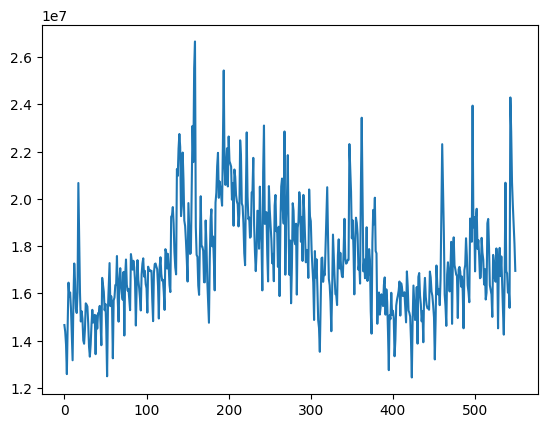

In [2723]:
df1["de"].plot()

[]

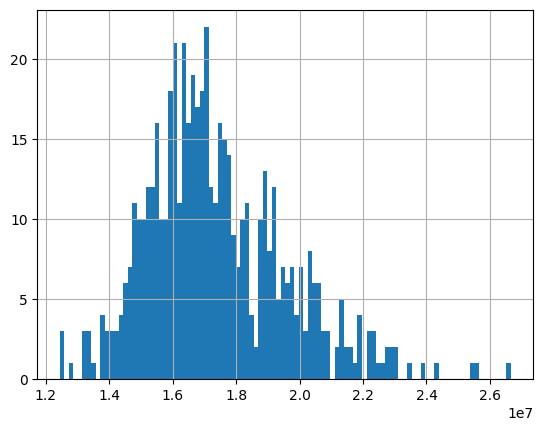

In [2724]:
df1["de"].hist(bins = 100).plot()

In [2725]:
lower = df1["de"].quantile(.005)
lower

12712509.889882708

In [2726]:
upper = df1["de"].quantile(.995)
upper

24581488.86434771

In [2727]:
df1["de"]

0      1.466309e+07
1      1.438609e+07
2      1.383201e+07
3      1.258722e+07
4      1.467169e+07
           ...     
545    2.070037e+07
546    1.973215e+07
547    1.895789e+07
548    1.809996e+07
549    1.695404e+07
Name: de, Length: 550, dtype: float64

In [2728]:
df1[df1["de"] > upper]

,Date,de
158,2015-12-06,2.552475e+07
159,2015-12-07,2.665841e+07
194,2016-01-11,2.543169e+07


In [2729]:
df1[df1["de"] < lower]

,Date,de
3,2015-07-04,1.258722e+07
52,2015-08-22,1.249569e+07
423,2016-08-27,1.244531e+07


In [2730]:
df1["de"] = df1["de"].clip(upper , lower )

<ipython-input-2730-1c7907c55bf0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["de"] = df1["de"].clip(upper , lower )


<Axes: >

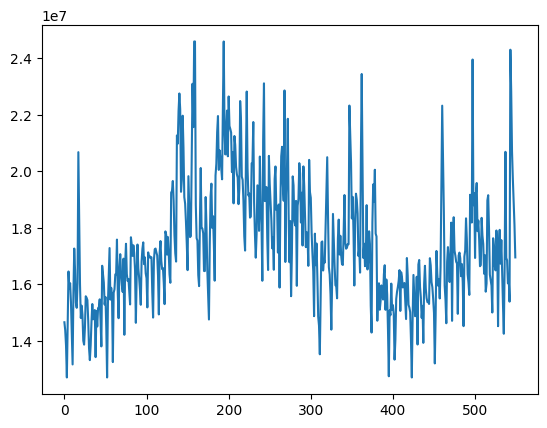

In [2731]:
df1["de"].plot()

In [2732]:
df1_exog = pd.concat([df1, exog], axis=1)
df1_exog

,Date,de,Exog
0,2015-07-01,1.466309e+07,0
1,2015-07-02,1.438609e+07,0
2,2015-07-03,1.383201e+07,0
3,2015-07-04,1.271251e+07,0
4,2015-07-05,1.467169e+07,0
...,...,...,...
545,2016-12-27,2.070037e+07,1
546,2016-12-28,1.973215e+07,1
547,2016-12-29,1.895789e+07,1
548,2016-12-30,1.809996e+07,0


## **Decomposition Time Series**

In [2733]:
df1.set_index("Date" , inplace = True)

In [2734]:
model = sm.tsa.seasonal_decompose(df1["de"] , model = "additive")

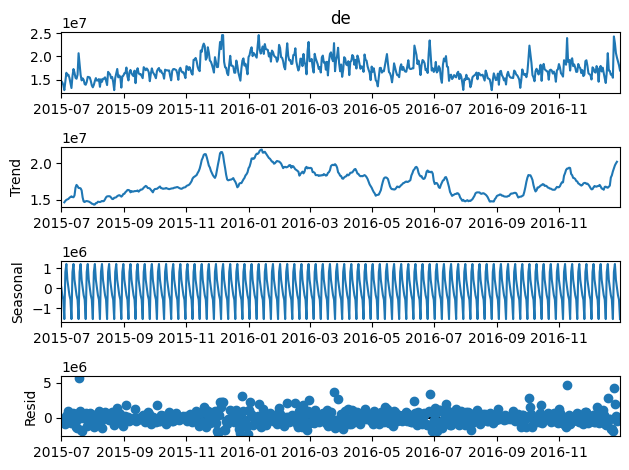

In [2735]:
model.plot()
plt.show()

In [2736]:
model = sm.tsa.seasonal_decompose(df1["de"] , model = "multiplicative")

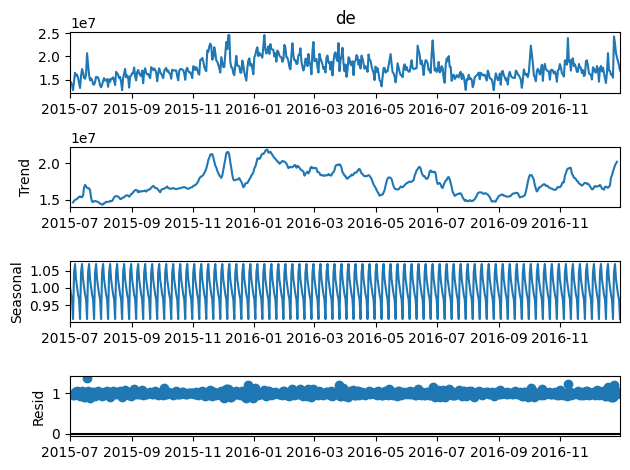

In [2737]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [2738]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [2739]:
model = sm.tsa.seasonal_decompose(df1["de"] , model = "additive")

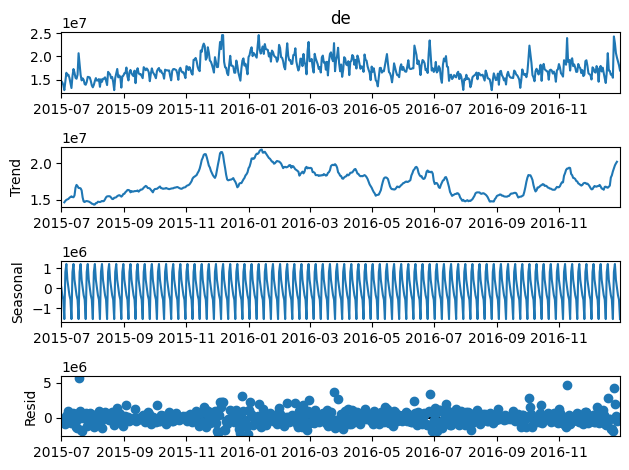

In [2740]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

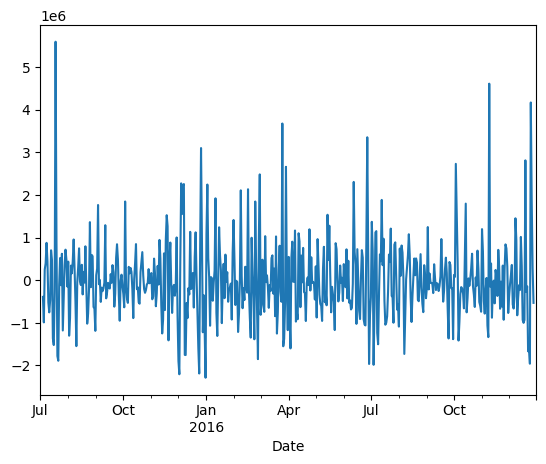

In [2741]:
model.resid.plot()

In [2742]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [2743]:
model = sm.tsa.seasonal_decompose(df1["de"] , model = "additive")

<Axes: xlabel='Date'>

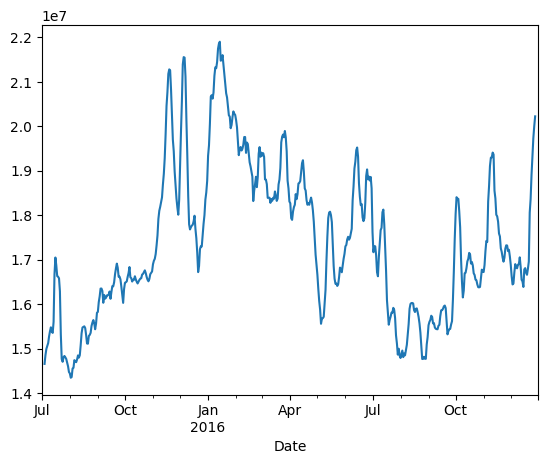

In [2744]:
model.trend.plot()

<Axes: xlabel='Date'>

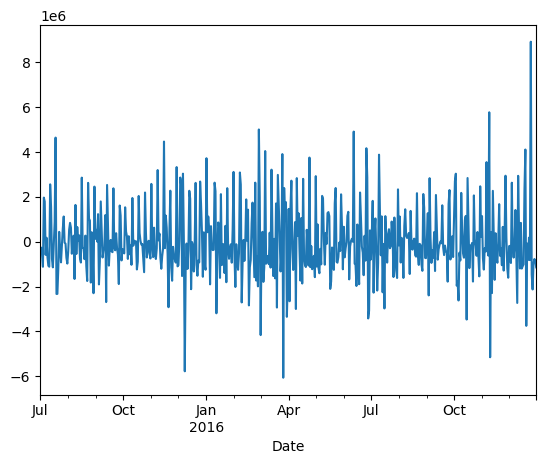

In [2745]:
df1["de"].diff(1).plot()

In [2746]:
adf_test(df1["de"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

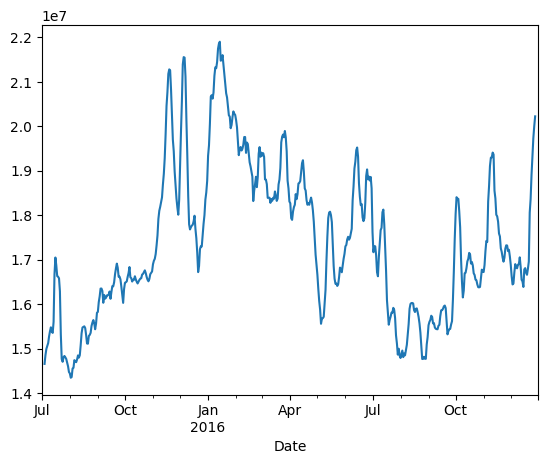

In [2747]:
model.trend.plot()

<Axes: xlabel='Date'>

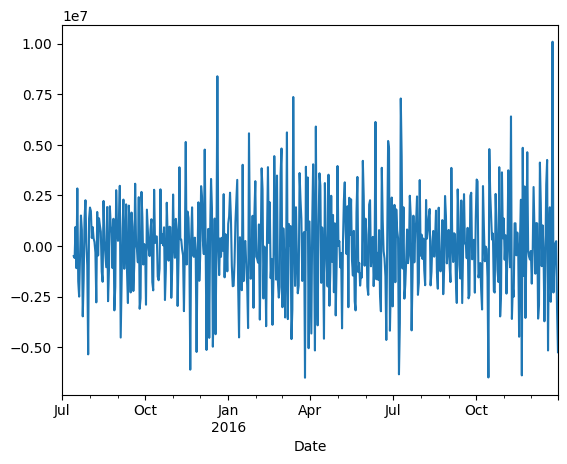

In [2748]:
df1["de"].diff(1).diff(12).plot()

In [2749]:
adf_test(df1["de"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [2750]:
df1.head()

,de
Date,
2015-07-01,1.466309e+07
2015-07-02,1.438609e+07
2015-07-03,1.383201e+07
2015-07-04,1.271251e+07
2015-07-05,1.467169e+07


In [2751]:
df1.reset_index(inplace = True)

In [2752]:
df1.head()

,Date,de
0,2015-07-01,1.466309e+07
1,2015-07-02,1.438609e+07
2,2015-07-03,1.383201e+07
3,2015-07-04,1.271251e+07
4,2015-07-05,1.467169e+07


In [2753]:
train_x = df1.loc[df1.index < df1.index[-110]].copy()

In [2754]:
test_x = df1.loc[df1.index >= df1.index[-110]].copy()

In [2755]:
train_x.head()

,Date,de
0,2015-07-01,1.466309e+07
1,2015-07-02,1.438609e+07
2,2015-07-03,1.383201e+07
3,2015-07-04,1.271251e+07
4,2015-07-05,1.467169e+07


In [2756]:
test_x.head()

,Date,de
440,2016-09-13,15854981.0
441,2016-09-14,15517174.0
442,2016-09-15,15375459.5
443,2016-09-16,15383771.5
444,2016-09-17,15309135.0


In [2757]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [2758]:
adf_test(train_x["de"])

Sequence is not Stationary


In [2759]:
model = SARIMAX(train_x["de"] , order = (15,1,15))

In [2760]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [2761]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

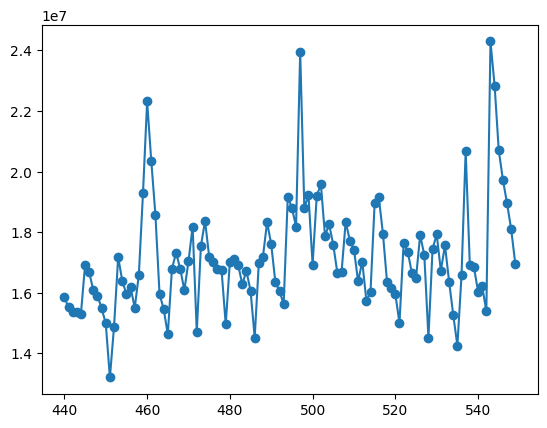

In [2762]:
test_x["de"].plot(style = "-o")

In [2763]:
test_x["de"].isnull().sum()

0

<Axes: >

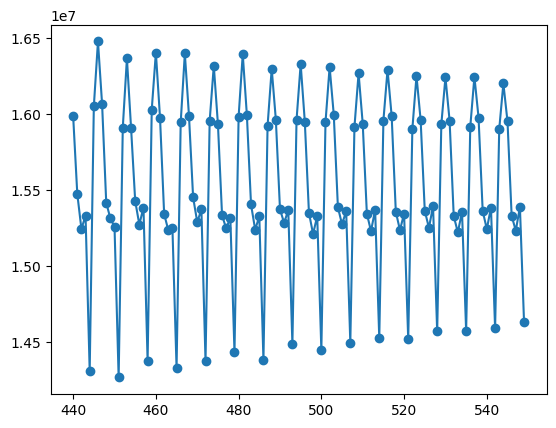

In [2764]:
test_x["pred"].plot(style = "-o")

In [2765]:
test_x["pred"].isnull().sum()

0

In [2766]:
performance(test_x["de"] , test_x["pred"])

MAE 1695682.35
RMSE 2315379.046
MAPE 0.092


## **SARIMA**

In [2767]:
adf_test(train_x["de"])

Sequence is not Stationary


In [2768]:
model = SARIMAX(train_x["de"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [2769]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [2770]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

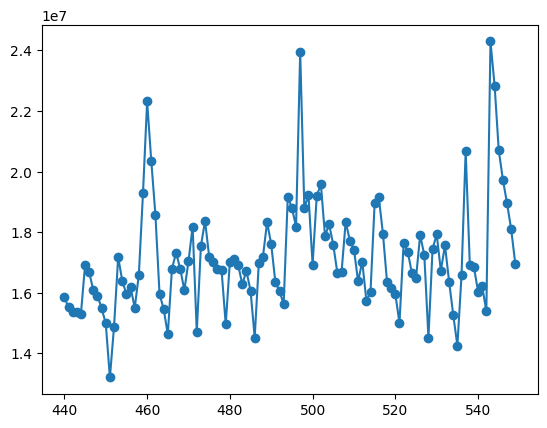

In [2771]:
test_x["de"].plot(style = "-o")

In [2772]:
test_x["de"].isnull().sum()

0

<Axes: >

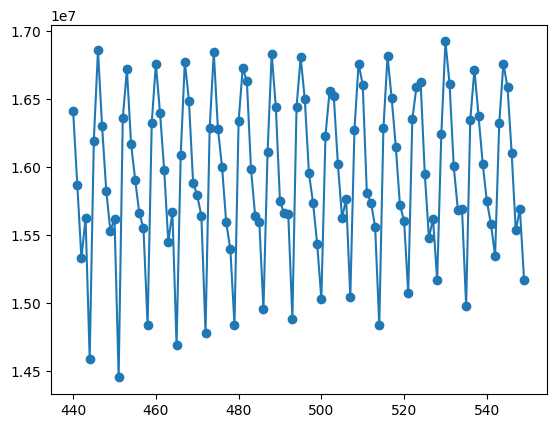

In [2773]:
test_x["pred"].plot(style = "-o")

In [2774]:
test_x["pred"].isnull().sum()

0

In [2775]:
performance(test_x["de"] , test_x["pred"])

MAE 1359757.088
RMSE 2019488.061
MAPE 0.073


## **SARIMAX without EXOG**

In [2776]:
train = df1_exog.iloc[:440]
train.head()

,Date,de,Exog
0,2015-07-01,1.466309e+07,0
1,2015-07-02,1.438609e+07,0
2,2015-07-03,1.383201e+07,0
3,2015-07-04,1.271251e+07,0
4,2015-07-05,1.467169e+07,0


In [2777]:
test = df1_exog.iloc[440:]
test.head()

,Date,de,Exog
440,2016-09-13,15854981.0,0
441,2016-09-14,15517174.0,0
442,2016-09-15,15375459.5,0
443,2016-09-16,15383771.5,0
444,2016-09-17,15309135.0,0


In [2778]:
model = SARIMAX(train["de"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [2779]:
results = model.fit(disp=False)

In [2780]:
fc = results.forecast(110)

In [2781]:
start = len(train_x)

In [2782]:
end = len(train_x) + len(test_x) - 1

In [2783]:
predictions = results.predict(start = start , end = end)
predictions

440    1.599075e+07
441    1.571972e+07
442    1.548362e+07
443    1.539665e+07
444    1.402790e+07
           ...     
545    1.514072e+07
546    1.489700e+07
547    1.468353e+07
548    1.460954e+07
549    1.331475e+07
Name: predicted_mean, Length: 110, dtype: float64

In [2784]:
performance(test["de"] , predictions)

MAE 2024462.362
RMSE 2597567.58
MAPE 0.111


***Plot predictions against known values***

In [2785]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

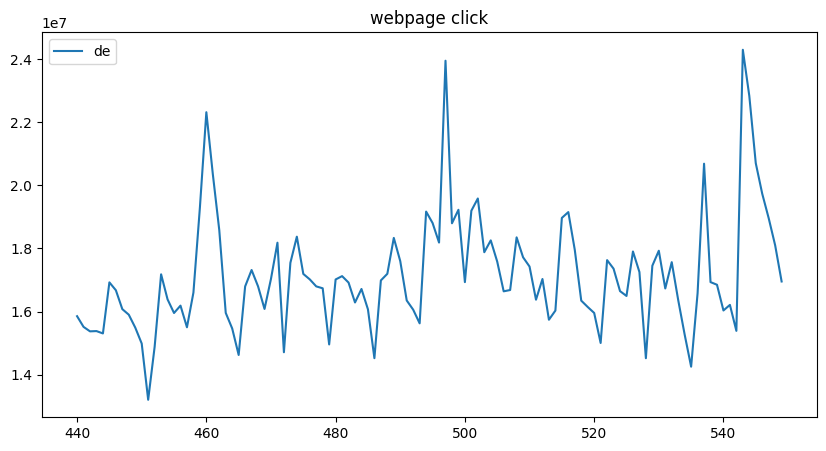

In [2786]:
ax = test["de"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

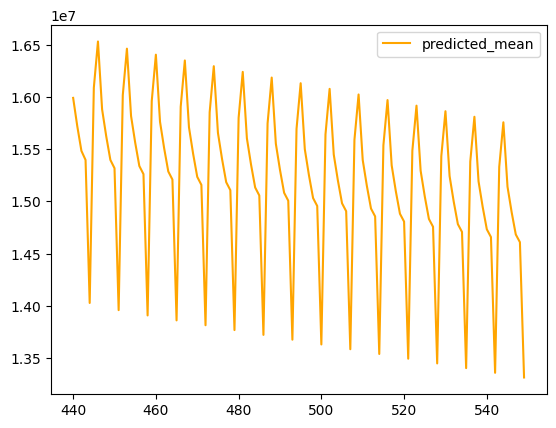

In [2787]:
predictions.plot(legend = True , color = "orange")

In [2788]:
ax.autoscale (axis = "x" , tight = True)

In [2789]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [2790]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [2791]:
train = df1_exog.iloc[:440]
train.head()

,Date,de,Exog
0,2015-07-01,1.466309e+07,0
1,2015-07-02,1.438609e+07,0
2,2015-07-03,1.383201e+07,0
3,2015-07-04,1.271251e+07,0
4,2015-07-05,1.467169e+07,0


In [2792]:
test = df1_exog.iloc[440:]
test.head()

,Date,de,Exog
440,2016-09-13,15854981.0,0
441,2016-09-14,15517174.0,0
442,2016-09-15,15375459.5,0
443,2016-09-16,15383771.5,0
444,2016-09-17,15309135.0,0


In [2793]:
model = SARIMAX(train["de"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [2794]:
results = model.fit(disp=False)

In [2795]:
exog_forecast = test[["Exog"]]

In [2796]:
start = len(train_x)

In [2797]:
end = len(train_x) + len(test_x) - 1

In [2798]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    1.537509e+07
441    1.498084e+07
442    1.407377e+07
443    1.335220e+07
444    1.171707e+07
           ...     
545    2.453650e+07
546    2.472202e+07
547    2.440872e+07
548    8.196218e+06
549    7.159670e+06
Name: Predictions, Length: 110, dtype: float64

In [2799]:
performance(test["de"] , predictions)

MAE 7247066.021
RMSE 7619024.088
MAPE 0.42


***Plot predictions against known values***

In [2800]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

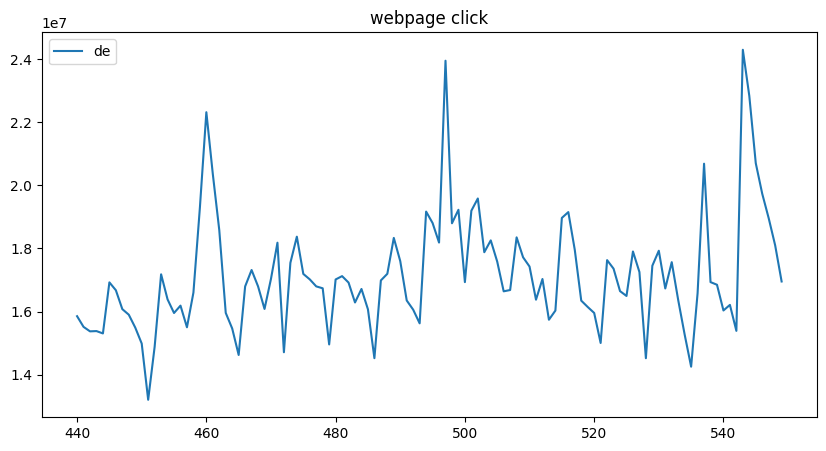

In [2801]:
ax = test["de"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

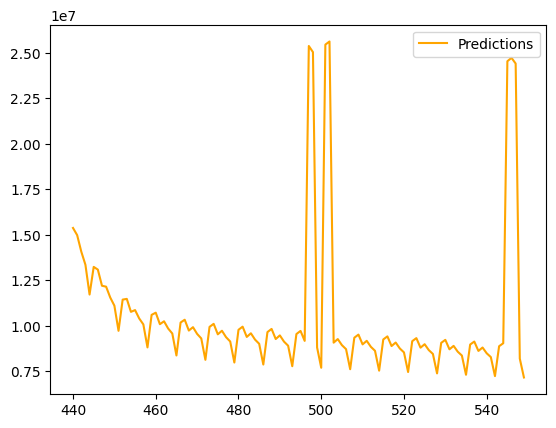

In [2802]:
predictions.plot(legend = True , color = "orange")

In [2803]:
ax.autoscale (axis = "x" , tight = True)

In [2804]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [2805]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

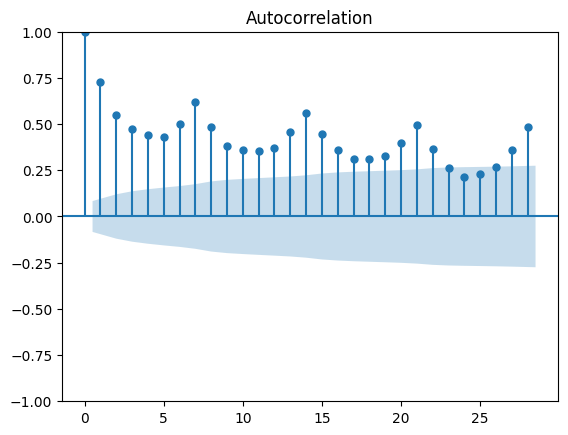

In [2806]:
plot_acf(df1["de"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


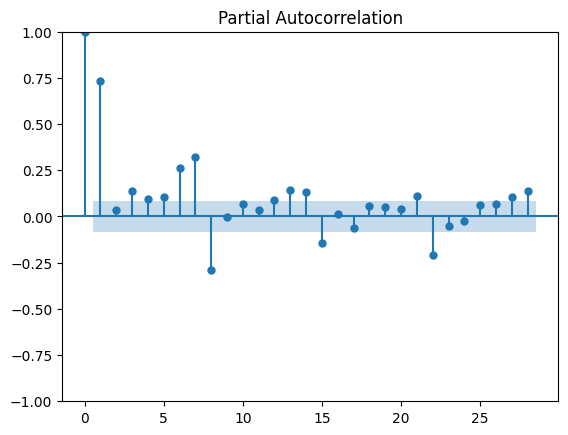

In [2807]:
plot_pacf(df1["de"])
plt.show()

## **Facebook Prophet**

In [2808]:
df1_exog.head()

,Date,de,Exog
0,2015-07-01,1.466309e+07,0
1,2015-07-02,1.438609e+07,0
2,2015-07-03,1.383201e+07,0
3,2015-07-04,1.271251e+07,0
4,2015-07-05,1.467169e+07,0


In [2809]:
df1_fb = df1_exog.copy()

In [2810]:
df1_fb.head()

,Date,de,Exog
0,2015-07-01,1.466309e+07,0
1,2015-07-02,1.438609e+07,0
2,2015-07-03,1.383201e+07,0
3,2015-07-04,1.271251e+07,0
4,2015-07-05,1.467169e+07,0


In [2811]:
df1_fb["ds"] = pd.to_datetime(df1_fb["Date"])

In [2812]:
df1_fb["y"] = df1_fb["de"]

In [2813]:
df1_fb = df1_fb[["ds" , "y" , "Exog"]]

In [2814]:
df1_fb.head()

,ds,y,Exog
0,2015-07-01,1.466309e+07,0
1,2015-07-02,1.438609e+07,0
2,2015-07-03,1.383201e+07,0
3,2015-07-04,1.271251e+07,0
4,2015-07-05,1.467169e+07,0


In [2815]:
from fbprophet import Prophet

In [2816]:
m = Prophet()

In [2817]:
m.fit(df1_fb[['ds', 'y']][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [2818]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [2819]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [2820]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,1.439793e+07,1.253825e+07,1.627141e+07,1.439793e+07,1.439793e+07,-1.161501e+04,-1.161501e+04,-1.161501e+04,-1.161501e+04,-1.161501e+04,-1.161501e+04,0.0,0.0,0.0,1.438631e+07
1,2015-07-02,1.442505e+07,1.225518e+07,1.598342e+07,1.442505e+07,1.442505e+07,-3.438488e+05,-3.438488e+05,-3.438488e+05,-3.438488e+05,-3.438488e+05,-3.438488e+05,0.0,0.0,0.0,1.408120e+07
2,2015-07-03,1.445217e+07,1.208796e+07,1.562186e+07,1.445217e+07,1.445217e+07,-5.315895e+05,-5.315895e+05,-5.315895e+05,-5.315895e+05,-5.315895e+05,-5.315895e+05,0.0,0.0,0.0,1.392058e+07
3,2015-07-04,1.447929e+07,1.124091e+07,1.486109e+07,1.447929e+07,1.447929e+07,-1.466781e+06,-1.466781e+06,-1.466781e+06,-1.466781e+06,-1.466781e+06,-1.466781e+06,0.0,0.0,0.0,1.301251e+07
4,2015-07-05,1.450642e+07,1.350237e+07,1.710454e+07,1.450642e+07,1.450642e+07,7.873813e+05,7.873813e+05,7.873813e+05,7.873813e+05,7.873813e+05,7.873813e+05,0.0,0.0,0.0,1.529380e+07


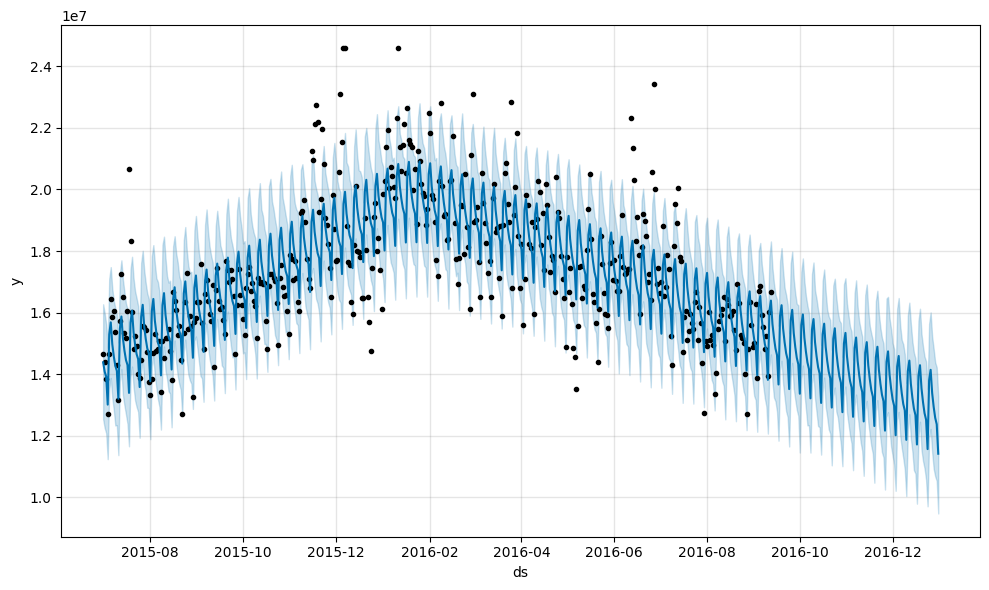

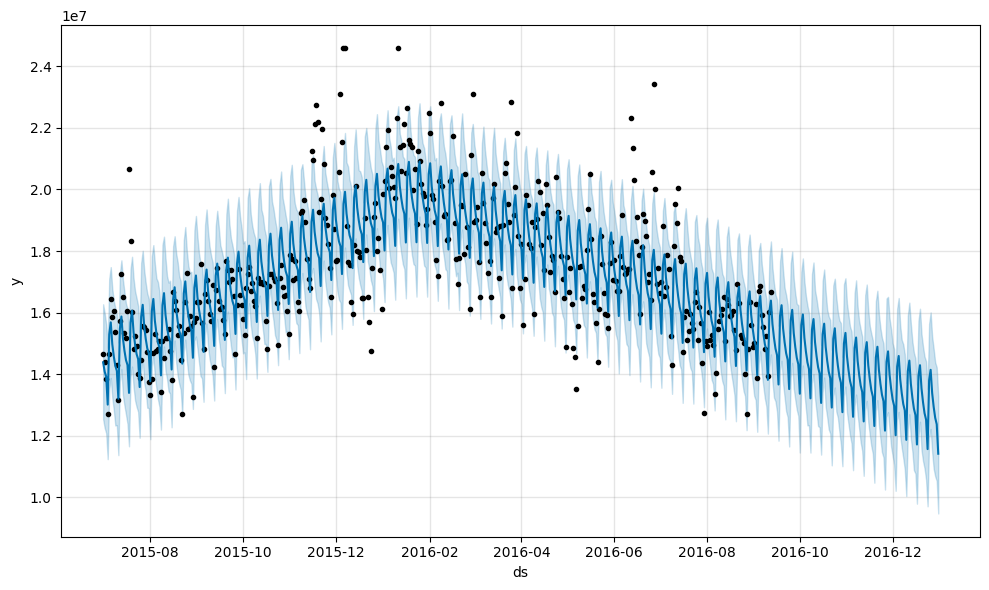

In [2821]:
m.plot(forecast)

<Axes: >

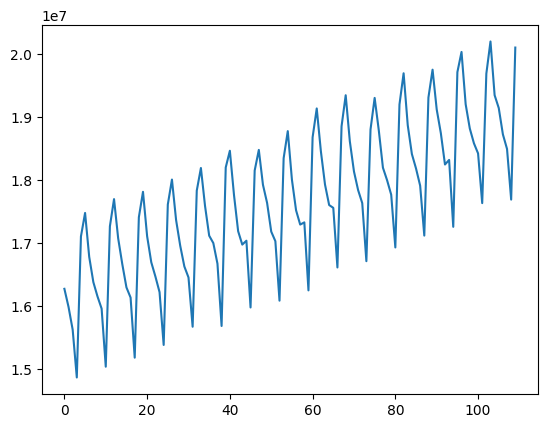

In [2822]:
forecast["yhat_upper"][:110].plot()

<Axes: >

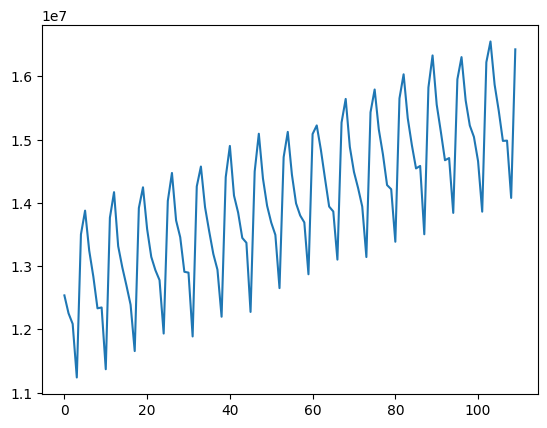

In [2823]:
forecast["yhat_lower"][:110].plot()

<Axes: >

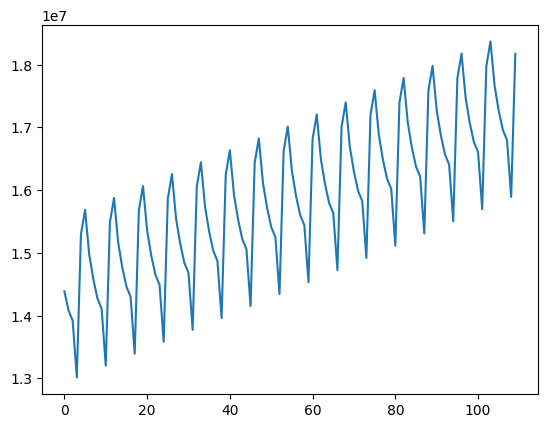

In [2824]:
forecast["yhat"][:110].plot()

In [2825]:
performance(df1_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 1011507.694
RMSE 1404043.751
MAPE 0.057


### **without Exog Variable**

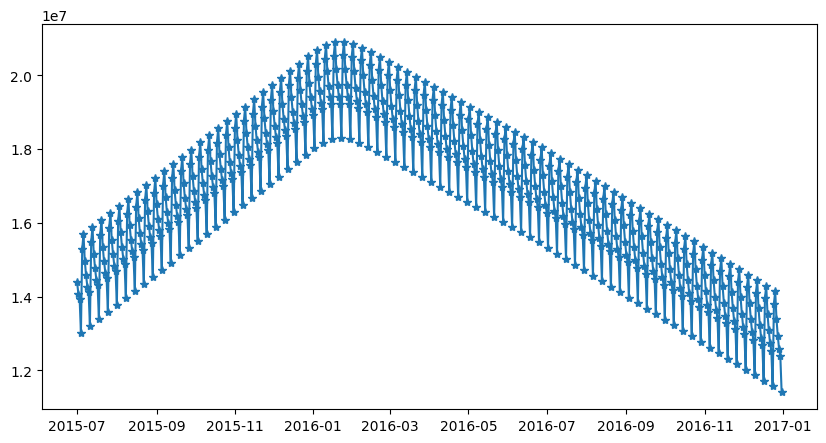

In [2826]:
plt.figure(figsize = (10,5))
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

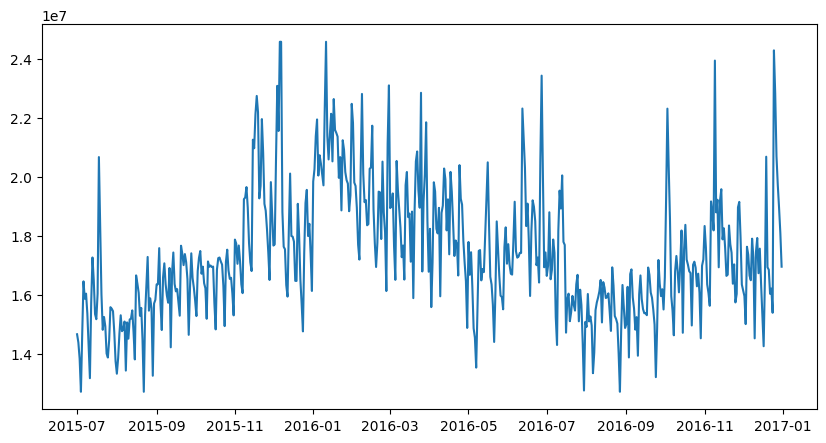

In [2827]:
plt.figure(figsize = (10,5))

plt.plot(df1_fb["ds"] , df1_fb["y"] , label = "actual")

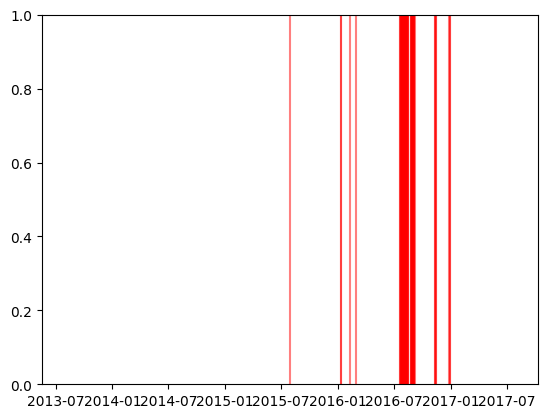

In [2828]:
for x in df1_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)


### **with Exog Variable**

In [2829]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [2830]:
model2.add_regressor("Exog")

In [2831]:
model2.fit(df1_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [2832]:
forecast2 = model2.predict(df1_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


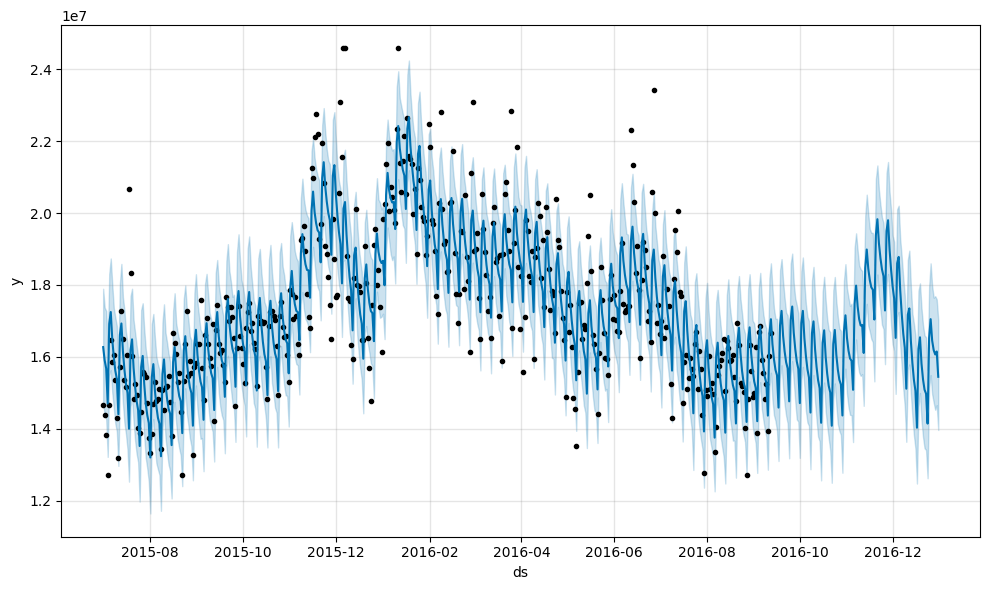

In [2833]:
fig = model2.plot(forecast2)

In [2834]:
performance(df1_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 826989.884
RMSE 1162681.462
MAPE 0.047


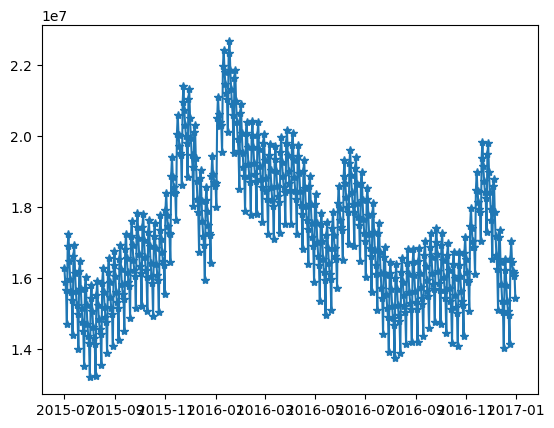

In [2835]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

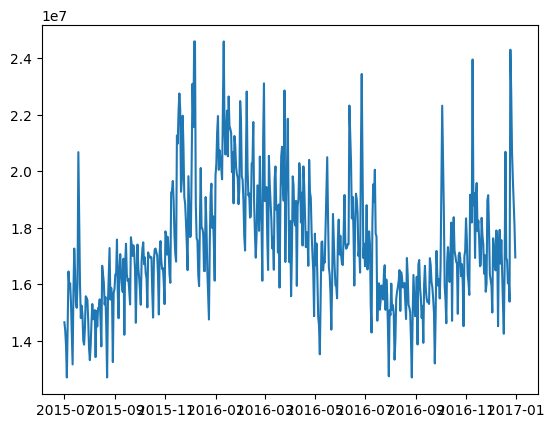

In [2836]:
plt.plot(df1_fb["ds"] , df1_fb["y"] , label = "actual")

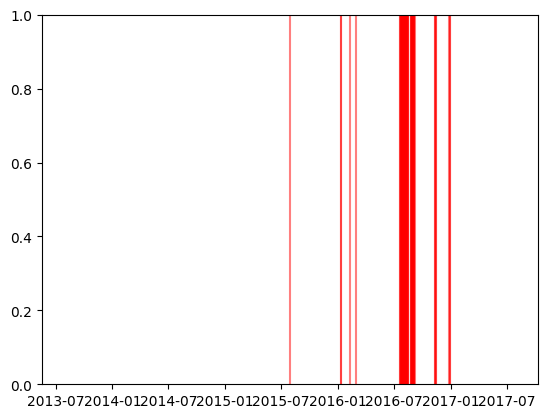

In [2837]:
for x in df1_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Second Language is "en"**

## **Observation**

In [2838]:
df2 = df_new[["Date" , "en"]]
df2.head()

,Date,en
0,2015-07-01,1.067432e+08
1,2015-07-02,1.058930e+08
2,2015-07-03,1.004565e+08
3,2015-07-04,1.042186e+08
4,2015-07-05,1.080641e+08


In [2839]:
df2.columns

Index(['Date', 'en'], dtype='object')

In [2840]:
df2.dtypes

Date    datetime64[ns]
en             float64
dtype: object

In [2841]:
df2.shape

(550, 2)

In [2842]:
df2["en"].describe()

count    5.500000e+02
mean     1.147396e+08
std      1.998168e+07
min      8.972690e+07
25%      1.038630e+08
50%      1.096287e+08
75%      1.180671e+08
max      2.041106e+08
Name: en, dtype: float64

In [2843]:
df2["Date"].describe()

<ipython-input-2843-01850e961ca9>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df2["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

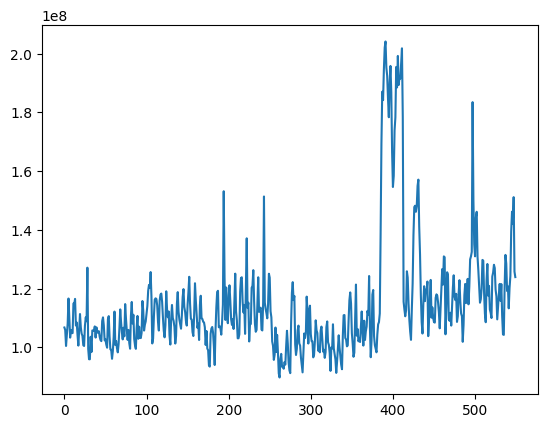

In [2844]:
df2["en"].plot()

[]

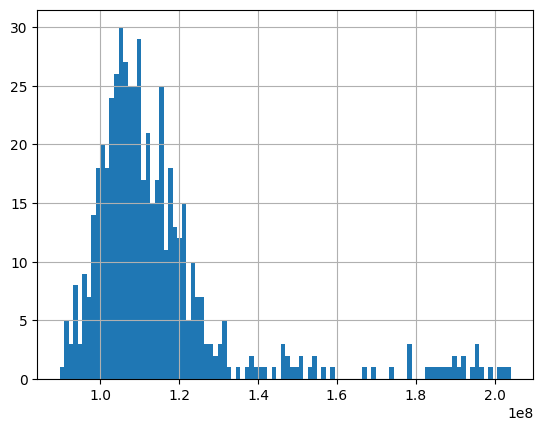

In [2845]:
df2["en"].hist(bins = 100).plot()

In [2846]:
lower = df2["en"].quantile(.005)
lower

91268066.51673122

In [2847]:
upper = df2["en"].quantile(.995)
upper

199846393.44394937

In [2848]:
df2["en"]

0      1.067432e+08
1      1.058930e+08
2      1.004565e+08
3      1.042186e+08
4      1.080641e+08
           ...     
545    1.461716e+08
546    1.419851e+08
547    1.511196e+08
548    1.257803e+08
549    1.238984e+08
Name: en, Length: 550, dtype: float64

In [2849]:
df2[df2["en"] > upper]

,Date,en
390,2016-07-25,2.020382e+08
391,2016-07-26,2.041106e+08
411,2016-08-15,2.017826e+08


In [2850]:
df2[df2["en"] < lower]

,Date,en
261,2016-03-18,9.111451e+07
262,2016-03-19,8.972690e+07
275,2016-04-01,9.120518e+07


In [2851]:
df2["en"].clip(upper , lower )

0      1.067432e+08
1      1.058930e+08
2      1.004565e+08
3      1.042186e+08
4      1.080641e+08
           ...     
545    1.461716e+08
546    1.419851e+08
547    1.511196e+08
548    1.257803e+08
549    1.238984e+08
Name: en, Length: 550, dtype: float64

<Axes: >

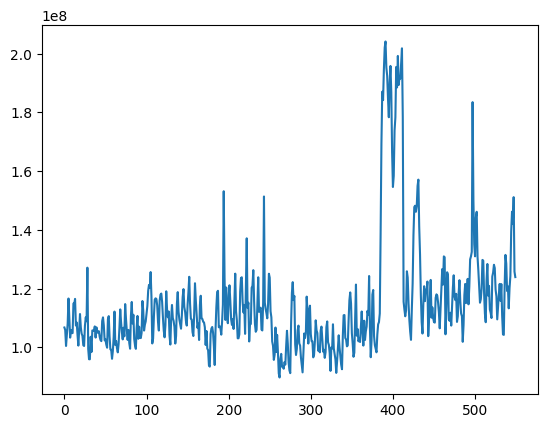

In [2852]:
df2["en"].plot()

In [2853]:
df2_exog = pd.concat([df2, exog], axis=1)
df2_exog

,Date,en,Exog
0,2015-07-01,1.067432e+08,0
1,2015-07-02,1.058930e+08,0
2,2015-07-03,1.004565e+08,0
3,2015-07-04,1.042186e+08,0
4,2015-07-05,1.080641e+08,0
...,...,...,...
545,2016-12-27,1.461716e+08,1
546,2016-12-28,1.419851e+08,1
547,2016-12-29,1.511196e+08,1
548,2016-12-30,1.257803e+08,0


## **Decomposition Time Series**

In [2854]:
df2.set_index("Date" , inplace = True)

In [2855]:
model = sm.tsa.seasonal_decompose(df2["en"] , model = "additive")

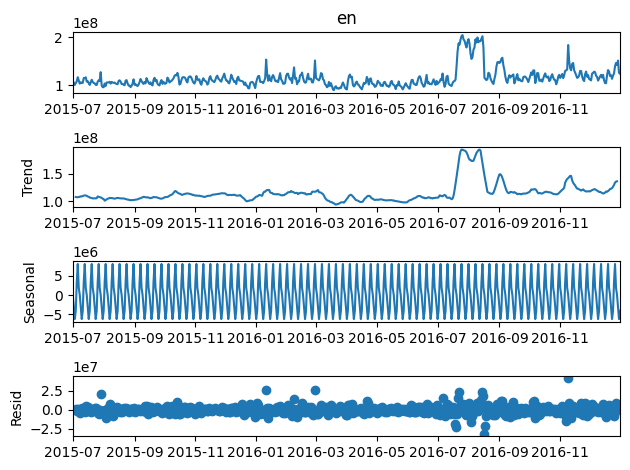

In [2856]:
model.plot()
plt.show()

In [2857]:
model = sm.tsa.seasonal_decompose(df2["en"] , model = "multiplicative")

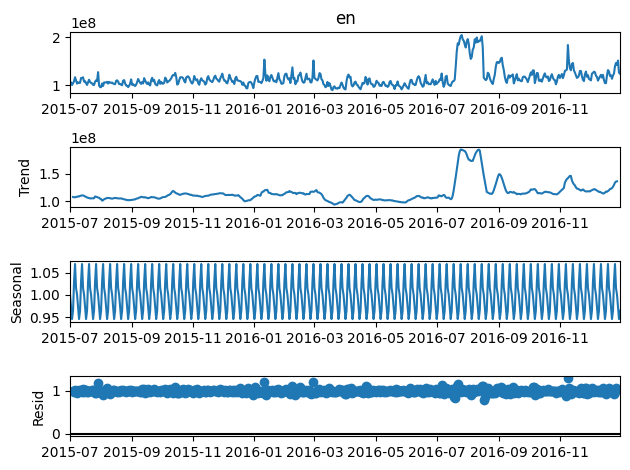

In [2858]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [2859]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [2860]:
model = sm.tsa.seasonal_decompose(df2["en"] , model = "additive")

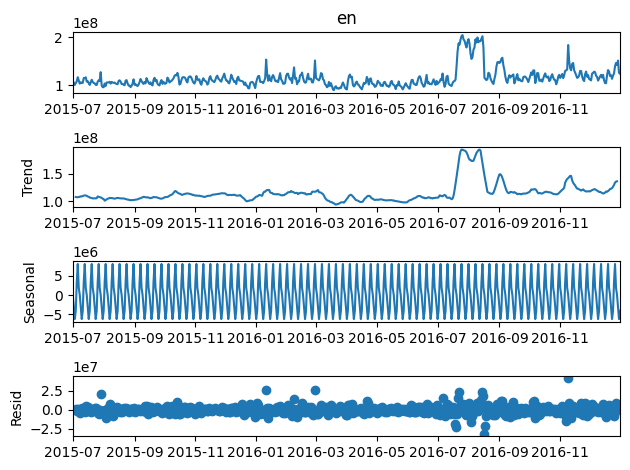

In [2861]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

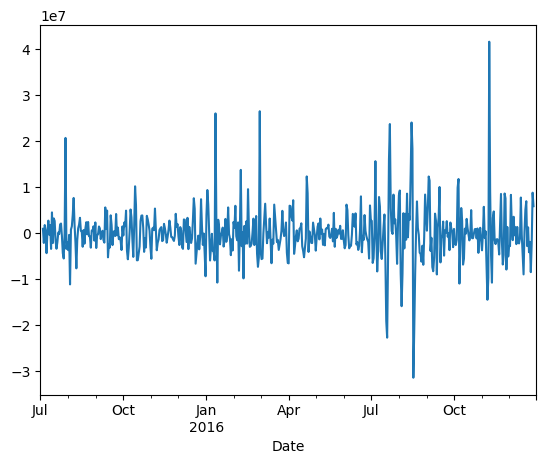

In [2862]:
model.resid.plot()

In [2863]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [2864]:
model = sm.tsa.seasonal_decompose(df2["en"] , model = "additive")

<Axes: xlabel='Date'>

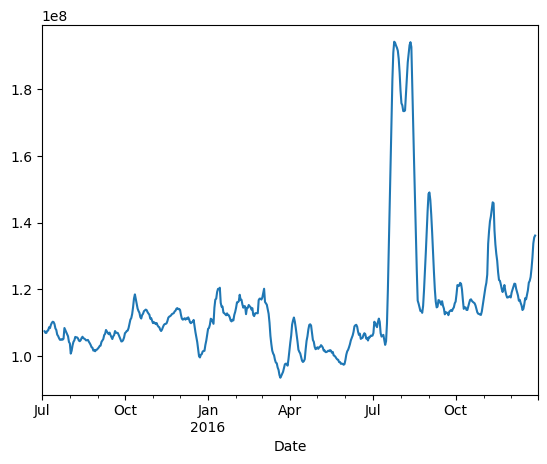

In [2865]:
model.trend.plot()

<Axes: xlabel='Date'>

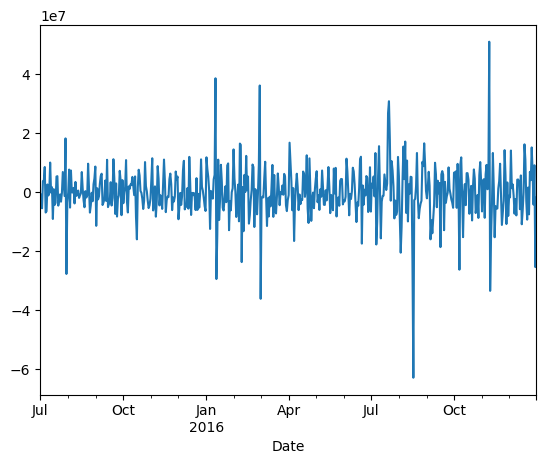

In [2866]:
df2["en"].diff(1).plot()

In [2867]:
adf_test(df2["en"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

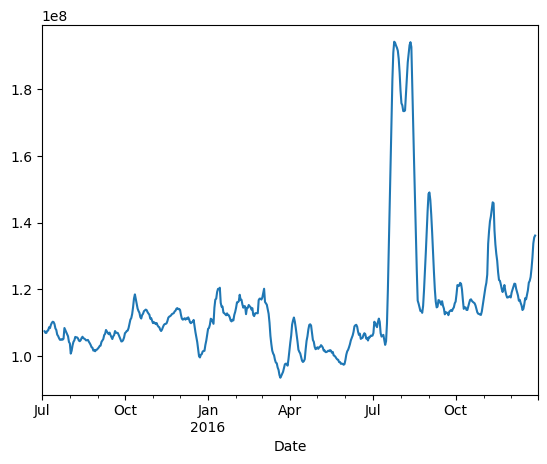

In [2868]:
model.trend.plot()

<Axes: xlabel='Date'>

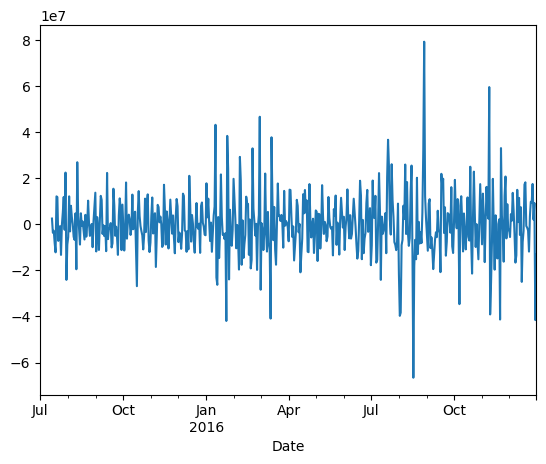

In [2869]:
df2["en"].diff(1).diff(12).plot()

In [2870]:
adf_test(df2["en"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [2871]:
df2.head()

,en
Date,
2015-07-01,1.067432e+08
2015-07-02,1.058930e+08
2015-07-03,1.004565e+08
2015-07-04,1.042186e+08
2015-07-05,1.080641e+08


In [2872]:
df2.reset_index(inplace = True)

In [2873]:
df2.head()

,Date,en
0,2015-07-01,1.067432e+08
1,2015-07-02,1.058930e+08
2,2015-07-03,1.004565e+08
3,2015-07-04,1.042186e+08
4,2015-07-05,1.080641e+08


In [2874]:
train_x = df2.loc[df2.index < df2.index[-110]].copy()

In [2875]:
test_x = df2.loc[df2.index >= df2.index[-110]].copy()

In [2876]:
train_x.head()

,Date,en
0,2015-07-01,1.067432e+08
1,2015-07-02,1.058930e+08
2,2015-07-03,1.004565e+08
3,2015-07-04,1.042186e+08
4,2015-07-05,1.080641e+08


In [2877]:
test_x.head()

,Date,en
440,2016-09-13,1.196080e+08
441,2016-09-14,1.192408e+08
442,2016-09-15,1.223824e+08
443,2016-09-16,1.037995e+08
444,2016-09-17,1.098329e+08


In [2878]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [2879]:
adf_test(train_x["en"])

Sequence is not Stationary


In [2880]:
model = SARIMAX(train_x["en"] , order = (15,1,15))

In [2881]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [2882]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

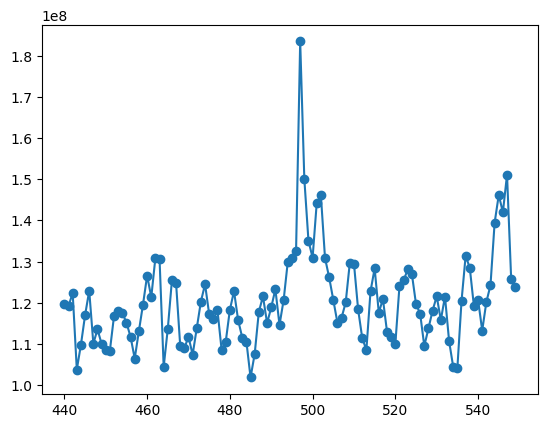

In [2883]:
test_x["en"].plot(style = "-o")

In [2884]:
test_x["en"].isnull().sum()

0

<Axes: >

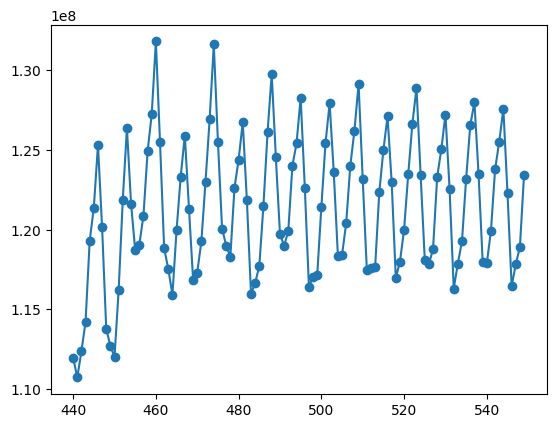

In [2885]:
test_x["pred"].plot(style = "-o")

In [2886]:
test_x["pred"].isnull().sum()

0

In [2887]:
performance(test_x["en"] , test_x["pred"])

MAE 8067571.894
RMSE 11534207.373
MAPE 0.065


## **SARIMA**

In [2888]:
adf_test(train_x["en"])

Sequence is not Stationary


In [2889]:
model = SARIMAX(train_x["en"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [2890]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [2891]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

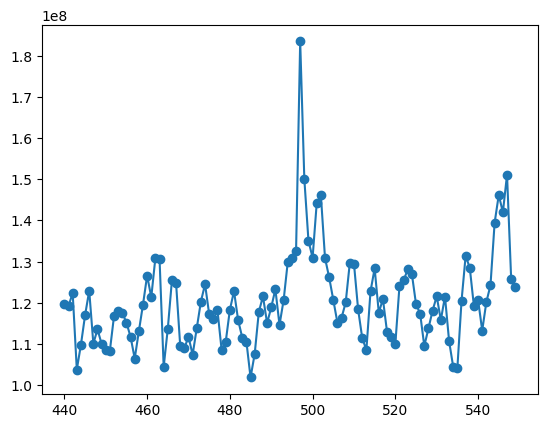

In [2892]:
test_x["en"].plot(style = "-o")

In [2893]:
test_x["en"].isnull().sum()

0

<Axes: >

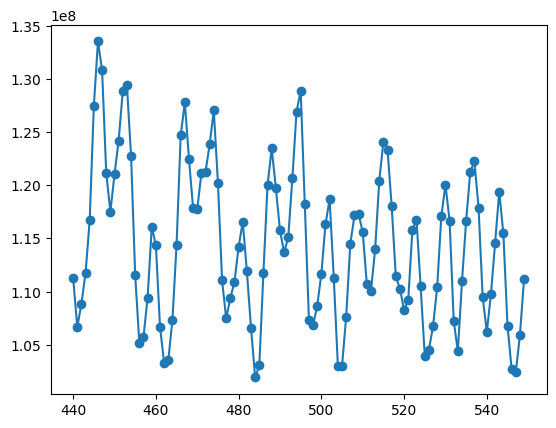

In [2894]:
test_x["pred"].plot(style = "-o")

In [2895]:
test_x["pred"].isnull().sum()

0

In [2896]:
performance(test_x["en"] , test_x["pred"])

MAE 10430533.433
RMSE 15393646.739
MAPE 0.082


## **SARIMAX without EXOG**

In [2897]:
train = df2_exog.iloc[:440]
train.head()

,Date,en,Exog
0,2015-07-01,1.067432e+08,0
1,2015-07-02,1.058930e+08,0
2,2015-07-03,1.004565e+08,0
3,2015-07-04,1.042186e+08,0
4,2015-07-05,1.080641e+08,0


In [2898]:
test = df2_exog.iloc[440:]
test.head()

,Date,en,Exog
440,2016-09-13,1.196080e+08,0
441,2016-09-14,1.192408e+08,0
442,2016-09-15,1.223824e+08,0
443,2016-09-16,1.037995e+08,0
444,2016-09-17,1.098329e+08,0


In [2899]:
model = SARIMAX(train["en"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [2900]:
results = model.fit(disp=False)

In [2901]:
fc = results.forecast(110)

In [2902]:
start = len(train_x)

In [2903]:
end = len(train_x) + len(test_x) - 1

In [2904]:
predictions = results.predict(start = start , end = end)
predictions

440    1.094695e+08
441    1.055519e+08
442    1.032617e+08
443    1.021199e+08
444    1.052655e+08
           ...     
545    1.112231e+08
546    1.072515e+08
547    1.048501e+08
548    1.035587e+08
549    1.063920e+08
Name: predicted_mean, Length: 110, dtype: float64

In [2905]:
performance(test["en"] , predictions)

MAE 10938643.251
RMSE 15346313.321
MAPE 0.085


***Plot predictions against known values***

In [2906]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

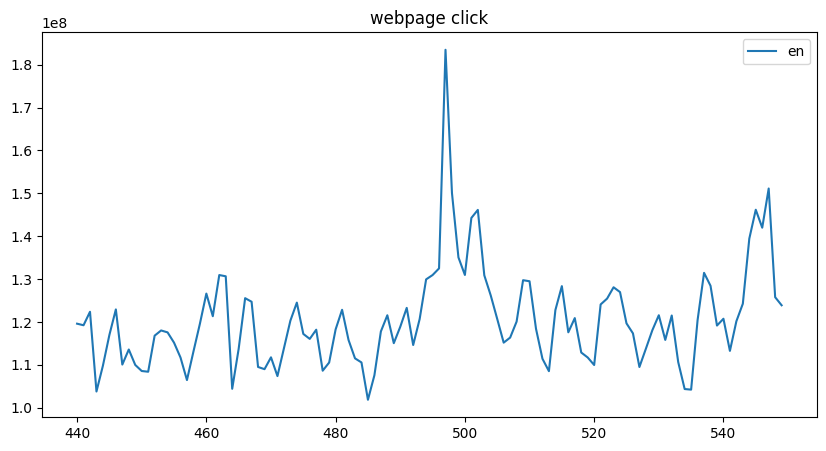

In [2907]:
ax = test["en"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

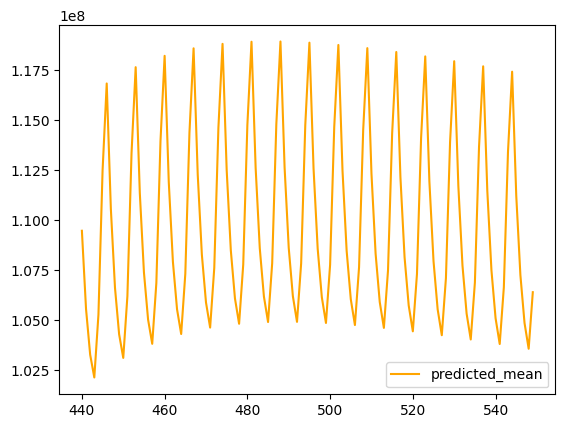

In [2908]:
predictions.plot(legend = True , color = "orange")

In [2909]:
ax.autoscale (axis = "x" , tight = True)

In [2910]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [2911]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [2912]:
train = df2_exog.iloc[:440]
train.head()

,Date,en,Exog
0,2015-07-01,1.067432e+08,0
1,2015-07-02,1.058930e+08,0
2,2015-07-03,1.004565e+08,0
3,2015-07-04,1.042186e+08,0
4,2015-07-05,1.080641e+08,0


In [2913]:
test = df2_exog.iloc[440:]
test.head()

,Date,en,Exog
440,2016-09-13,1.196080e+08,0
441,2016-09-14,1.192408e+08,0
442,2016-09-15,1.223824e+08,0
443,2016-09-16,1.037995e+08,0
444,2016-09-17,1.098329e+08,0


In [2914]:
model = SARIMAX(train["en"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [2915]:
results = model.fit(disp=False)

In [2916]:
exog_forecast = test[["Exog"]]

In [2917]:
start = len(train_x)

In [2918]:
end = len(train_x) + len(test_x) - 1

In [2919]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    9.891486e+07
441    9.004479e+07
442    8.042127e+07
443    7.404921e+07
444    7.401276e+07
           ...     
545    2.256957e+08
546    2.252005e+08
547    2.220510e+08
548    5.614156e+07
549    5.942604e+07
Name: Predictions, Length: 110, dtype: float64

In [2920]:
performance(test["en"] , predictions)

MAE 55323930.576
RMSE 56367146.012
MAPE 0.458


***Plot predictions against known values***

In [2921]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

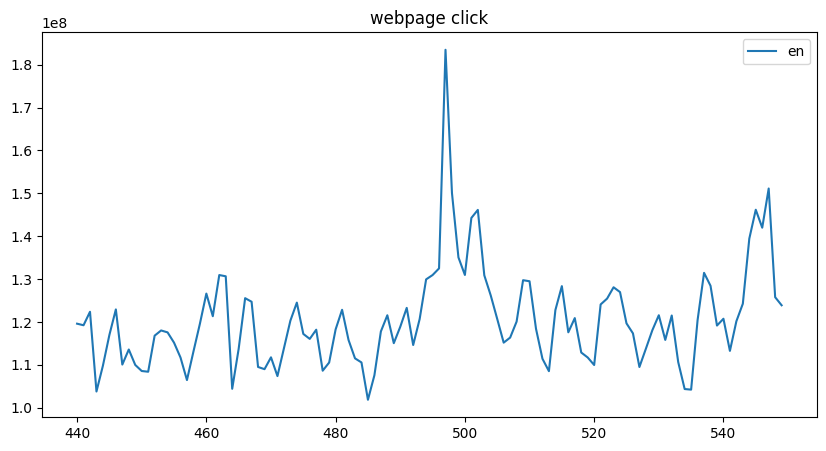

In [2922]:
ax = test["en"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

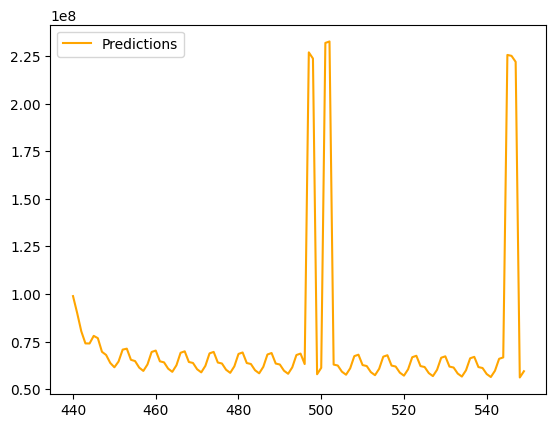

In [2923]:
predictions.plot(legend = True , color = "orange")

In [2924]:
ax.autoscale (axis = "x" , tight = True)

In [2925]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [2926]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

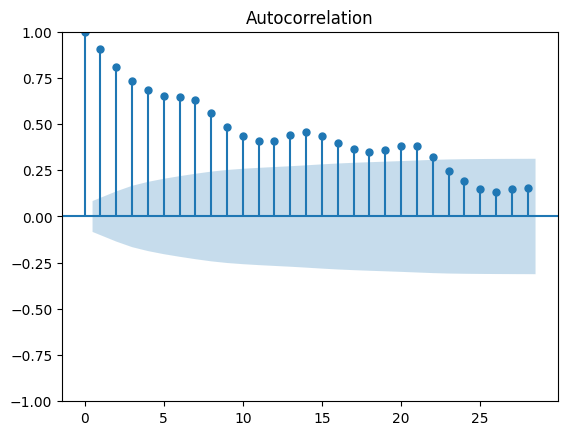

In [2927]:
plot_acf(df2["en"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


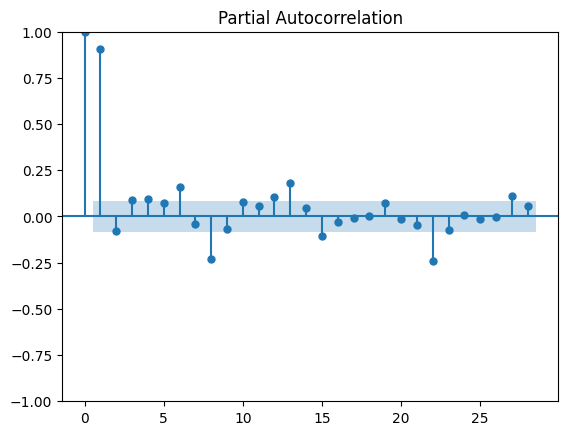

In [2928]:
plot_pacf(df2["en"])
plt.show()

## **Facebook Prophet**

In [2929]:
df2_exog.head()

,Date,en,Exog
0,2015-07-01,1.067432e+08,0
1,2015-07-02,1.058930e+08,0
2,2015-07-03,1.004565e+08,0
3,2015-07-04,1.042186e+08,0
4,2015-07-05,1.080641e+08,0


In [2930]:
df2_fb = df2_exog.copy()

In [2931]:
df2_fb.head()

,Date,en,Exog
0,2015-07-01,1.067432e+08,0
1,2015-07-02,1.058930e+08,0
2,2015-07-03,1.004565e+08,0
3,2015-07-04,1.042186e+08,0
4,2015-07-05,1.080641e+08,0


In [2932]:
df2_fb["ds"] = pd.to_datetime(df2_fb["Date"])

In [2933]:
df2_fb["y"] = df2_fb["en"]

In [2934]:
df2_fb = df2_fb[["ds" , "y" , "Exog"]]

In [2935]:
df2_fb.head()

,ds,y,Exog
0,2015-07-01,1.067432e+08,0
1,2015-07-02,1.058930e+08,0
2,2015-07-03,1.004565e+08,0
3,2015-07-04,1.042186e+08,0
4,2015-07-05,1.080641e+08,0


In [2936]:
from fbprophet import Prophet

In [2937]:
m = Prophet()

In [2938]:
m.fit(df2_fb[["ds" , "y"]][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [2939]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [2940]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [2941]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,1.071547e+08,8.605071e+07,1.286755e+08,1.071547e+08,1.071547e+08,-5.648319e+05,-5.648319e+05,-5.648319e+05,-5.648319e+05,-5.648319e+05,-5.648319e+05,0.0,0.0,0.0,1.065898e+08
1,2015-07-02,1.071635e+08,8.347104e+07,1.235524e+08,1.071635e+08,1.071635e+08,-3.390814e+06,-3.390814e+06,-3.390814e+06,-3.390814e+06,-3.390814e+06,-3.390814e+06,0.0,0.0,0.0,1.037727e+08
2,2015-07-03,1.071724e+08,8.016662e+07,1.230143e+08,1.071724e+08,1.071724e+08,-5.420869e+06,-5.420869e+06,-5.420869e+06,-5.420869e+06,-5.420869e+06,-5.420869e+06,0.0,0.0,0.0,1.017515e+08
3,2015-07-04,1.071813e+08,8.046213e+07,1.241938e+08,1.071813e+08,1.071813e+08,-4.043320e+06,-4.043320e+06,-4.043320e+06,-4.043320e+06,-4.043320e+06,-4.043320e+06,0.0,0.0,0.0,1.031380e+08
4,2015-07-05,1.071901e+08,8.874819e+07,1.305889e+08,1.071901e+08,1.071901e+08,3.265394e+06,3.265394e+06,3.265394e+06,3.265394e+06,3.265394e+06,3.265394e+06,0.0,0.0,0.0,1.104555e+08


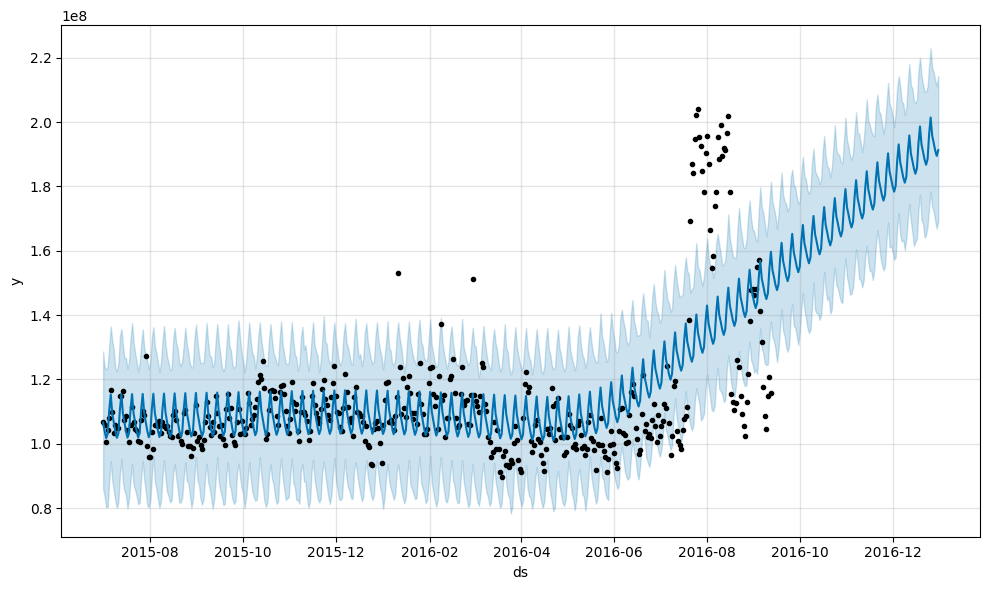

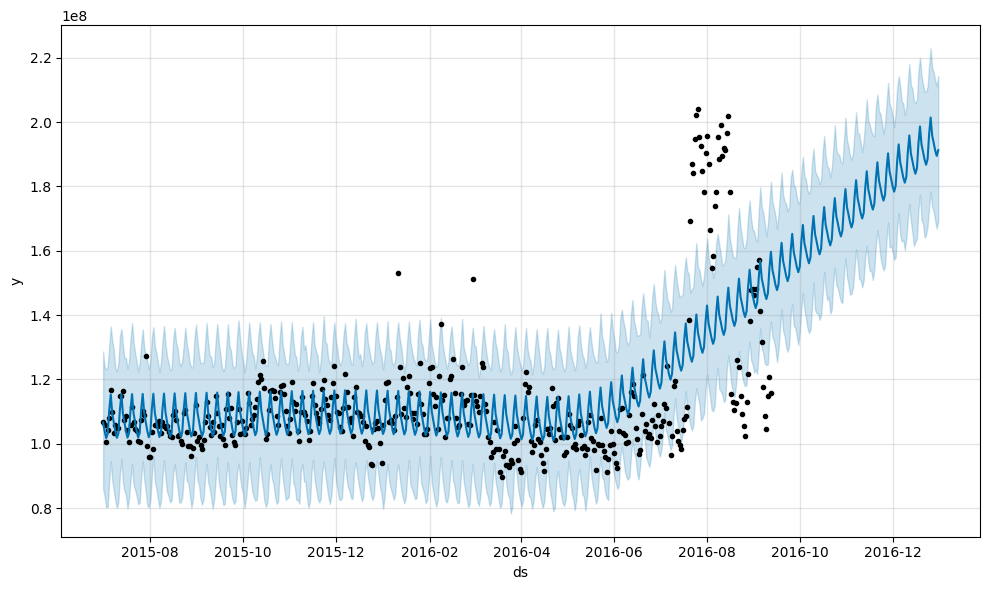

In [2942]:
m.plot(forecast)

In [2943]:
performance(df2_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 10393918.869
RMSE 16638158.719
MAPE 0.084


### **without Exog Variable**

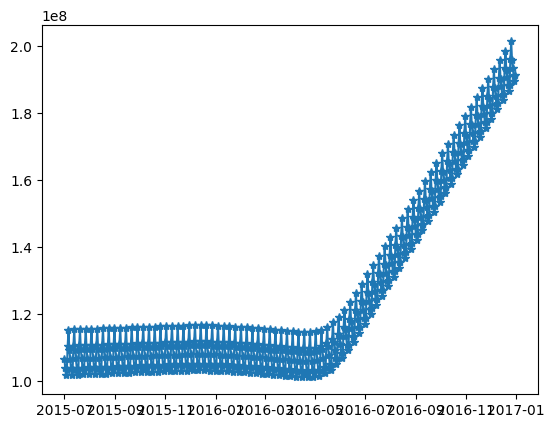

In [2944]:
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

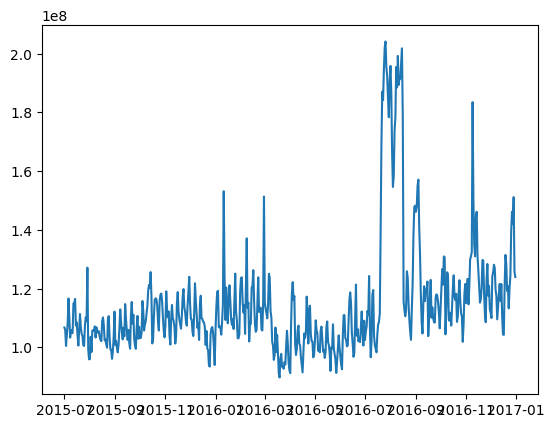

In [2945]:
plt.plot(df2_fb["ds"] , df2_fb["y"] , label = "actual")

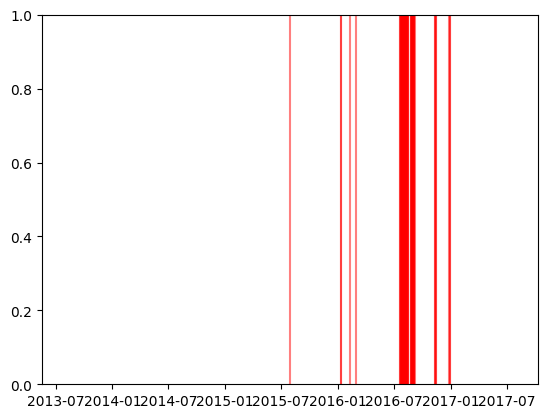

In [2946]:
for x in df2_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

### **with Exog Variable**

In [2947]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [2948]:
model2.add_regressor("Exog")

In [2949]:
model2.fit(df2_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [2950]:
forecast2 = model2.predict(df2_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


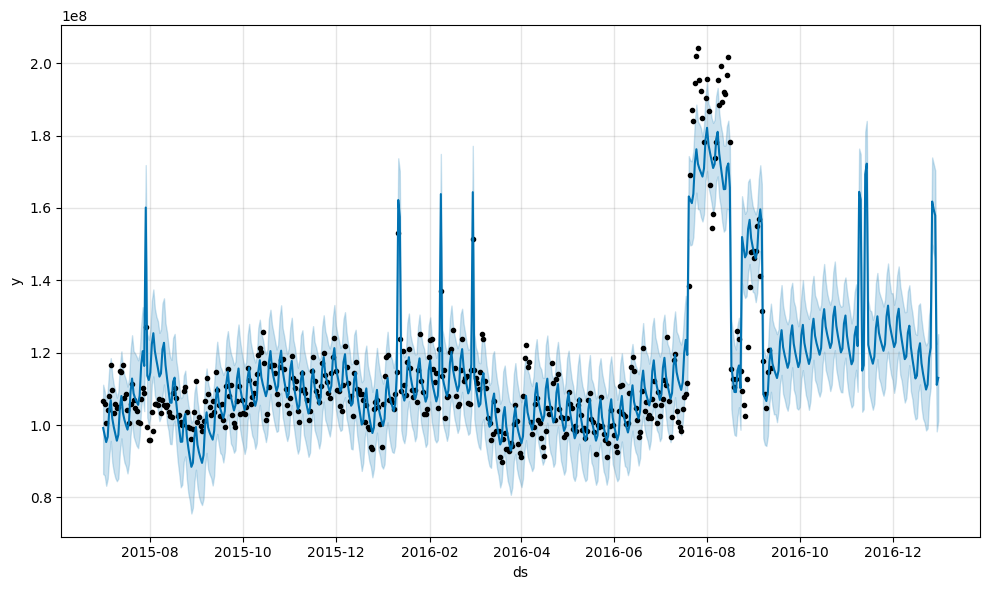

In [2951]:
fig = model2.plot(forecast2)

In [2952]:
performance(df2_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 6243847.177
RMSE 9322149.08
MAPE 0.053


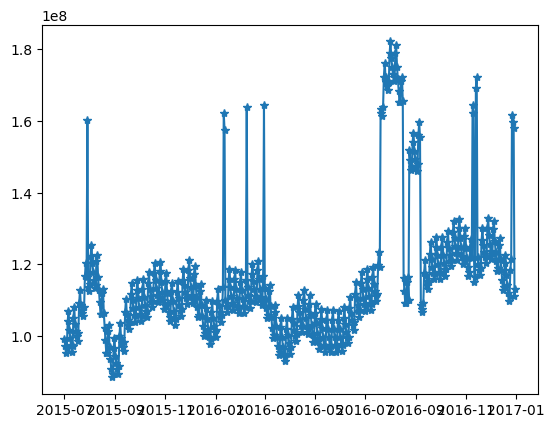

In [2953]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

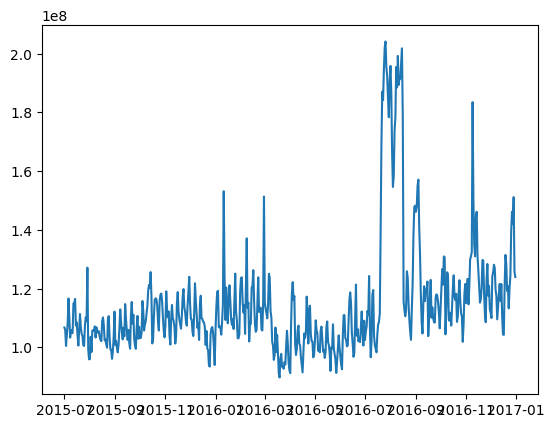

In [2954]:
plt.plot(df2_fb["ds"] , df2_fb["y"] , label = "actual")

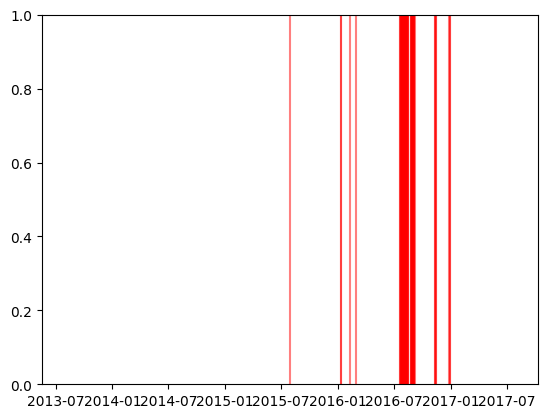

In [2955]:
for x in df2_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Third Language is "es"**

## **Observation**

In [2956]:
df3 = df_new[["Date" , "es"]]
df3.head()

,Date,es
0,2015-07-01,1.702302e+07
1,2015-07-02,1.633004e+07
2,2015-07-03,1.486705e+07
3,2015-07-04,1.395710e+07
4,2015-07-05,1.515551e+07


In [2957]:
df3.columns

Index(['Date', 'es'], dtype='object')

In [2958]:
df3.dtypes

Date    datetime64[ns]
es             float64
dtype: object

In [2959]:
df3.shape

(550, 2)

In [2960]:
df3["es"].describe()

count    5.500000e+02
mean     1.796579e+07
std      3.257293e+06
min      1.013523e+07
25%      1.539374e+07
50%      1.784245e+07
75%      2.077988e+07
max      3.001813e+07
Name: es, dtype: float64

In [2961]:
df3["Date"].describe()

<ipython-input-2961-41ef34064d31>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df3["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

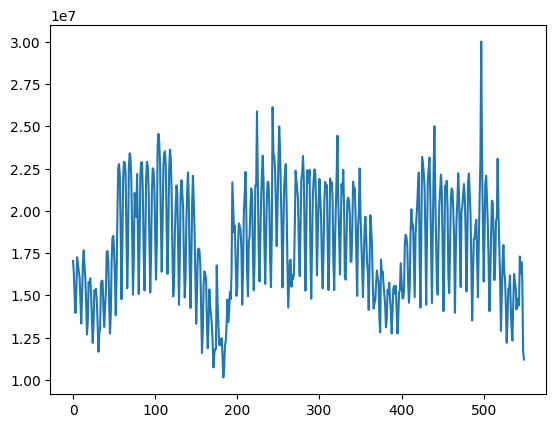

In [2962]:
df3["es"].plot()

[]

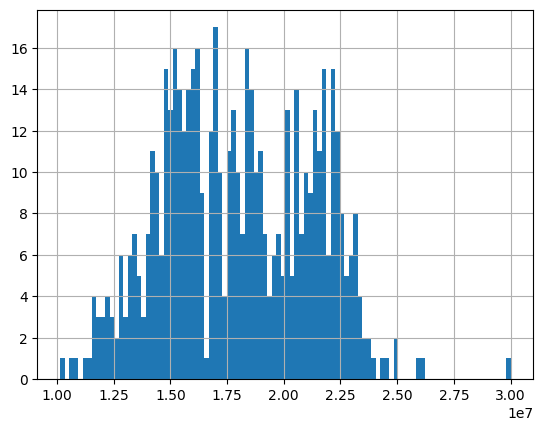

In [2963]:
df3["es"].hist(bins = 100).plot()

In [2964]:
lower = df3["es"].quantile(.005)
lower

11086923.048125

In [2965]:
upper = df3["es"].quantile(.995)
upper

25223819.042499997

In [2966]:
df3["es"]

0      1.702302e+07
1      1.633004e+07
2      1.486705e+07
3      1.395710e+07
4      1.515551e+07
           ...     
545    1.629755e+07
546    1.695820e+07
547    1.596421e+07
548    1.170617e+07
549    1.120031e+07
Name: es, Length: 550, dtype: float64

In [2967]:
df3[df3["es"] > upper]

,Date,es
224,2016-02-10,25885329.5
243,2016-02-29,26127262.0
497,2016-11-09,30018127.0


In [2968]:
df3[df3["es"] < lower]

,Date,es
171,2015-12-19,1.072715e+07
183,2015-12-31,1.013523e+07
184,2016-01-01,1.075566e+07


In [2969]:
df3["es"] = df3["es"].clip(upper , lower )

<ipython-input-2969-bc0c4633f00e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3["es"] = df3["es"].clip(upper , lower )


<Axes: >

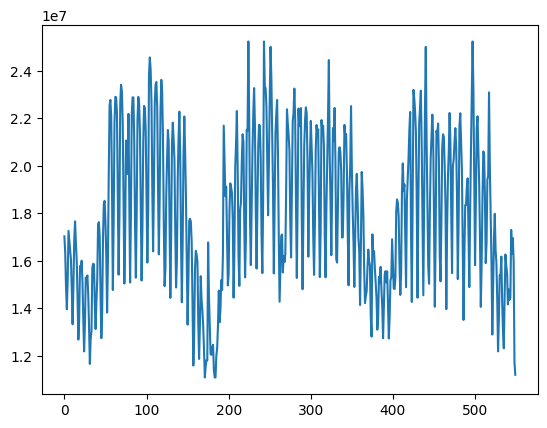

In [2970]:
df3["es"].plot()

In [2971]:
df3_exog = pd.concat([df3, exog], axis=1)
df3_exog

,Date,es,Exog
0,2015-07-01,1.702302e+07,0
1,2015-07-02,1.633004e+07,0
2,2015-07-03,1.486705e+07,0
3,2015-07-04,1.395710e+07,0
4,2015-07-05,1.515551e+07,0
...,...,...,...
545,2016-12-27,1.629755e+07,1
546,2016-12-28,1.695820e+07,1
547,2016-12-29,1.596421e+07,1
548,2016-12-30,1.170617e+07,0


## **Decomposition Time Series**

In [2972]:
df3.set_index("Date" , inplace = True)

In [2973]:
model = sm.tsa.seasonal_decompose(df3["es"] , model = "additive")

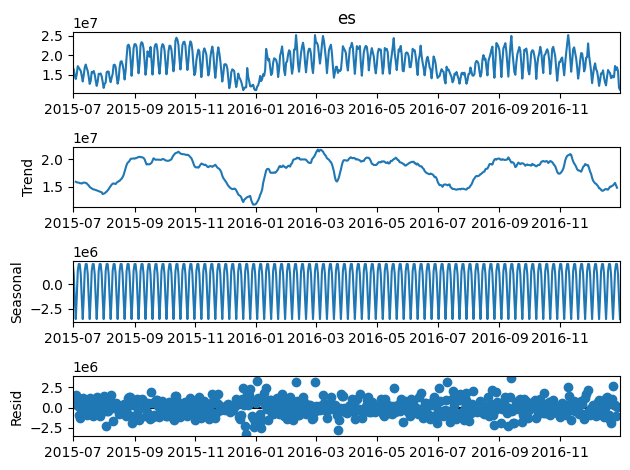

In [2974]:
model.plot()
plt.show()

In [2975]:
model = sm.tsa.seasonal_decompose(df3["es"] , model = "multiplicative")

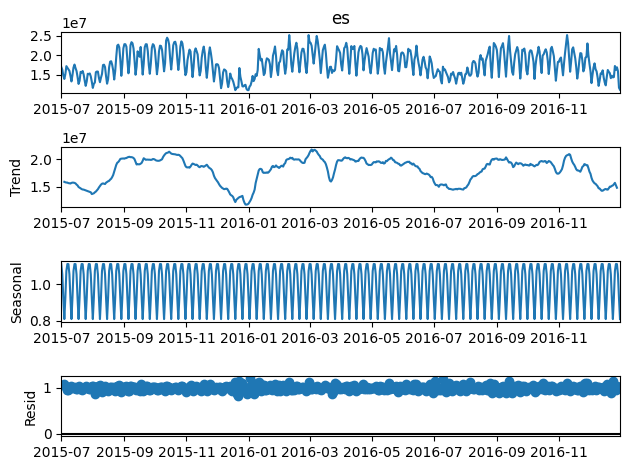

In [2976]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [2977]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [2978]:
model = sm.tsa.seasonal_decompose(df3["es"] , model = "additive")

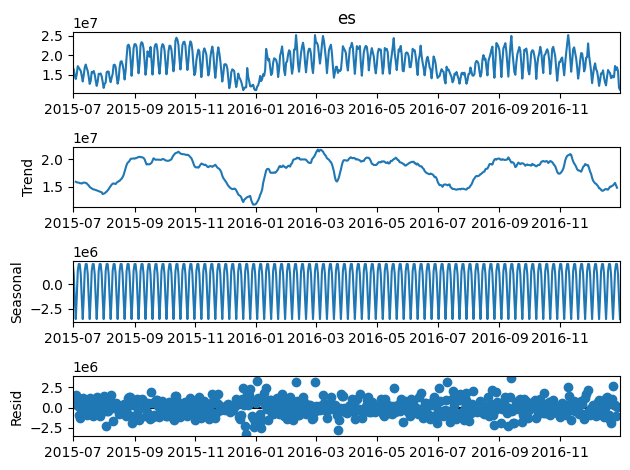

In [2979]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

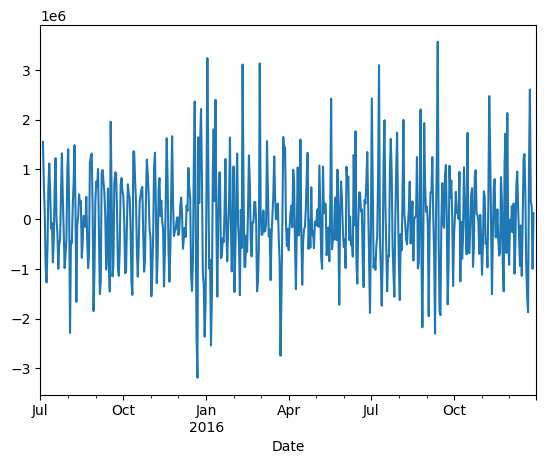

In [2980]:
model.resid.plot()

In [2981]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [2982]:
model = sm.tsa.seasonal_decompose(df3["es"] , model = "additive")

<Axes: xlabel='Date'>

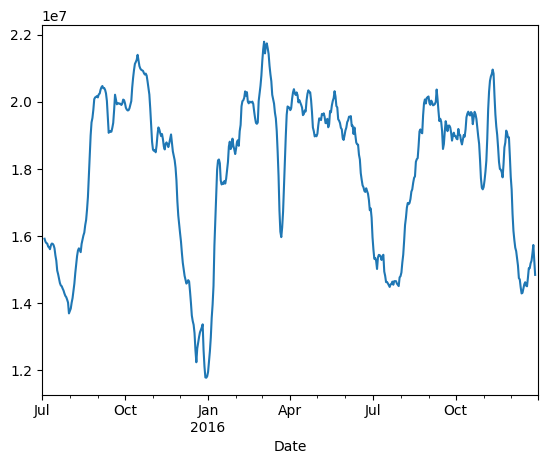

In [2983]:
model.trend.plot()

<Axes: xlabel='Date'>

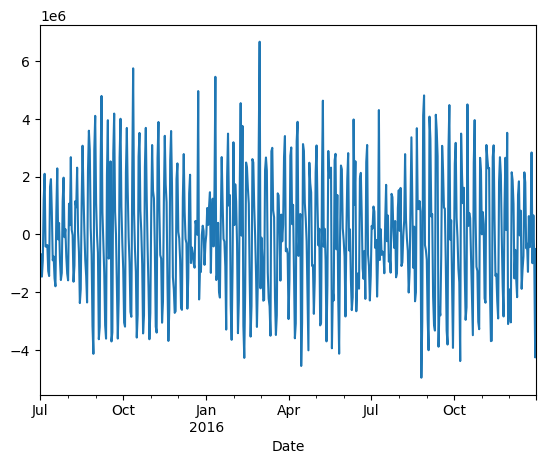

In [2984]:
df3["es"].diff(1).plot()

In [2985]:
adf_test(df3["es"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

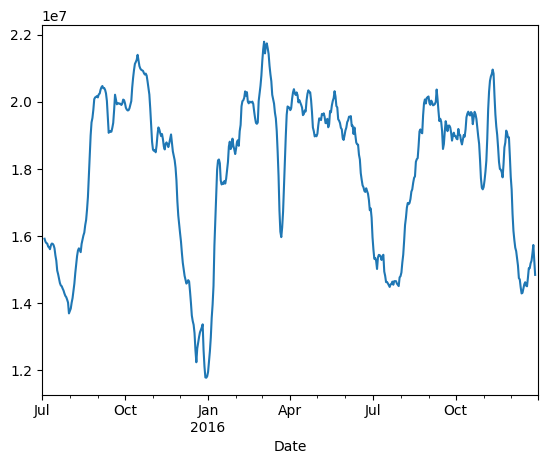

In [2986]:
model.trend.plot()

<Axes: xlabel='Date'>

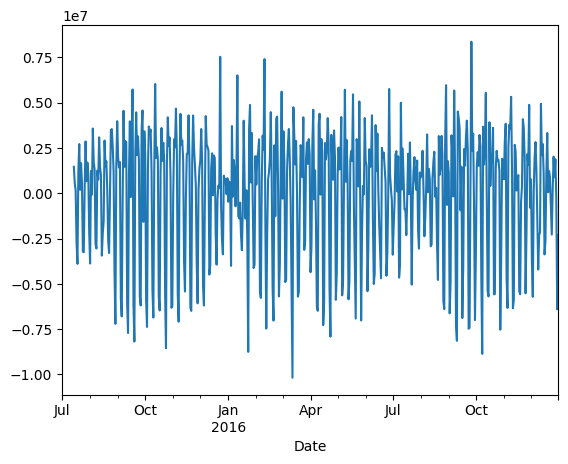

In [2987]:
df3["es"].diff(1).diff(12).plot()

In [2988]:
adf_test(df3["es"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [2989]:
df3.head()

,es
Date,
2015-07-01,1.702302e+07
2015-07-02,1.633004e+07
2015-07-03,1.486705e+07
2015-07-04,1.395710e+07
2015-07-05,1.515551e+07


In [2990]:
df3.reset_index(inplace = True)

In [2991]:
df3.head()

,Date,es
0,2015-07-01,1.702302e+07
1,2015-07-02,1.633004e+07
2,2015-07-03,1.486705e+07
3,2015-07-04,1.395710e+07
4,2015-07-05,1.515551e+07


In [2992]:
train_x = df3.loc[df3.index < df3.index[-110]].copy()

In [2993]:
test_x = df3.loc[df3.index >= df3.index[-110]].copy()

In [2994]:
train_x.head()

,Date,es
0,2015-07-01,1.702302e+07
1,2015-07-02,1.633004e+07
2,2015-07-03,1.486705e+07
3,2015-07-04,1.395710e+07
4,2015-07-05,1.515551e+07


In [2995]:
test_x.head()

,Date,es
440,2016-09-13,24997371.5
441,2016-09-14,21108900.5
442,2016-09-15,18566453.0
443,2016-09-16,15761157.5
444,2016-09-17,15031441.5


In [2996]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [2997]:
adf_test(train_x["es"])

Sequence is not Stationary


In [2998]:
model = SARIMAX(train_x["es"] , order = (15,1,15))

In [2999]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3000]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

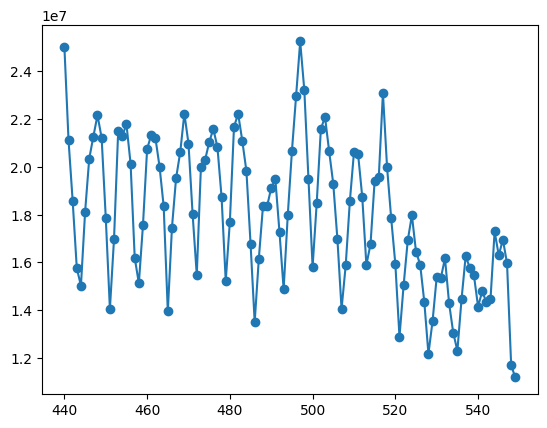

In [3001]:
test_x["es"].plot(style = "-o")

In [3002]:
test_x["es"].isnull().sum()

0

/usr/local/lib/python3.9/dist-packages/IPython/core/displayhook.py:275: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


<Axes: >

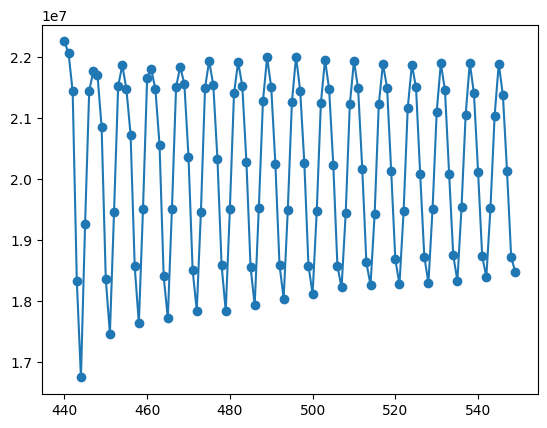

In [3003]:
test_x["pred"].plot(style = "-o")

In [3004]:
test_x["pred"].isnull().sum()

0

In [3005]:
performance(test_x["es"] , test_x["pred"])

MAE 2498120.023
RMSE 3179054.39
MAPE 0.16


## **SARIMA**

In [3006]:
adf_test(train_x["es"])

Sequence is not Stationary


In [3007]:
model = SARIMAX(train_x["es"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [3008]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3009]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

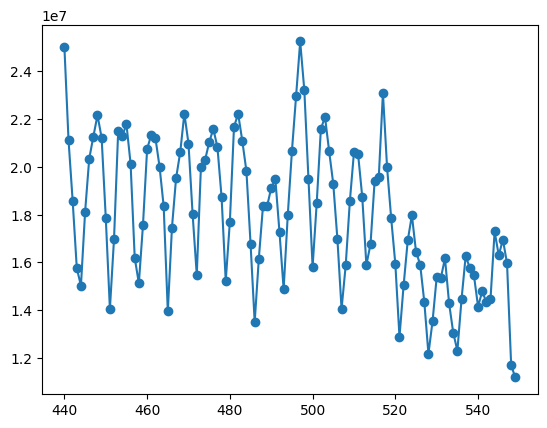

In [3010]:
test_x["es"].plot(style = "-o")

In [3011]:
test_x["es"].isnull().sum()

0

<Axes: >

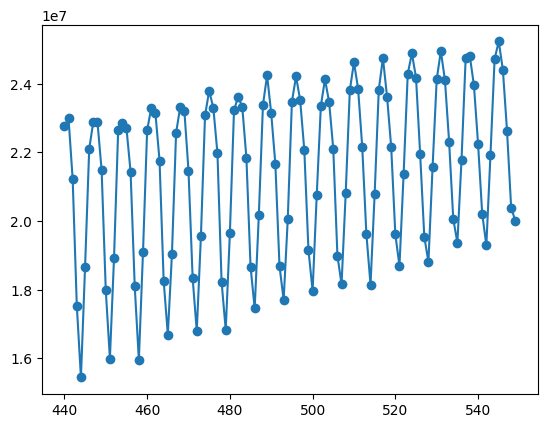

In [3012]:
test_x["pred"].plot(style = "-o")

In [3013]:
test_x["pred"].isnull().sum()

0

In [3014]:
performance(test_x["es"] , test_x["pred"])

MAE 3540497.98
RMSE 4419111.045
MAPE 0.22


## **SARIMAX without EXOG**

In [3015]:
train = df3_exog.iloc[:440]
train.head()

,Date,es,Exog
0,2015-07-01,1.702302e+07,0
1,2015-07-02,1.633004e+07,0
2,2015-07-03,1.486705e+07,0
3,2015-07-04,1.395710e+07,0
4,2015-07-05,1.515551e+07,0


In [3016]:
test = df3_exog.iloc[440:]
test.head()

,Date,es,Exog
440,2016-09-13,24997371.5,0
441,2016-09-14,21108900.5,0
442,2016-09-15,18566453.0,0
443,2016-09-16,15761157.5,0
444,2016-09-17,15031441.5,0


In [3017]:
model = SARIMAX(train["es"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3018]:
results = model.fit(disp=False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


In [3019]:
fc = results.forecast(110)

In [3020]:
start = len(train_x)

In [3021]:
end = len(train_x) + len(test_x) - 1

In [3022]:
predictions = results.predict(start = start , end = end)
predictions

440    2.237718e+07
441    2.230740e+07
442    2.116835e+07
443    1.814000e+07
444    1.520144e+07
           ...     
545    1.485378e+07
546    1.487101e+07
547    1.414154e+07
548    1.209870e+07
549    1.011250e+07
Name: predicted_mean, Length: 110, dtype: float64

In [3023]:
performance(test["es"] , predictions)

MAE 2006301.383
RMSE 2529175.359
MAPE 0.109


***Plot predictions against known values***

In [3024]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

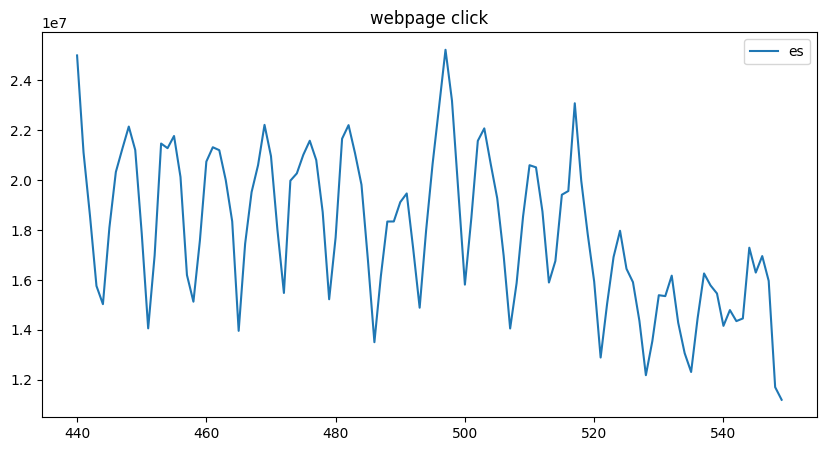

In [3025]:
ax = test["es"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

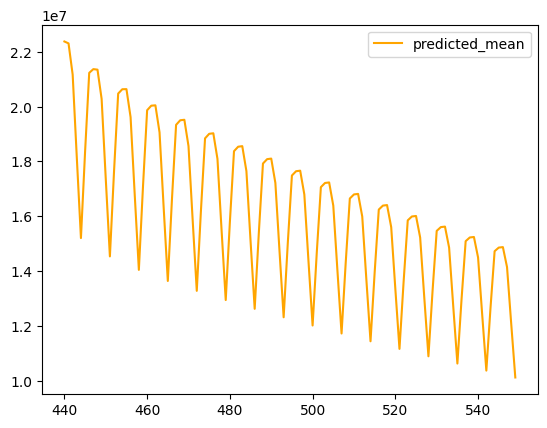

In [3026]:
predictions.plot(legend = True , color = "orange")

In [3027]:
ax.autoscale (axis = "x" , tight = True)

In [3028]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3029]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [3030]:
train = df3_exog.iloc[:440]
train.head()

,Date,es,Exog
0,2015-07-01,1.702302e+07,0
1,2015-07-02,1.633004e+07,0
2,2015-07-03,1.486705e+07,0
3,2015-07-04,1.395710e+07,0
4,2015-07-05,1.515551e+07,0


In [3031]:
test = df3_exog.iloc[440:]
test.head()

,Date,es,Exog
440,2016-09-13,24997371.5,0
441,2016-09-14,21108900.5,0
442,2016-09-15,18566453.0,0
443,2016-09-16,15761157.5,0
444,2016-09-17,15031441.5,0


In [3032]:
model = SARIMAX(train["es"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3033]:
results = model.fit(disp=False)

In [3034]:
exog_forecast = test[["Exog"]]

In [3035]:
start = len(train_x)

In [3036]:
end = len(train_x) + len(test_x) - 1

In [3037]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    2.124919e+07
441    2.091691e+07
442    1.899401e+07
443    1.575703e+07
444    1.297594e+07
           ...     
545    2.757458e+07
546    2.820269e+07
547    2.739181e+07
548    7.887129e+06
549    6.180514e+06
Name: Predictions, Length: 110, dtype: float64

In [3038]:
performance(test["es"] , predictions)

MAE 7392636.709
RMSE 7766992.031
MAPE 0.415


***Plot predictions against known values***

In [3039]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

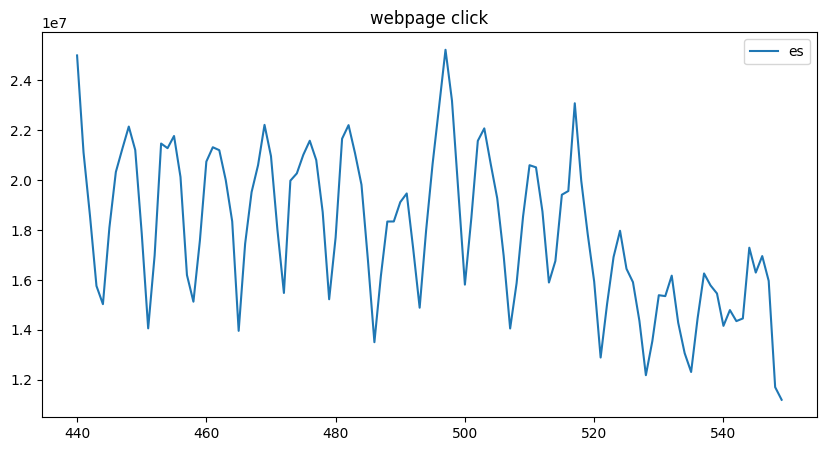

In [3040]:
ax = test["es"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

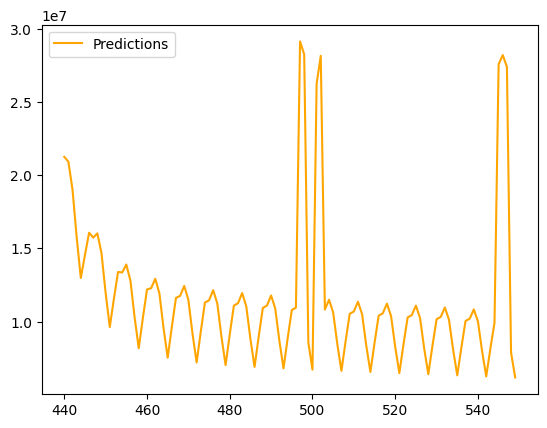

In [3041]:
predictions.plot(legend = True , color = "orange")

In [3042]:
ax.autoscale (axis = "x" , tight = True)

In [3043]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3044]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

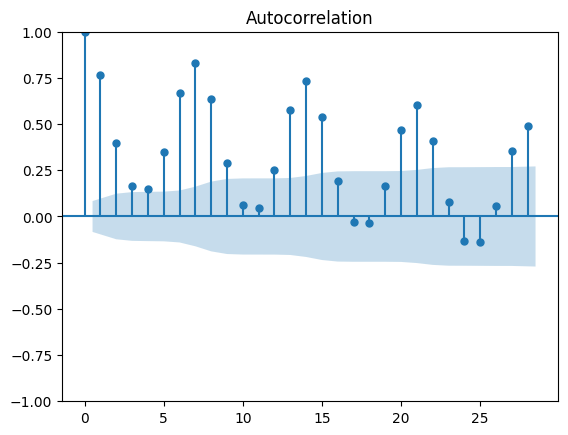

In [3045]:
plot_acf(df3["es"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


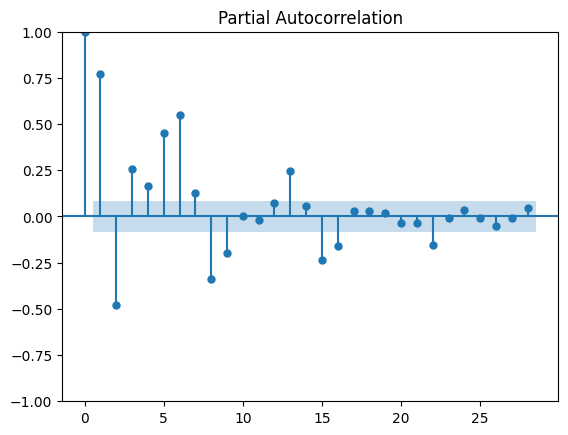

In [3046]:
plot_pacf(df3["es"])
plt.show()

## **Facebook Prophet**

In [3047]:
df3_exog.head()

,Date,es,Exog
0,2015-07-01,1.702302e+07,0
1,2015-07-02,1.633004e+07,0
2,2015-07-03,1.486705e+07,0
3,2015-07-04,1.395710e+07,0
4,2015-07-05,1.515551e+07,0


In [3048]:
df3_fb = df3_exog.copy()

In [3049]:
df3_fb.head()

,Date,es,Exog
0,2015-07-01,1.702302e+07,0
1,2015-07-02,1.633004e+07,0
2,2015-07-03,1.486705e+07,0
3,2015-07-04,1.395710e+07,0
4,2015-07-05,1.515551e+07,0


In [3050]:
df3_fb["ds"] = pd.to_datetime(df3_fb["Date"])

In [3051]:
df3_fb["y"] = df3_fb["es"]

In [3052]:
df3_fb = df3_fb[["ds" , "y" , "Exog"]]

In [3053]:
df3_fb.head()

,ds,y,Exog
0,2015-07-01,1.702302e+07,0
1,2015-07-02,1.633004e+07,0
2,2015-07-03,1.486705e+07,0
3,2015-07-04,1.395710e+07,0
4,2015-07-05,1.515551e+07,0


In [3054]:
from fbprophet import Prophet

In [3055]:
m = Prophet()

In [3056]:
m.fit(df3_fb[["ds" , "y"]][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3057]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [3058]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3059]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,1.508760e+07,1.407550e+07,2.015074e+07,1.508760e+07,1.508760e+07,1.953745e+06,1.953745e+06,1.953745e+06,1.953745e+06,1.953745e+06,1.953745e+06,0.0,0.0,0.0,1.704134e+07
1,2015-07-02,1.513258e+07,1.320108e+07,1.906968e+07,1.513258e+07,1.513258e+07,1.036291e+06,1.036291e+06,1.036291e+06,1.036291e+06,1.036291e+06,1.036291e+06,0.0,0.0,0.0,1.616887e+07
2,2015-07-03,1.517755e+07,1.078073e+07,1.672569e+07,1.517755e+07,1.517755e+07,-1.406649e+06,-1.406649e+06,-1.406649e+06,-1.406649e+06,-1.406649e+06,-1.406649e+06,0.0,0.0,0.0,1.377090e+07
3,2015-07-04,1.522253e+07,8.783587e+06,1.479865e+07,1.522253e+07,1.522253e+07,-3.456467e+06,-3.456467e+06,-3.456467e+06,-3.456467e+06,-3.456467e+06,-3.456467e+06,0.0,0.0,0.0,1.176607e+07
4,2015-07-05,1.526751e+07,1.118862e+07,1.682680e+07,1.526751e+07,1.526751e+07,-1.401212e+06,-1.401212e+06,-1.401212e+06,-1.401212e+06,-1.401212e+06,-1.401212e+06,0.0,0.0,0.0,1.386630e+07


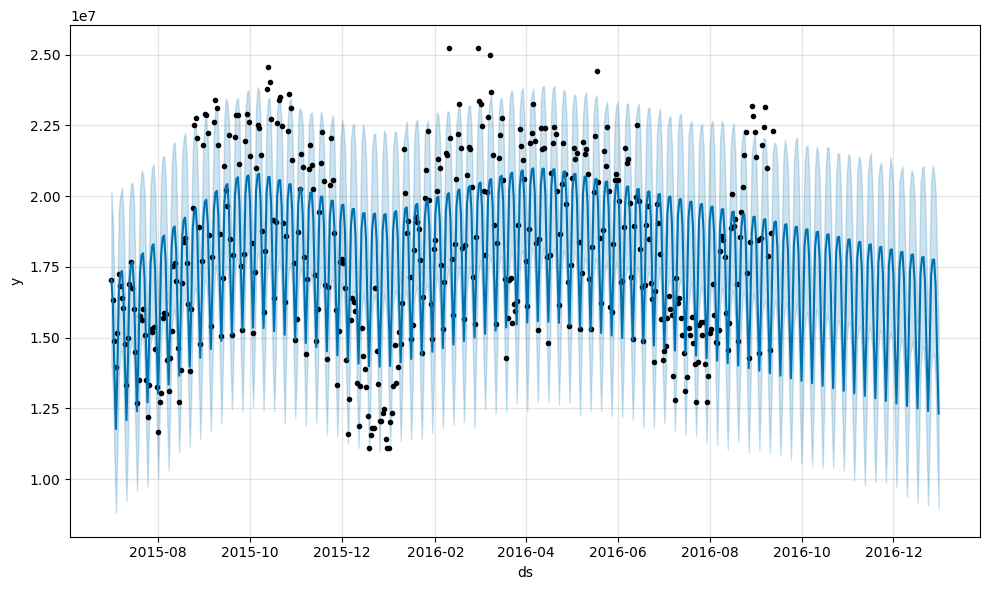

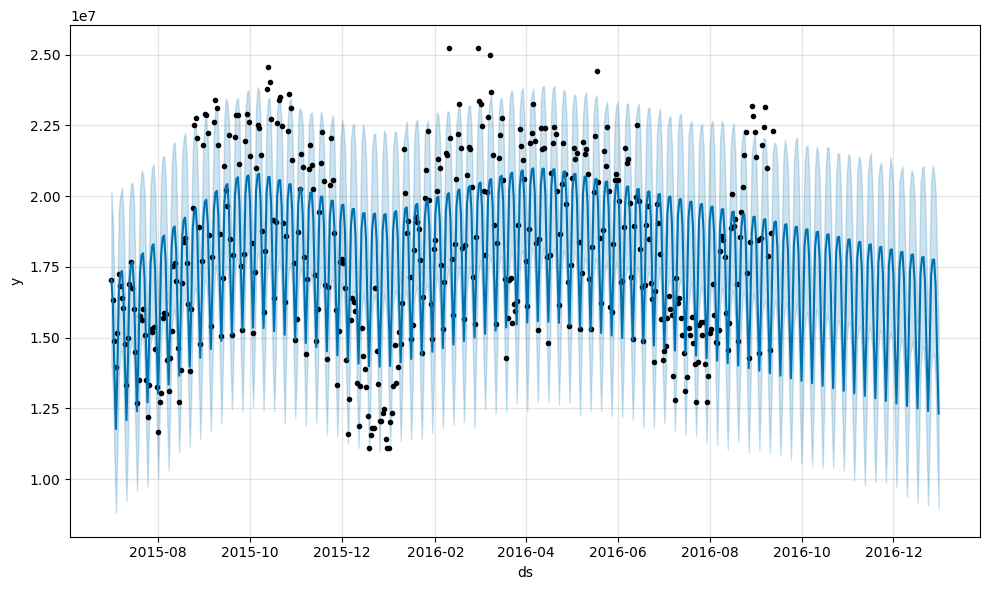

In [3060]:
m.plot(forecast)

In [3061]:
performance(df3_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 1737823.023
RMSE 2250541.75
MAPE 0.103


### **without Exog Variable**

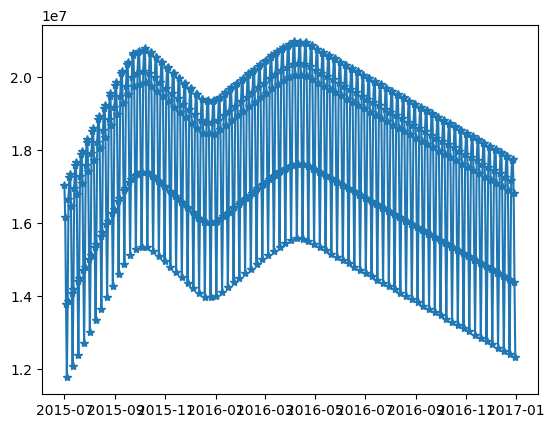

In [3062]:
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

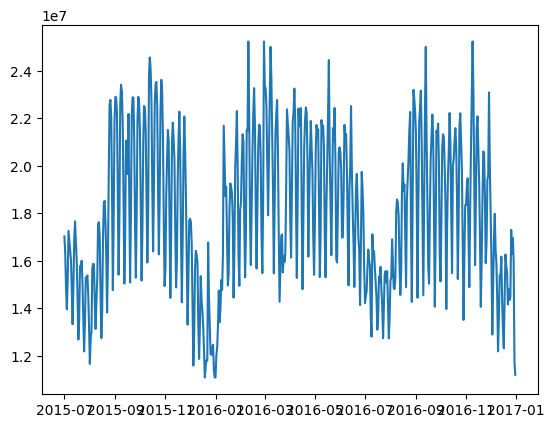

In [3063]:
plt.plot(df3_fb["ds"] , df3_fb["y"] , label = "actual")

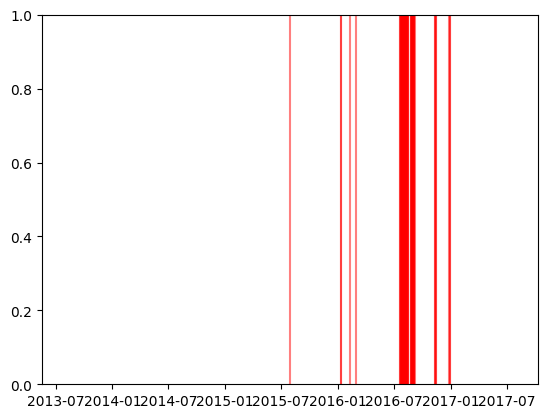

In [3064]:
for x in df3_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

### **with Exog Variable**

In [3065]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [3066]:
model2.add_regressor("Exog")

In [3067]:
model2.fit(df3_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3068]:
forecast2 = model2.predict(df3_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


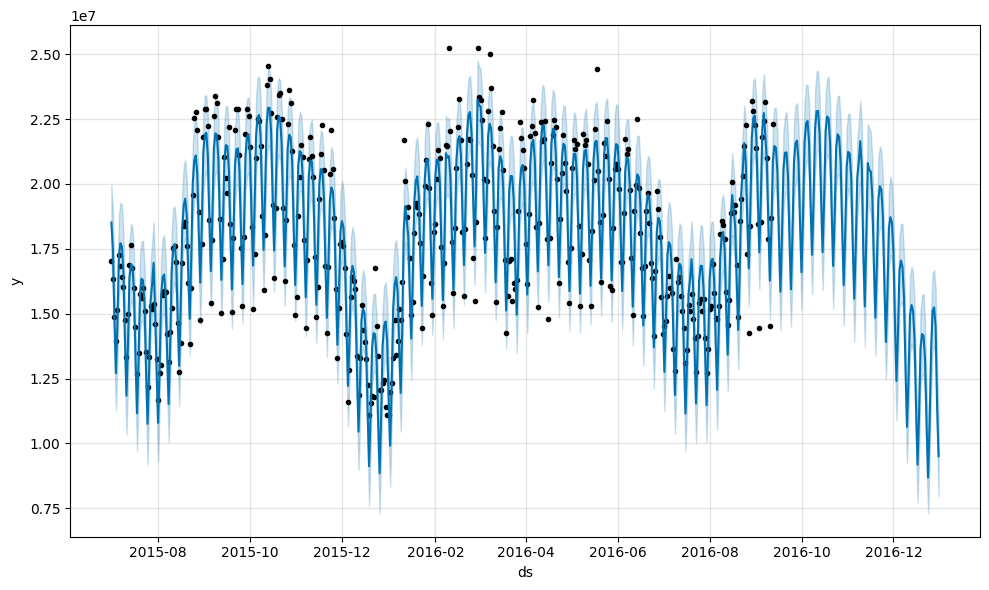

In [3069]:
fig = model2.plot(forecast2)

In [3070]:
performance(df3_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 925873.562
RMSE 1174084.415
MAPE 0.055


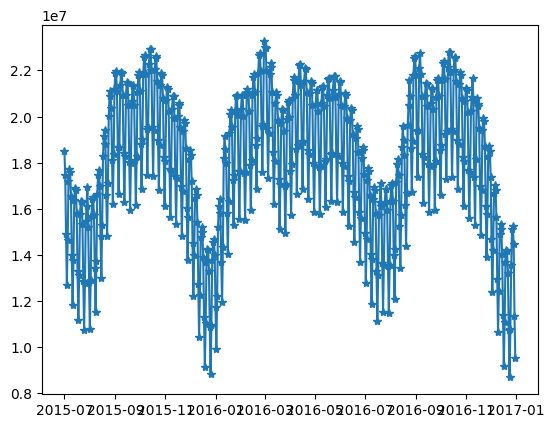

In [3071]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

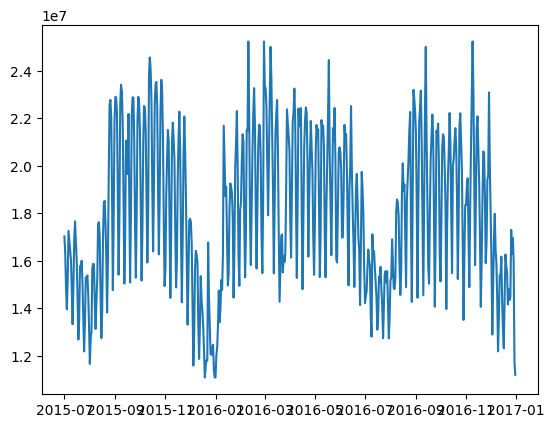

In [3072]:
plt.plot(df3_fb["ds"] , df3_fb["y"] , label = "actual")

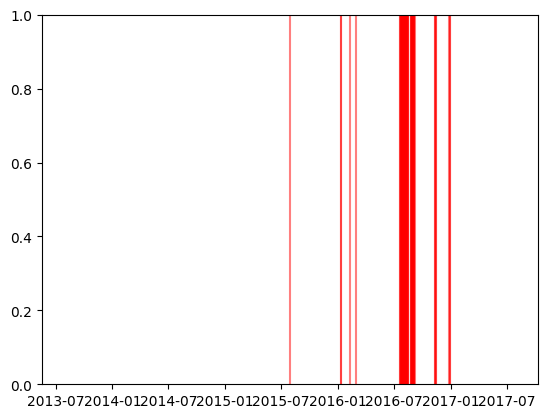

In [3073]:
for x in df3_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Fourth Language is "fr"**

## **Observation**

In [3074]:
df4 = df_new[["Date" , "fr"]]
df4.head()

,Date,fr
0,2015-07-01,2.009908e+07
1,2015-07-02,8.937456e+06
2,2015-07-03,8.625914e+06
3,2015-07-04,9.368347e+06
4,2015-07-05,9.040404e+06


In [3075]:
df4.columns

Index(['Date', 'fr'], dtype='object')

In [3076]:
df4.dtypes

Date    datetime64[ns]
fr             float64
dtype: object

In [3077]:
df4.shape

(550, 2)

In [3078]:
df4["fr"].describe()

count    5.500000e+02
mean     1.195957e+07
std      1.861205e+06
min      7.518563e+06
25%      1.102345e+07
50%      1.187228e+07
75%      1.283810e+07
max      2.036619e+07
Name: fr, dtype: float64

In [3079]:
df4["Date"].describe()

<ipython-input-3079-bb73eed5577d>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df4["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

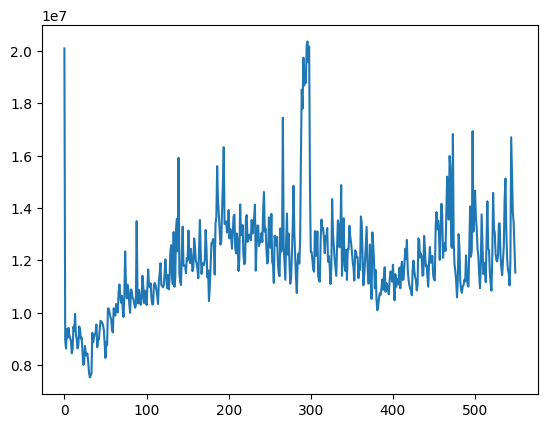

In [3080]:
df4["fr"].plot()

[]

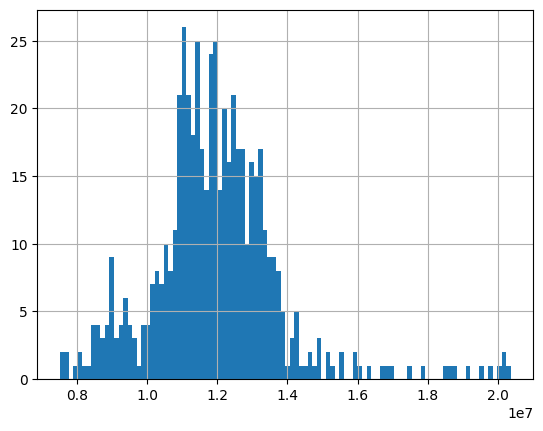

In [3081]:
df4["fr"].hist(bins = 100).plot()

In [3082]:
lower = df4["fr"].quantile(.005)
lower

7701298.673148876

In [3083]:
upper = df4["fr"].quantile(.995)
upper

20117404.949910764

In [3084]:
df4["fr"]

0      2.009908e+07
1      8.937456e+06
2      8.625914e+06
3      9.368347e+06
4      9.040404e+06
           ...     
545    1.530606e+07
546    1.382298e+07
547    1.342754e+07
548    1.251253e+07
549    1.152867e+07
Name: fr, Length: 550, dtype: float64

In [3085]:
df4[df4["fr"] > upper]

,Date,fr
295,2016-04-21,2.021388e+07
296,2016-04-22,2.036619e+07
298,2016-04-24,2.017095e+07


In [3086]:
df4[df4["fr"] < lower]

,Date,fr
31,2015-08-01,7.518563e+06
32,2015-08-02,7.588707e+06
33,2015-08-03,7.682306e+06


In [3087]:
df4["fr"] = df4["fr"].clip(upper , lower )

<ipython-input-3087-d7f2c5d022b4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4["fr"] = df4["fr"].clip(upper , lower )


<Axes: >

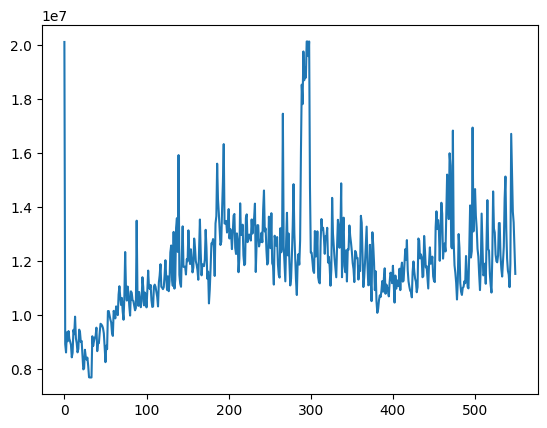

In [3088]:
df4["fr"].plot()

In [3089]:
df4_exog = pd.concat([df4, exog], axis=1)
df4_exog

,Date,fr,Exog
0,2015-07-01,2.009908e+07,0
1,2015-07-02,8.937456e+06,0
2,2015-07-03,8.625914e+06,0
3,2015-07-04,9.368347e+06,0
4,2015-07-05,9.040404e+06,0
...,...,...,...
545,2016-12-27,1.530606e+07,1
546,2016-12-28,1.382298e+07,1
547,2016-12-29,1.342754e+07,1
548,2016-12-30,1.251253e+07,0


## **Decomposition Time Series**

In [3090]:
df4.set_index("Date" , inplace = True)

In [3091]:
model = sm.tsa.seasonal_decompose(df4["fr"] , model = "additive")

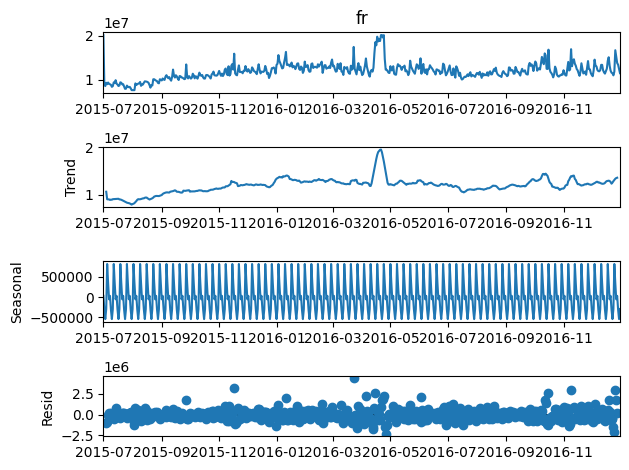

In [3092]:
model.plot()
plt.show()

In [3093]:
model = sm.tsa.seasonal_decompose(df4["fr"] , model = "multiplicative")

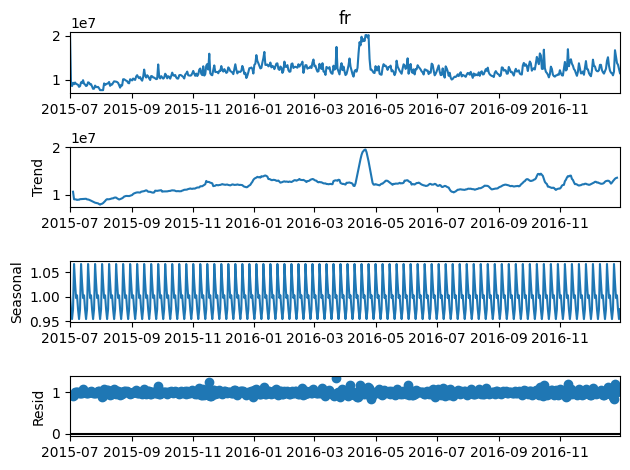

In [3094]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [3095]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [3096]:
model = sm.tsa.seasonal_decompose(df4["fr"] , model = "additive")

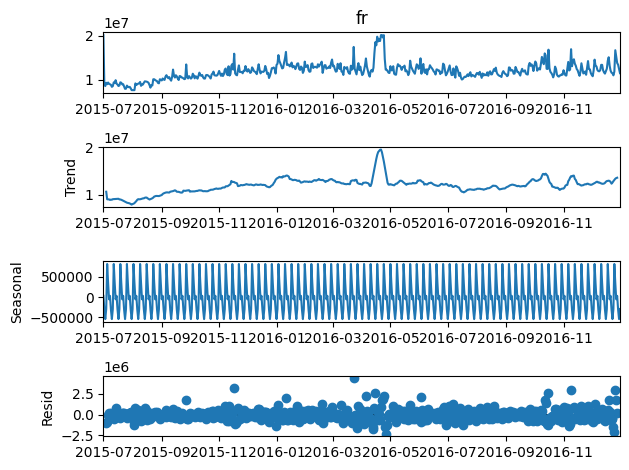

In [3097]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

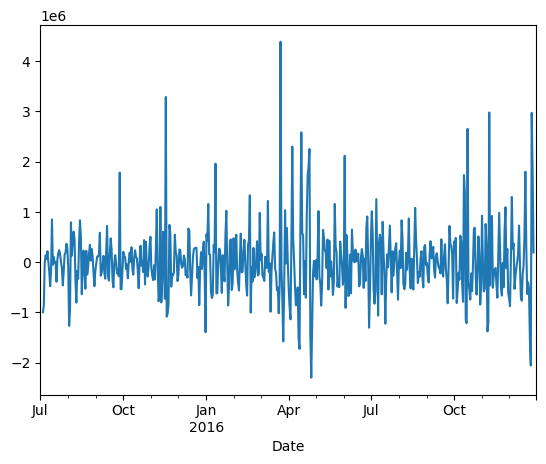

In [3098]:
model.resid.plot()

In [3099]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [3100]:
model = sm.tsa.seasonal_decompose(df4["fr"] , model = "additive")

<Axes: xlabel='Date'>

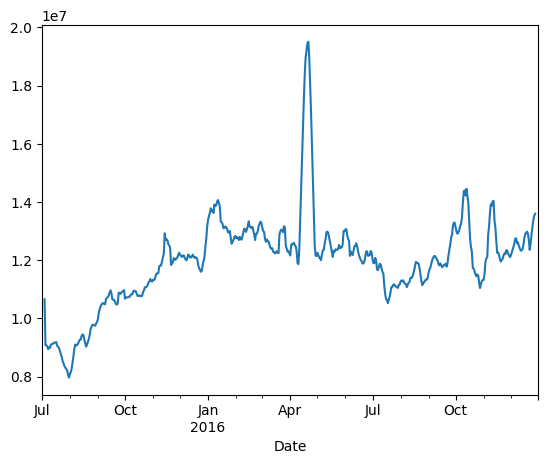

In [3101]:
model.trend.plot()

<Axes: xlabel='Date'>

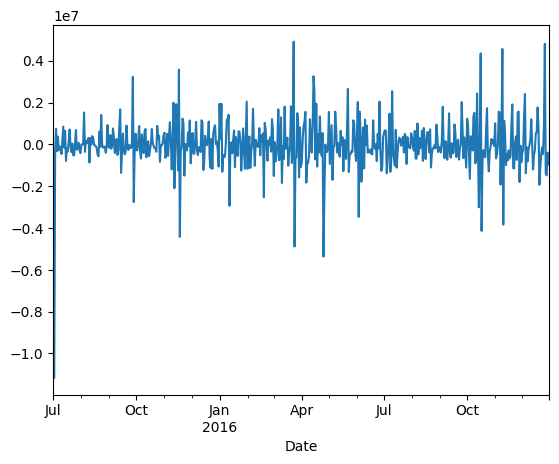

In [3102]:
df4["fr"].diff(1).plot()

In [3103]:
adf_test(df4["fr"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

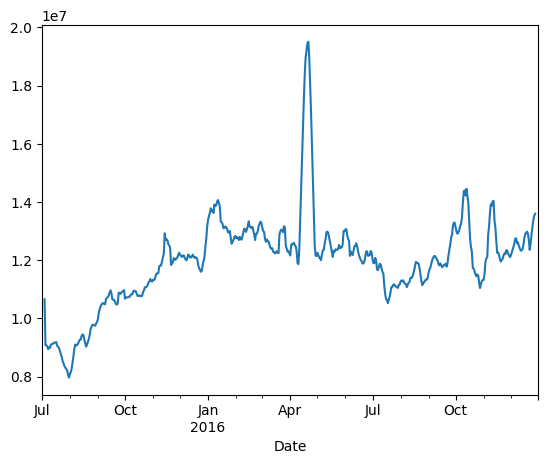

In [3104]:
model.trend.plot()

<Axes: xlabel='Date'>

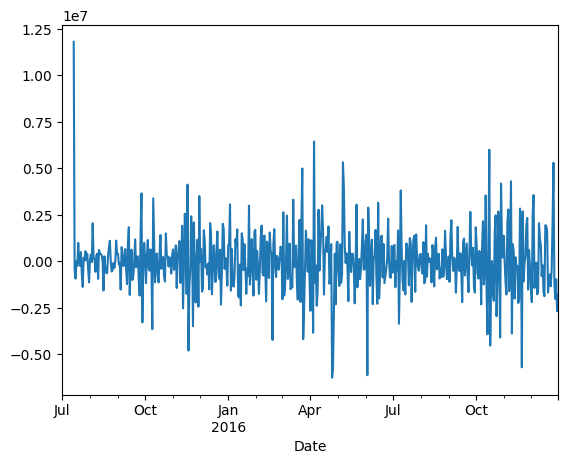

In [3105]:
df4["fr"].diff(1).diff(12).plot()

In [3106]:
adf_test(df4["fr"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [3107]:
df4.head()

,fr
Date,
2015-07-01,2.009908e+07
2015-07-02,8.937456e+06
2015-07-03,8.625914e+06
2015-07-04,9.368347e+06
2015-07-05,9.040404e+06


In [3108]:
df4.reset_index(inplace = True)

In [3109]:
df4.head()

,Date,fr
0,2015-07-01,2.009908e+07
1,2015-07-02,8.937456e+06
2,2015-07-03,8.625914e+06
3,2015-07-04,9.368347e+06
4,2015-07-05,9.040404e+06


In [3110]:
train_x = df4.loc[df4.index < df4.index[-110]].copy()

In [3111]:
test_x = df4.loc[df4.index >= df4.index[-110]].copy()

In [3112]:
train_x.head()

,Date,fr
0,2015-07-01,2.009908e+07
1,2015-07-02,8.937456e+06
2,2015-07-03,8.625914e+06
3,2015-07-04,9.368347e+06
4,2015-07-05,9.040404e+06


In [3113]:
test_x.head()

,Date,fr
440,2016-09-13,11768258.0
441,2016-09-14,11817852.0
442,2016-09-15,11386097.0
443,2016-09-16,10989447.5
444,2016-09-17,11942839.5


In [3114]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [3115]:
adf_test(train_x["fr"])

Sequence is not Stationary


In [3116]:
model = SARIMAX(train_x["fr"] , order = (15,1,15))

In [3117]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3118]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

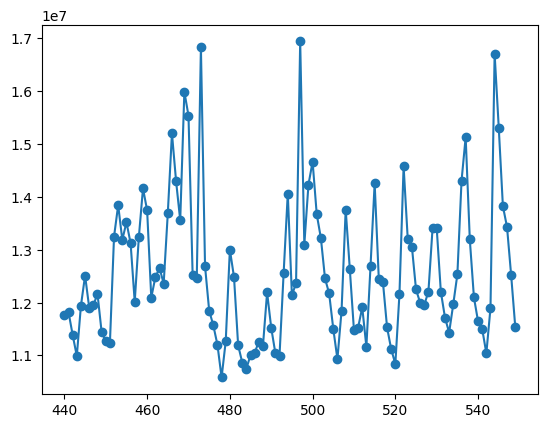

In [3119]:
test_x["fr"].plot(style = "-o")

In [3120]:
test_x["fr"].isnull().sum()

0

<Axes: >

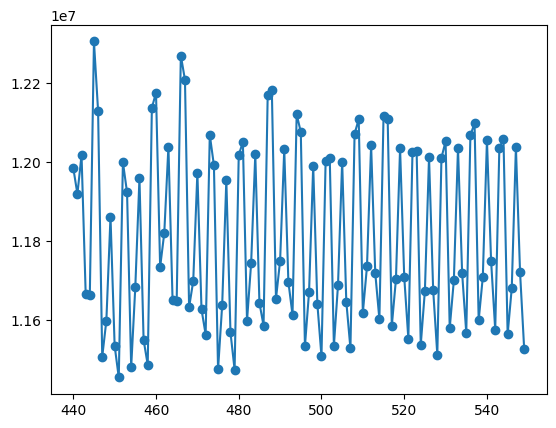

In [3121]:
test_x["pred"].plot(style = "-o")

In [3122]:
test_x["pred"].isnull().sum()

0

In [3123]:
performance(test_x["fr"] , test_x["pred"])

MAE 1104252.54
RMSE 1532265.017
MAPE 0.082


## **SARIMA**

In [3124]:
adf_test(train_x["fr"])

Sequence is not Stationary


In [3125]:
model = SARIMAX(train_x["fr"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [3126]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3127]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

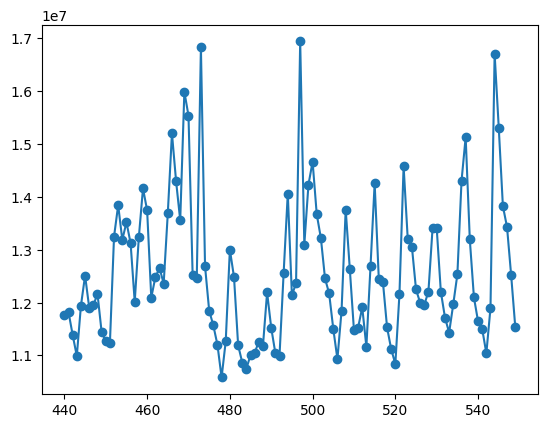

In [3128]:
test_x["fr"].plot(style = "-o")

In [3129]:
test_x["fr"].isnull().sum()

0

<Axes: >

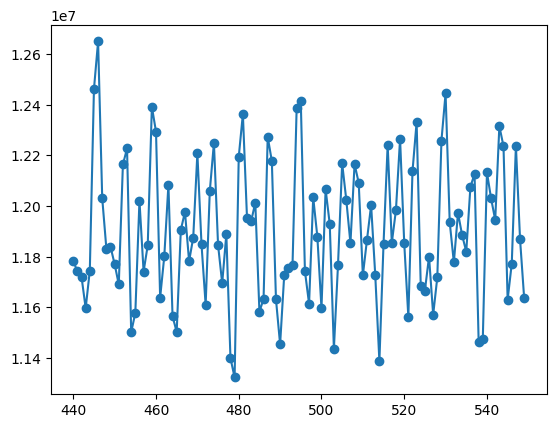

In [3130]:
test_x["pred"].plot(style = "-o")

In [3131]:
test_x["pred"].isnull().sum()

0

In [3132]:
performance(test_x["fr"] , test_x["pred"])

MAE 1070667.283
RMSE 1501205.907
MAPE 0.079


## **SARIMAX without EXOG**

In [3133]:
train = df4_exog.iloc[:440]
train.head()

,Date,fr,Exog
0,2015-07-01,2.009908e+07,0
1,2015-07-02,8.937456e+06,0
2,2015-07-03,8.625914e+06,0
3,2015-07-04,9.368347e+06,0
4,2015-07-05,9.040404e+06,0


In [3134]:
test = df4_exog.iloc[440:]
test.head()

,Date,fr,Exog
440,2016-09-13,11768258.0,0
441,2016-09-14,11817852.0,0
442,2016-09-15,11386097.0,0
443,2016-09-16,10989447.5,0
444,2016-09-17,11942839.5,0


In [3135]:
model = SARIMAX(train["fr"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3136]:
results = model.fit(disp=False)

In [3137]:
fc = results.forecast(110)

In [3138]:
start = len(train_x)

In [3139]:
end = len(train_x) + len(test_x) - 1

In [3140]:
predictions = results.predict(start = start , end = end)
predictions

440    1.194600e+07
441    1.192553e+07
442    1.184582e+07
443    1.159956e+07
444    1.152734e+07
           ...     
545    1.136237e+07
546    1.136752e+07
547    1.131259e+07
548    1.109349e+07
549    1.104160e+07
Name: predicted_mean, Length: 110, dtype: float64

In [3141]:
performance(test["fr"] , predictions)

MAE 1137372.139
RMSE 1595781.81
MAPE 0.083


***Plot predictions against known values***

In [3142]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

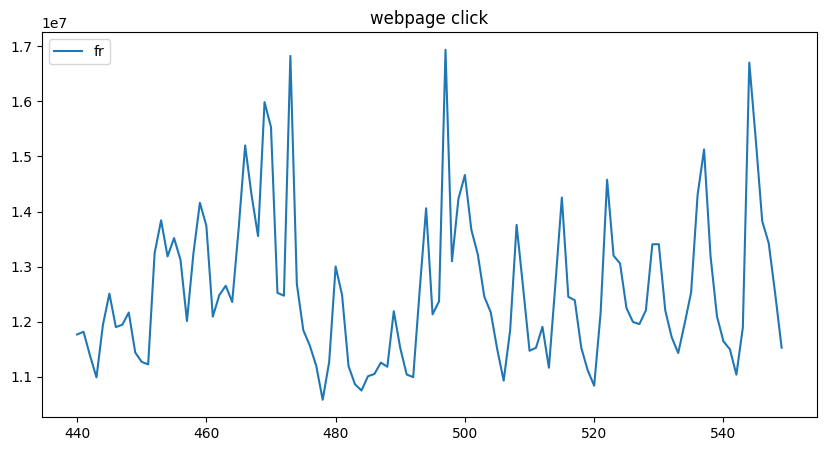

In [3143]:
ax = test["fr"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

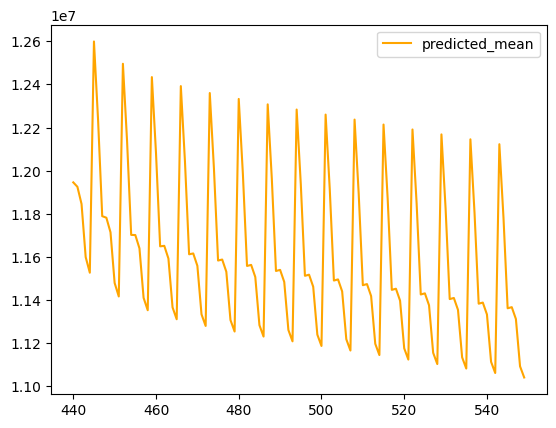

In [3144]:
predictions.plot(legend = True , color = "orange")

In [3145]:
ax.autoscale (axis = "x" , tight = True)

In [3146]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3147]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [3148]:
train = df4_exog.iloc[:440]
train.head()

,Date,fr,Exog
0,2015-07-01,2.009908e+07,0
1,2015-07-02,8.937456e+06,0
2,2015-07-03,8.625914e+06,0
3,2015-07-04,9.368347e+06,0
4,2015-07-05,9.040404e+06,0


In [3149]:
test = df4_exog.iloc[440:]
test.head()

,Date,fr,Exog
440,2016-09-13,11768258.0,0
441,2016-09-14,11817852.0,0
442,2016-09-15,11386097.0,0
443,2016-09-16,10989447.5,0
444,2016-09-17,11942839.5,0


In [3150]:
model = SARIMAX(train["fr"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3151]:
results = model.fit(disp=False)

In [3152]:
exog_forecast = test[["Exog"]]

In [3153]:
start = len(train_x)

In [3154]:
end = len(train_x) + len(test_x) - 1

In [3155]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    1.178846e+07
441    1.163275e+07
442    1.119329e+07
443    1.065807e+07
444    1.034660e+07
           ...     
545    1.903546e+07
546    1.923445e+07
547    1.913670e+07
548    7.405320e+06
549    7.365949e+06
Name: Predictions, Length: 110, dtype: float64

In [3156]:
performance(test["fr"] , predictions)

MAE 4213364.531
RMSE 4496689.905
MAPE 0.329


***Plot predictions against known values***

In [3157]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

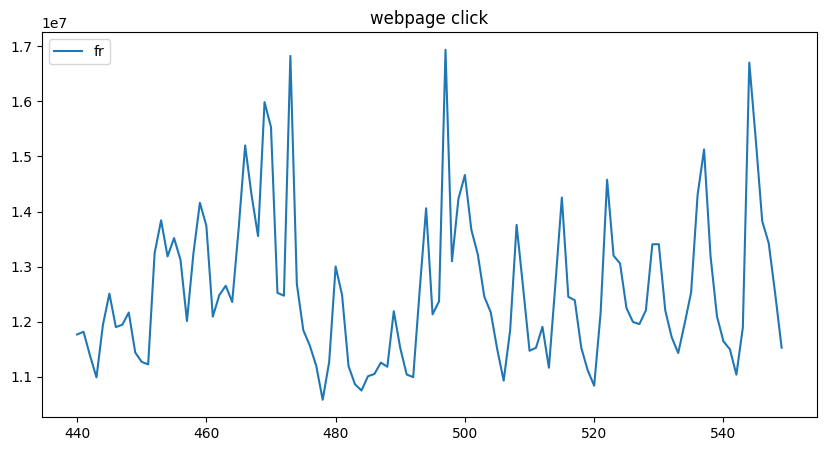

In [3158]:
ax = test["fr"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

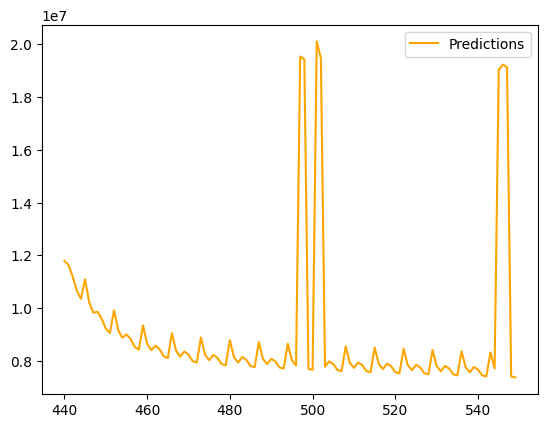

In [3159]:
predictions.plot(legend = True , color = "orange")

In [3160]:
ax.autoscale (axis = "x" , tight = True)

In [3161]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3162]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

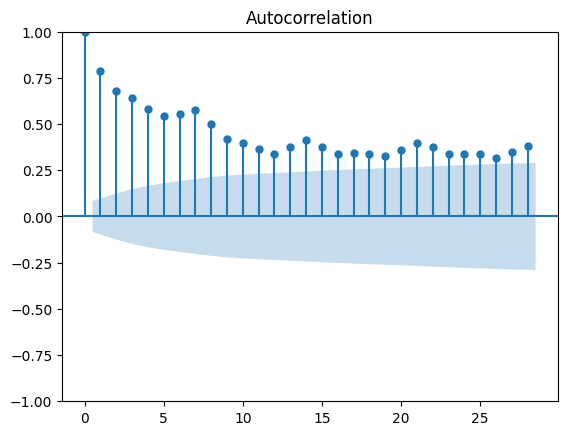

In [3163]:
plot_acf(df4["fr"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


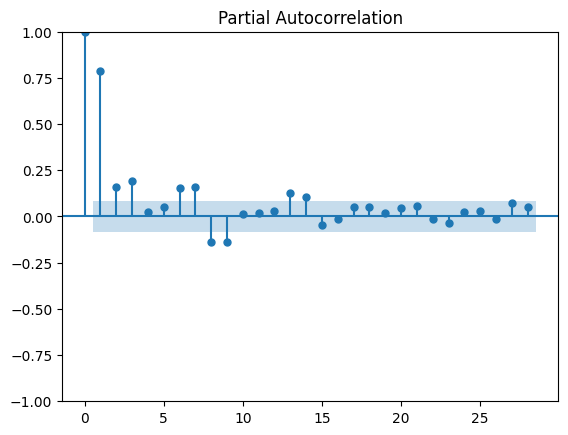

In [3164]:
plot_pacf(df4["fr"])
plt.show()

## **Facebook Prophet**

In [3165]:
df4_exog.head()

,Date,fr,Exog
0,2015-07-01,2.009908e+07,0
1,2015-07-02,8.937456e+06,0
2,2015-07-03,8.625914e+06,0
3,2015-07-04,9.368347e+06,0
4,2015-07-05,9.040404e+06,0


In [3166]:
df4_fb = df4_exog.copy()

In [3167]:
df4_fb.head()

,Date,fr,Exog
0,2015-07-01,2.009908e+07,0
1,2015-07-02,8.937456e+06,0
2,2015-07-03,8.625914e+06,0
3,2015-07-04,9.368347e+06,0
4,2015-07-05,9.040404e+06,0


In [3168]:
df4_fb["ds"] = pd.to_datetime(df4_fb["Date"])

In [3169]:
df4_fb["y"] = df4_fb["fr"]

In [3170]:
df4_fb = df4_fb[["ds" , "y" , "Exog"]]

In [3171]:
df4_fb.head()

,ds,y,Exog
0,2015-07-01,2.009908e+07,0
1,2015-07-02,8.937456e+06,0
2,2015-07-03,8.625914e+06,0
3,2015-07-04,9.368347e+06,0
4,2015-07-05,9.040404e+06,0


In [3172]:
from fbprophet import Prophet

In [3173]:
m = Prophet()

In [3174]:
m.fit(df4_fb[["ds" , "y"]][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3175]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [3176]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3177]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,8.797548e+06,7.215077e+06,1.065048e+07,8.797548e+06,8.797548e+06,172264.912094,172264.912094,172264.912094,172264.912094,172264.912094,172264.912094,0.0,0.0,0.0,8.969813e+06
1,2015-07-02,8.818577e+06,6.750755e+06,1.030157e+07,8.818577e+06,8.818577e+06,-286217.843709,-286217.843709,-286217.843709,-286217.843709,-286217.843709,-286217.843709,0.0,0.0,0.0,8.532359e+06
2,2015-07-03,8.839606e+06,6.735531e+06,1.007896e+07,8.839606e+06,8.839606e+06,-479017.938406,-479017.938406,-479017.938406,-479017.938406,-479017.938406,-479017.938406,0.0,0.0,0.0,8.360588e+06
3,2015-07-04,8.860635e+06,6.787698e+06,1.024550e+07,8.860635e+06,8.860635e+06,-299218.481400,-299218.481400,-299218.481400,-299218.481400,-299218.481400,-299218.481400,0.0,0.0,0.0,8.561416e+06
4,2015-07-05,8.881664e+06,7.941846e+06,1.116144e+07,8.881664e+06,8.881664e+06,723334.910690,723334.910690,723334.910690,723334.910690,723334.910690,723334.910690,0.0,0.0,0.0,9.604999e+06


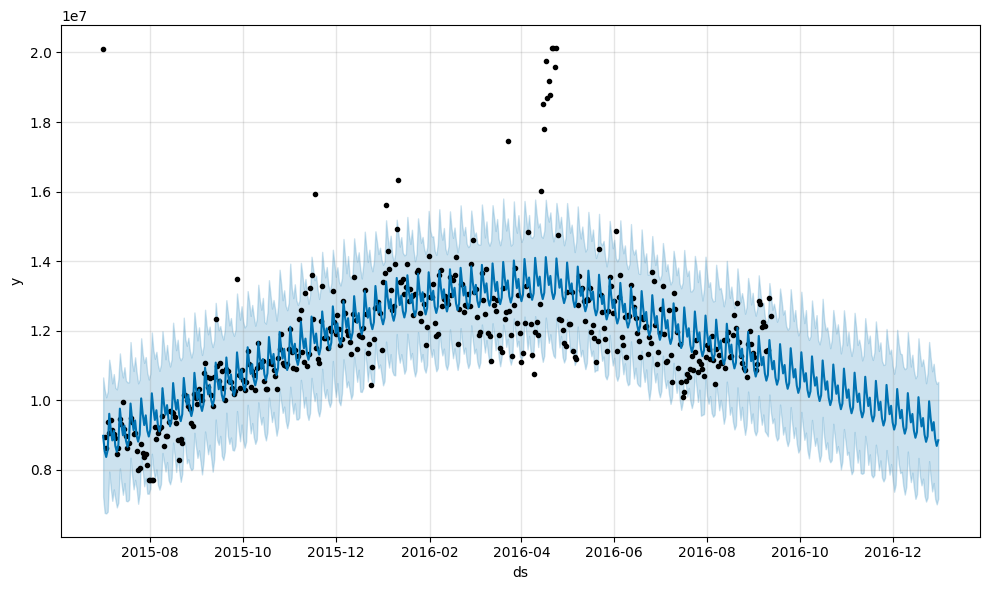

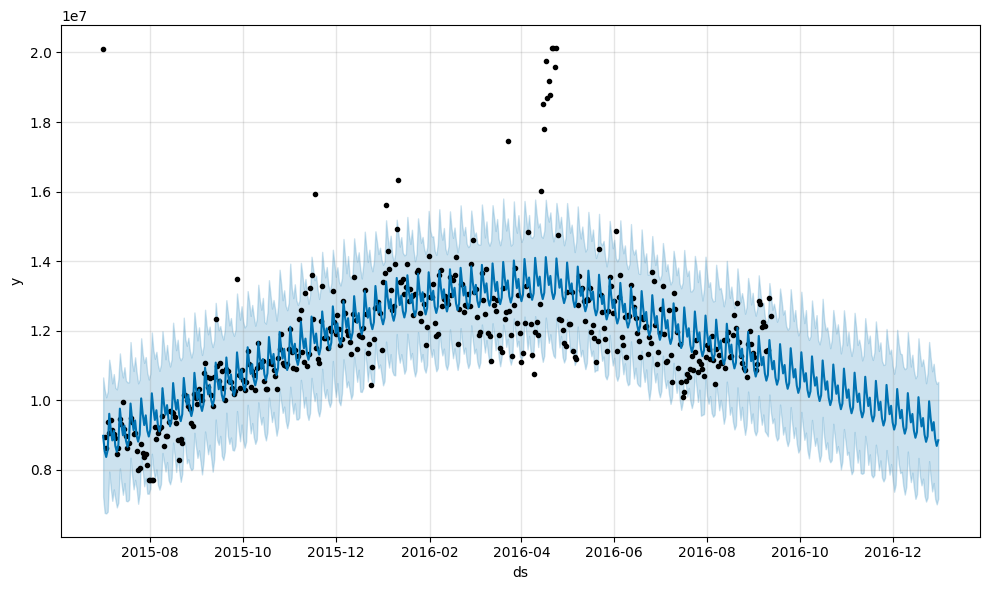

In [3178]:
m.plot(forecast)

In [3179]:
performance(df4_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 748032.636
RMSE 1329317.711
MAPE 0.059


### **without Exog Variable**

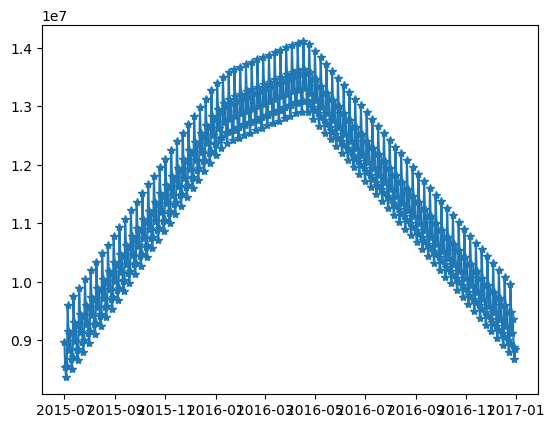

In [3180]:
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

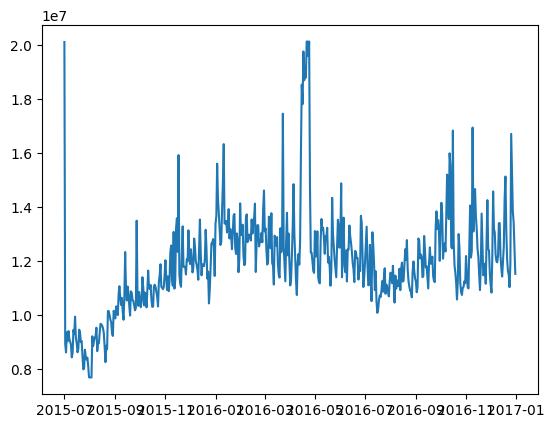

In [3181]:
plt.plot(df4_fb["ds"] , df4_fb["y"] , label = "actual")

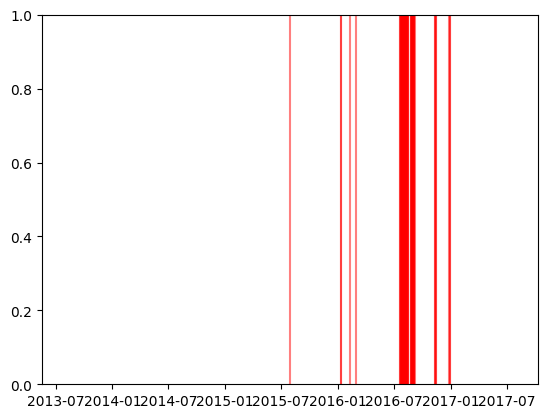

In [3182]:
for x in df4_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

### **with Exog Variable**

In [3183]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [3184]:
model2.add_regressor("Exog")

In [3185]:
model2.fit(df4_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3186]:
forecast2 = model2.predict(df4_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


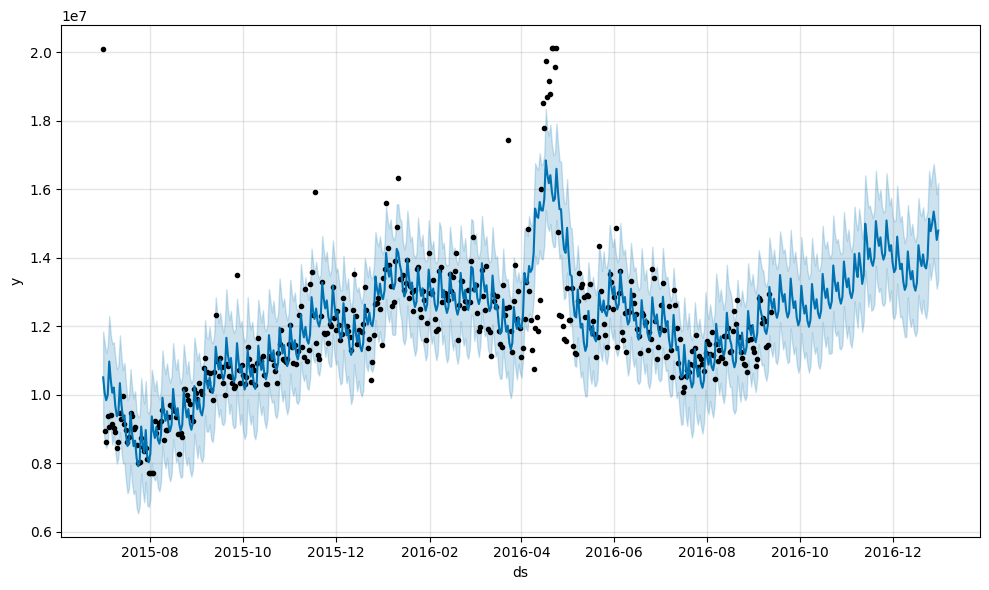

In [3187]:
fig = model2.plot(forecast2)

In [3188]:
performance(df4_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 663210.91
RMSE 1084395.227
MAPE 0.054


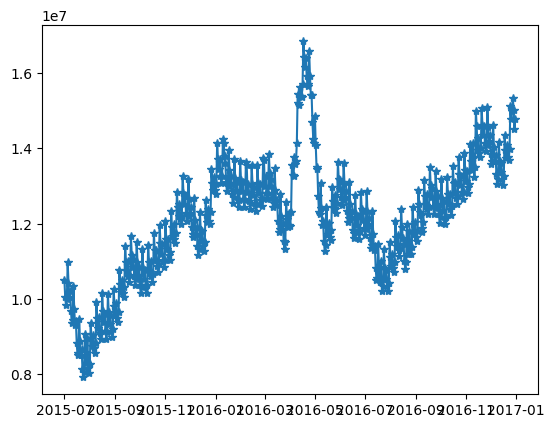

In [3189]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

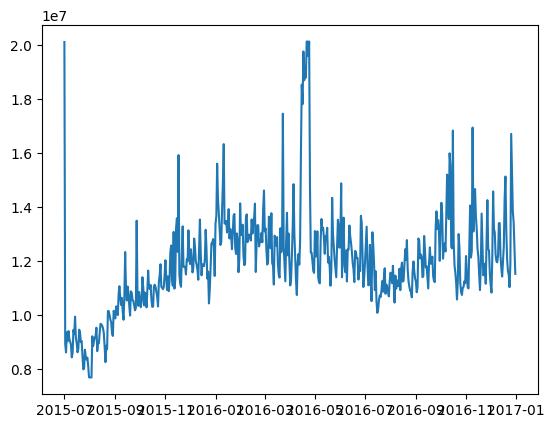

In [3190]:
plt.plot(df4_fb["ds"] , df4_fb["y"] , label = "actual")

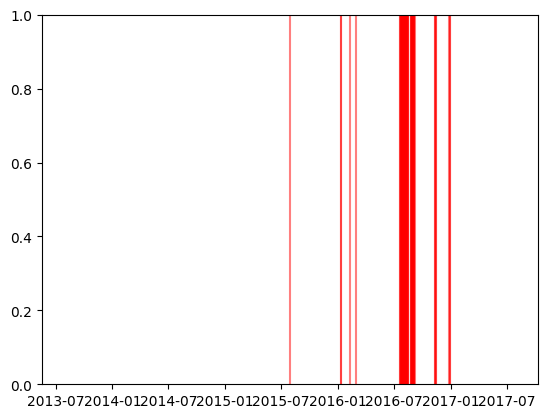

In [3191]:
for x in df4_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Fifth Language is "ja"**

## **Observation**

In [3192]:
df5 = df_new[["Date" , "ja"]]
df5.head()

,Date,ja
0,2015-07-01,1.228639e+07
1,2015-07-02,1.405644e+07
2,2015-07-03,1.259897e+07
3,2015-07-04,1.586096e+07
4,2015-07-05,1.532414e+07


In [3193]:
df5.columns

Index(['Date', 'ja'], dtype='object')

In [3194]:
df5.dtypes

Date    datetime64[ns]
ja             float64
dtype: object

In [3195]:
df5.shape

(550, 2)

In [3196]:
df5["ja"].describe()

count    5.500000e+02
mean     1.687728e+07
std      3.142653e+06
min      9.271388e+06
25%      1.450158e+07
50%      1.668964e+07
75%      1.858003e+07
max      3.315937e+07
Name: ja, dtype: float64

In [3197]:
df5["Date"].describe()

<ipython-input-3197-83e53b0e4f67>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df5["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

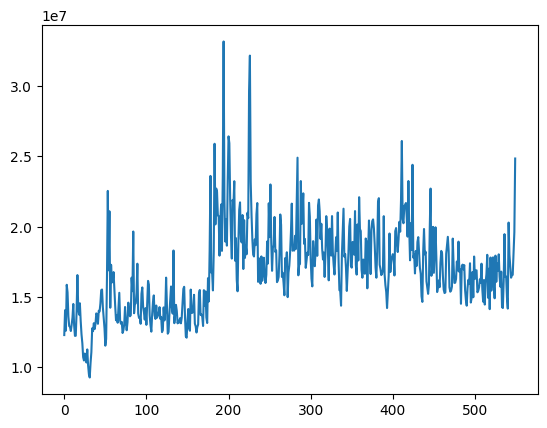

In [3198]:
df5["ja"].plot()

[]

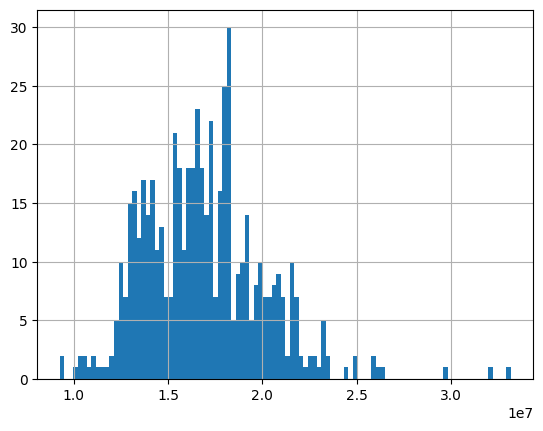

In [3199]:
df5["ja"].hist(bins = 100).plot()

In [3200]:
lower = df5["ja"].quantile(.005)
lower

10260709.133927751

In [3201]:
upper = df5["ja"].quantile(.995)
upper

27233967.708928555

In [3202]:
df5["ja"]

0      1.228639e+07
1      1.405644e+07
2      1.259897e+07
3      1.586096e+07
4      1.532414e+07
           ...     
545    1.653282e+07
546    1.656946e+07
547    1.814224e+07
548    1.960471e+07
549    2.483875e+07
Name: ja, Length: 550, dtype: float64

In [3203]:
df5[df5["ja"] > upper]

,Date,ja
194,2016-01-11,3.315937e+07
225,2016-02-11,2.963171e+07
226,2016-02-12,3.215432e+07


In [3204]:
df5[df5["ja"] < lower]

,Date,ja
29,2015-07-30,1.015518e+07
30,2015-07-31,9.497212e+06
31,2015-08-01,9.271388e+06


In [3205]:
df5["ja"] = df5["ja"].clip(upper , lower )

<ipython-input-3205-6cc8b8948ea3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5["ja"] = df5["ja"].clip(upper , lower )


<Axes: >

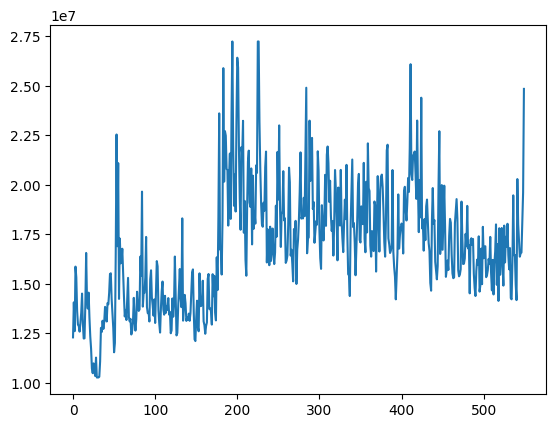

In [3206]:
df5["ja"].plot()

In [3207]:
df5_exog = pd.concat([df5, exog], axis=1)
df5_exog

,Date,ja,Exog
0,2015-07-01,1.228639e+07,0
1,2015-07-02,1.405644e+07,0
2,2015-07-03,1.259897e+07,0
3,2015-07-04,1.586096e+07,0
4,2015-07-05,1.532414e+07,0
...,...,...,...
545,2016-12-27,1.653282e+07,1
546,2016-12-28,1.656946e+07,1
547,2016-12-29,1.814224e+07,1
548,2016-12-30,1.960471e+07,0


## **Decomposition Time Series**

In [3208]:
df5.set_index("Date" , inplace = True)

In [3209]:
model = sm.tsa.seasonal_decompose(df5["ja"] , model = "additive")

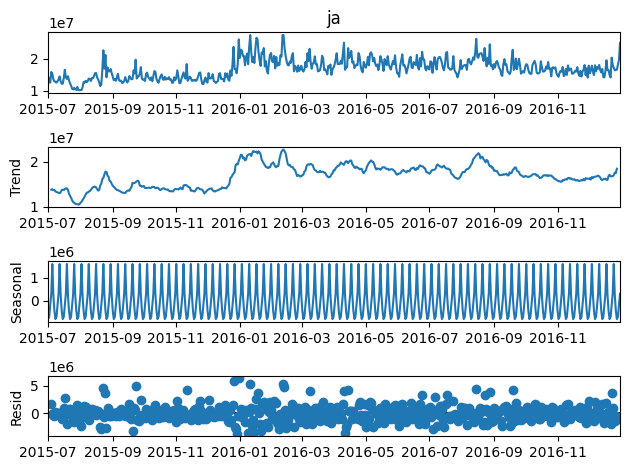

In [3210]:
model.plot()
plt.show()

In [3211]:
model = sm.tsa.seasonal_decompose(df5["ja"] , model = "multiplicative")

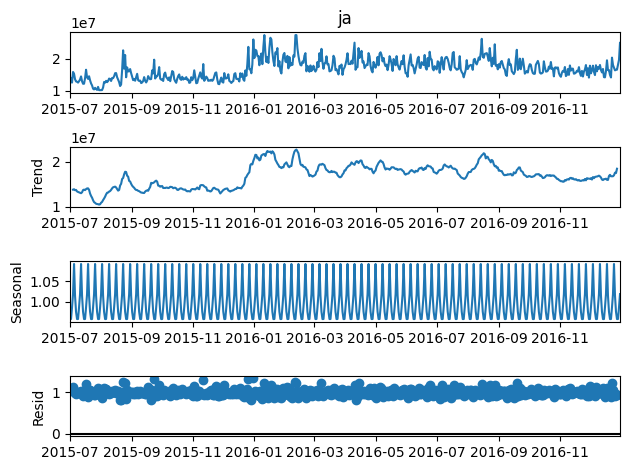

In [3212]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [3213]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [3214]:
model = sm.tsa.seasonal_decompose(df5["ja"] , model = "additive")

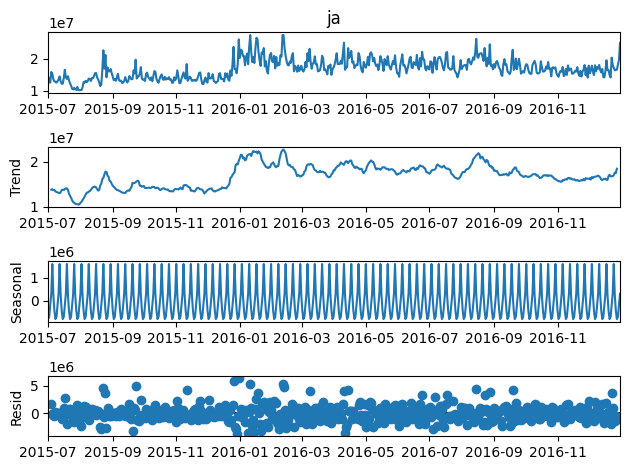

In [3215]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

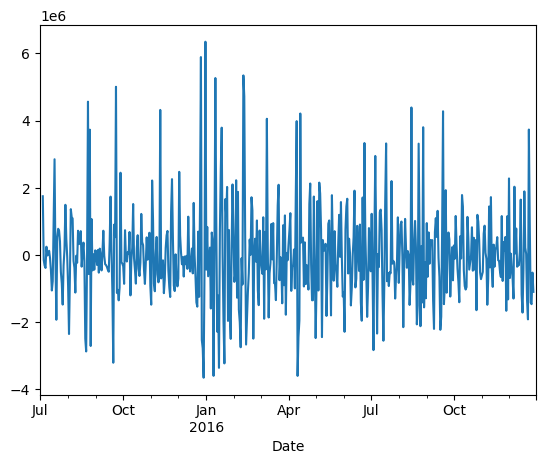

In [3216]:
model.resid.plot()

In [3217]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [3218]:
model = sm.tsa.seasonal_decompose(df5["ja"] , model = "additive")

<Axes: xlabel='Date'>

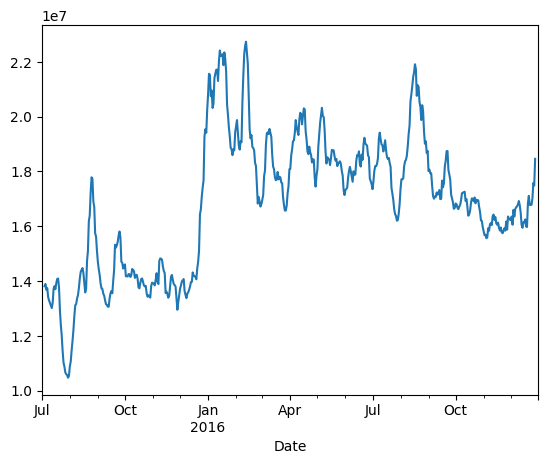

In [3219]:
model.trend.plot()

<Axes: xlabel='Date'>

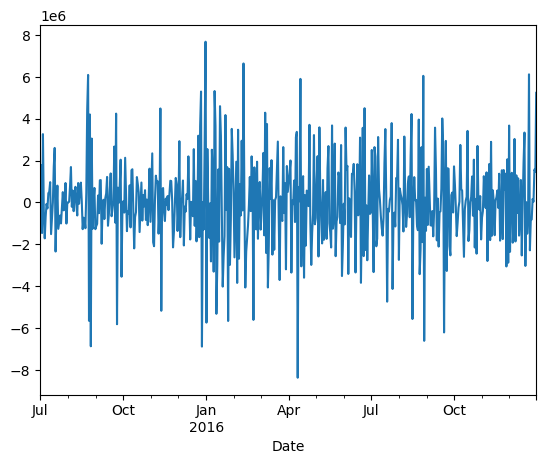

In [3220]:
df5["ja"].diff(1).plot()

In [3221]:
adf_test(df5["ja"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

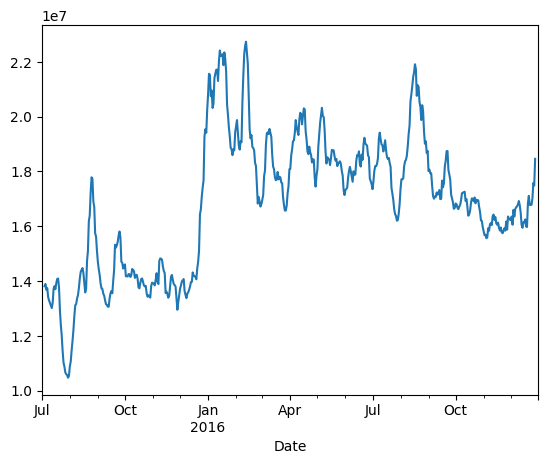

In [3222]:
model.trend.plot()

<Axes: xlabel='Date'>

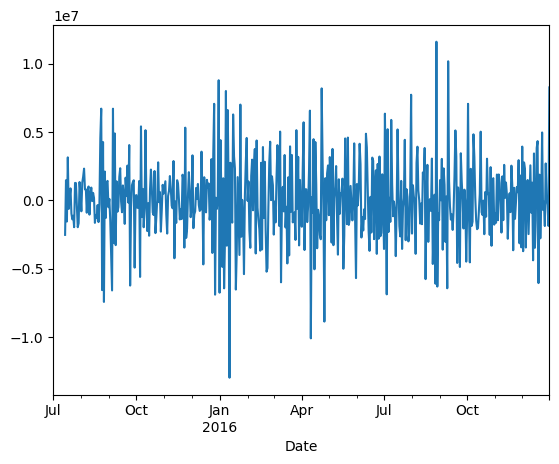

In [3223]:
df5["ja"].diff(1).diff(12).plot()

In [3224]:
adf_test(df5["ja"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [3225]:
df5.head()

,ja
Date,
2015-07-01,1.228639e+07
2015-07-02,1.405644e+07
2015-07-03,1.259897e+07
2015-07-04,1.586096e+07
2015-07-05,1.532414e+07


In [3226]:
df5.reset_index(inplace = True)

In [3227]:
df5.head()

,Date,ja
0,2015-07-01,1.228639e+07
1,2015-07-02,1.405644e+07
2,2015-07-03,1.259897e+07
3,2015-07-04,1.586096e+07
4,2015-07-05,1.532414e+07


In [3228]:
train_x = df5.loc[df5.index < df5.index[-110]].copy()

In [3229]:
test_x = df5.loc[df5.index >= df5.index[-110]].copy()

In [3230]:
train_x.head()

,Date,ja
0,2015-07-01,1.228639e+07
1,2015-07-02,1.405644e+07
2,2015-07-03,1.259897e+07
3,2015-07-04,1.586096e+07
4,2015-07-05,1.532414e+07


In [3231]:
test_x.head()

,Date,ja
440,2016-09-13,18208550.0
441,2016-09-14,16104615.0
442,2016-09-15,15644201.5
443,2016-09-16,15217842.5
444,2016-09-17,15891415.5


In [3232]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [3233]:
adf_test(train_x["ja"])

Sequence is not Stationary


In [3234]:
model = SARIMAX(train_x["ja"] , order = (15,1,15))

In [3235]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3236]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

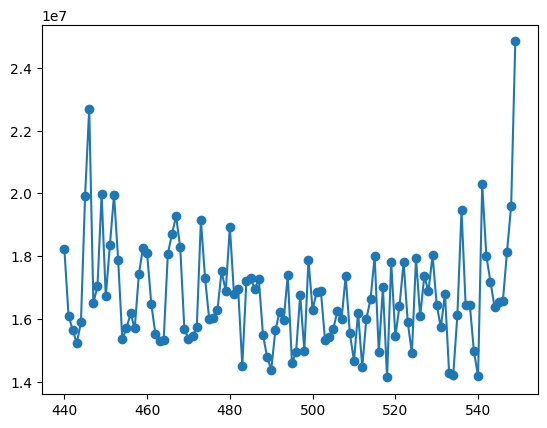

In [3237]:
test_x["ja"].plot(style = "-o")

In [3238]:
test_x["ja"].isnull().sum()

0

<Axes: >

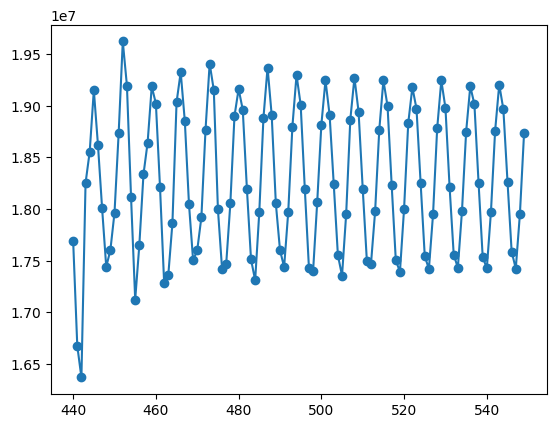

In [3239]:
test_x["pred"].plot(style = "-o")

In [3240]:
test_x["pred"].isnull().sum()

0

In [3241]:
performance(test_x["ja"] , test_x["pred"])

MAE 1909875.978
RMSE 2203395.932
MAPE 0.118


## **SARIMA**

In [3242]:
adf_test(train_x["ja"])

Sequence is not Stationary


In [3243]:
model = SARIMAX(train_x["ja"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [3244]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3245]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

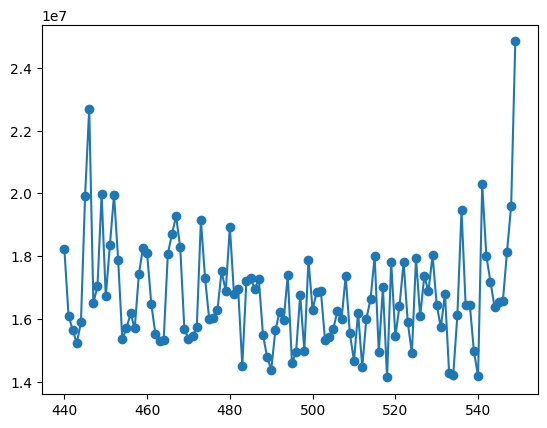

In [3246]:
test_x["ja"].plot(style = "-o")

In [3247]:
test_x["ja"].isnull().sum()

0

<Axes: >

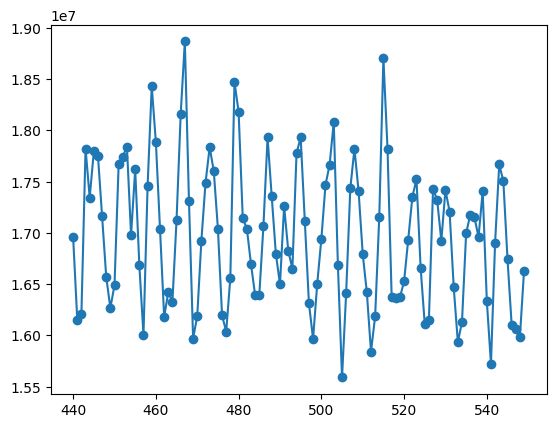

In [3248]:
test_x["pred"].plot(style = "-o")

In [3249]:
test_x["pred"].isnull().sum()

0

In [3250]:
performance(test_x["ja"] , test_x["pred"])

MAE 1219146.191
RMSE 1688271.084
MAPE 0.072


## **SARIMAX without EXOG**

In [3251]:
train = df5_exog.iloc[:440]
train.head()

,Date,ja,Exog
0,2015-07-01,1.228639e+07,0
1,2015-07-02,1.405644e+07,0
2,2015-07-03,1.259897e+07,0
3,2015-07-04,1.586096e+07,0
4,2015-07-05,1.532414e+07,0


In [3252]:
test = df5_exog.iloc[440:]
test.head()

,Date,ja,Exog
440,2016-09-13,18208550.0,0
441,2016-09-14,16104615.0,0
442,2016-09-15,15644201.5,0
443,2016-09-16,15217842.5,0
444,2016-09-17,15891415.5,0


In [3253]:
model = SARIMAX(train["ja"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3254]:
results = model.fit(disp=False)

In [3255]:
fc = results.forecast(110)

In [3256]:
start = len(train_x)

In [3257]:
end = len(train_x) + len(test_x) - 1

In [3258]:
predictions = results.predict(start = start , end = end)
predictions

440    1.755698e+07
441    1.716432e+07
442    1.711795e+07
443    1.760057e+07
444    1.831359e+07
           ...     
545    1.774162e+07
546    1.721417e+07
547    1.706804e+07
548    1.747087e+07
549    1.812082e+07
Name: predicted_mean, Length: 110, dtype: float64

In [3259]:
performance(test["ja"] , predictions)

MAE 1802953.826
RMSE 2089336.409
MAPE 0.11


***Plot predictions against known values***

In [3260]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

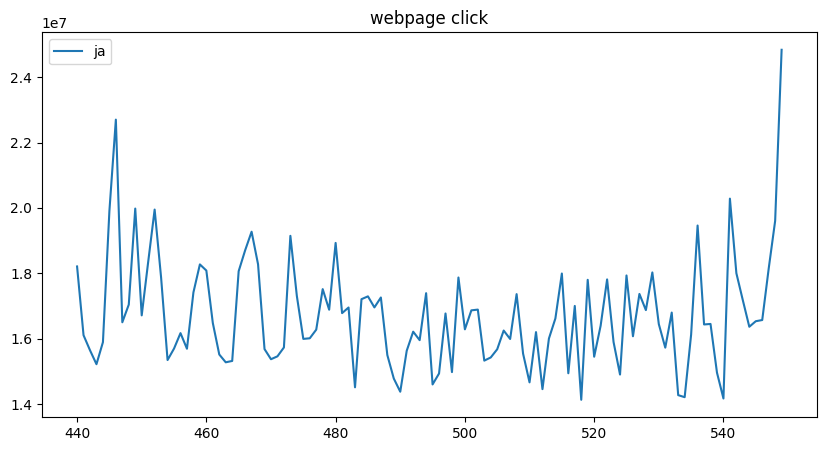

In [3261]:
ax = test["ja"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

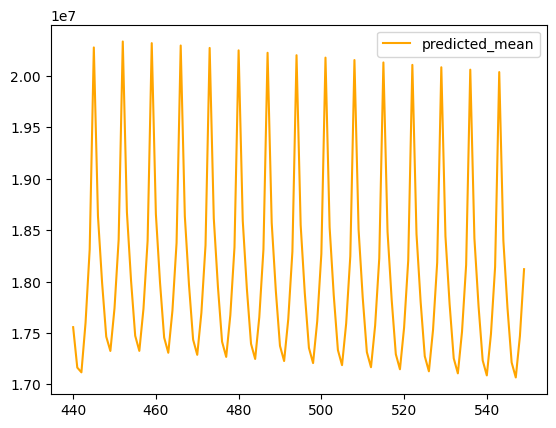

In [3262]:
predictions.plot(legend = True , color = "orange")

In [3263]:
ax.autoscale (axis = "x" , tight = True)

In [3264]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3265]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [3266]:
train = df5_exog.iloc[:440]
train.head()

,Date,ja,Exog
0,2015-07-01,1.228639e+07,0
1,2015-07-02,1.405644e+07,0
2,2015-07-03,1.259897e+07,0
3,2015-07-04,1.586096e+07,0
4,2015-07-05,1.532414e+07,0


In [3267]:
test = df5_exog.iloc[440:]
test.head()

,Date,ja,Exog
440,2016-09-13,18208550.0,0
441,2016-09-14,16104615.0,0
442,2016-09-15,15644201.5,0
443,2016-09-16,15217842.5,0
444,2016-09-17,15891415.5,0


In [3268]:
model = SARIMAX(train["ja"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3269]:
results = model.fit(disp=False)

In [3270]:
exog_forecast = test[["Exog"]]

In [3271]:
start = len(train_x)

In [3272]:
end = len(train_x) + len(test_x) - 1

In [3273]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    1.626677e+07
441    1.533965e+07
442    1.433946e+07
443    1.396616e+07
444    1.390291e+07
           ...     
545    2.771333e+07
546    2.775850e+07
547    2.759348e+07
548    9.399212e+06
549    9.842838e+06
Name: Predictions, Length: 110, dtype: float64

In [3274]:
performance(test["ja"] , predictions)

MAE 6421412.678
RMSE 6807240.845
MAPE 0.381


***Plot predictions against known values***

In [3275]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

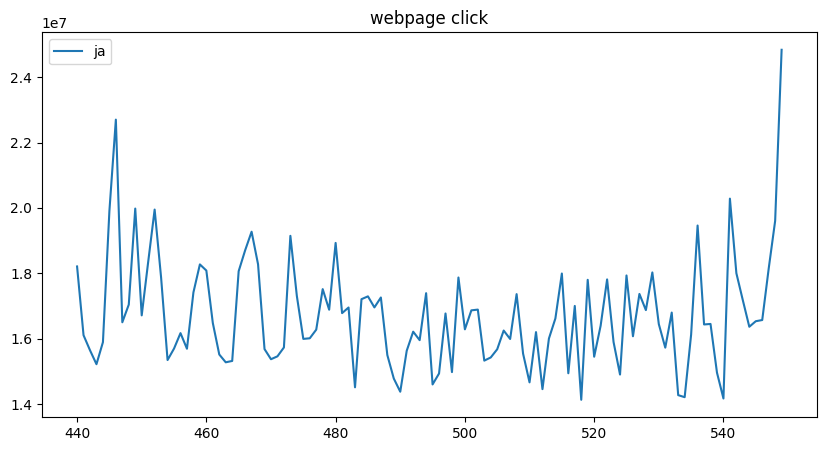

In [3276]:
ax = test["ja"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

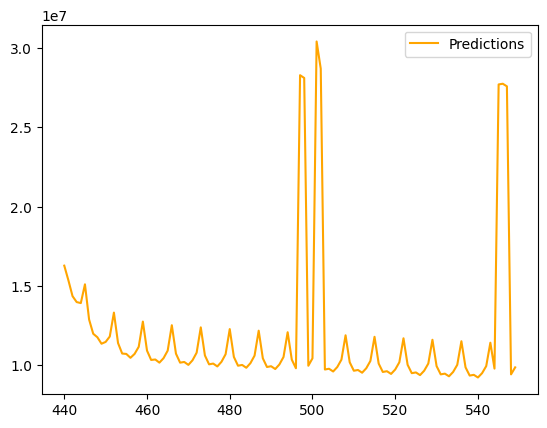

In [3277]:
predictions.plot(legend = True , color = "orange")

In [3278]:
ax.autoscale (axis = "x" , tight = True)

In [3279]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3280]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

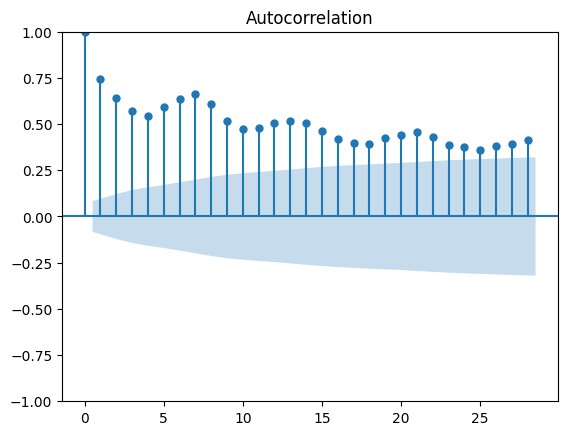

In [3281]:
plot_acf(df5["ja"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


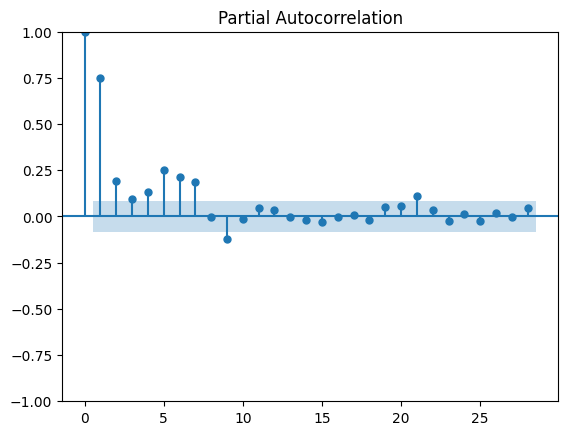

In [3282]:
plot_pacf(df5["ja"])
plt.show()

## **Facebook Prophet**

In [3283]:
df5_exog.head()

,Date,ja,Exog
0,2015-07-01,1.228639e+07,0
1,2015-07-02,1.405644e+07,0
2,2015-07-03,1.259897e+07,0
3,2015-07-04,1.586096e+07,0
4,2015-07-05,1.532414e+07,0


In [3284]:
df5_fb = df5_exog.copy()

In [3285]:
df5_fb.head()

,Date,ja,Exog
0,2015-07-01,1.228639e+07,0
1,2015-07-02,1.405644e+07,0
2,2015-07-03,1.259897e+07,0
3,2015-07-04,1.586096e+07,0
4,2015-07-05,1.532414e+07,0


In [3286]:
df5_fb["ds"] = pd.to_datetime(df5_fb["Date"])

In [3287]:
df5_fb["y"] = df5_fb["ja"]

In [3288]:
df5_fb = df5_fb[["ds" , "y" , "Exog"]]

In [3289]:
df5_fb.head()

,ds,y,Exog
0,2015-07-01,1.228639e+07,0
1,2015-07-02,1.405644e+07,0
2,2015-07-03,1.259897e+07,0
3,2015-07-04,1.586096e+07,0
4,2015-07-05,1.532414e+07,0


In [3290]:
from fbprophet import Prophet

In [3291]:
m = Prophet()

In [3292]:
m.fit(df5_fb[["ds" , "y"]][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3293]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [3294]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3295]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,1.245434e+07,9.068637e+06,1.483435e+07,1.245434e+07,1.245434e+07,-7.663405e+05,-7.663405e+05,-7.663405e+05,-7.663405e+05,-7.663405e+05,-7.663405e+05,0.0,0.0,0.0,1.168800e+07
1,2015-07-02,1.247525e+07,8.980242e+06,1.486355e+07,1.247525e+07,1.247525e+07,-6.771058e+05,-6.771058e+05,-6.771058e+05,-6.771058e+05,-6.771058e+05,-6.771058e+05,0.0,0.0,0.0,1.179814e+07
2,2015-07-03,1.249615e+07,9.337553e+06,1.533967e+07,1.249615e+07,1.249615e+07,-2.527975e+05,-2.527975e+05,-2.527975e+05,-2.527975e+05,-2.527975e+05,-2.527975e+05,0.0,0.0,0.0,1.224335e+07
3,2015-07-04,1.251706e+07,1.004989e+07,1.566554e+07,1.251706e+07,1.251706e+07,3.326417e+05,3.326417e+05,3.326417e+05,3.326417e+05,3.326417e+05,3.326417e+05,0.0,0.0,0.0,1.284970e+07
4,2015-07-05,1.253796e+07,1.122929e+07,1.673330e+07,1.253796e+07,1.253796e+07,1.550412e+06,1.550412e+06,1.550412e+06,1.550412e+06,1.550412e+06,1.550412e+06,0.0,0.0,0.0,1.408837e+07


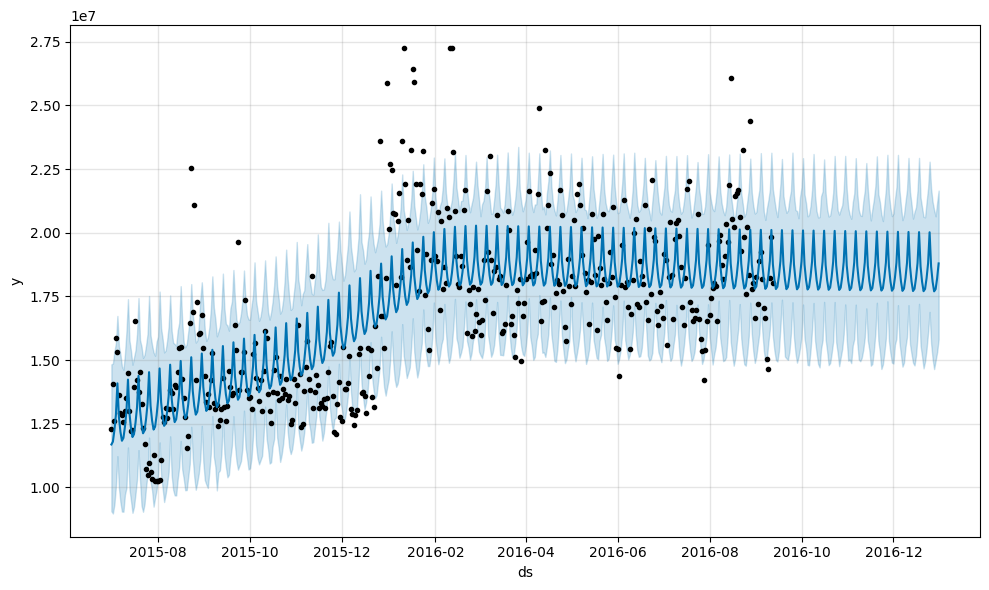

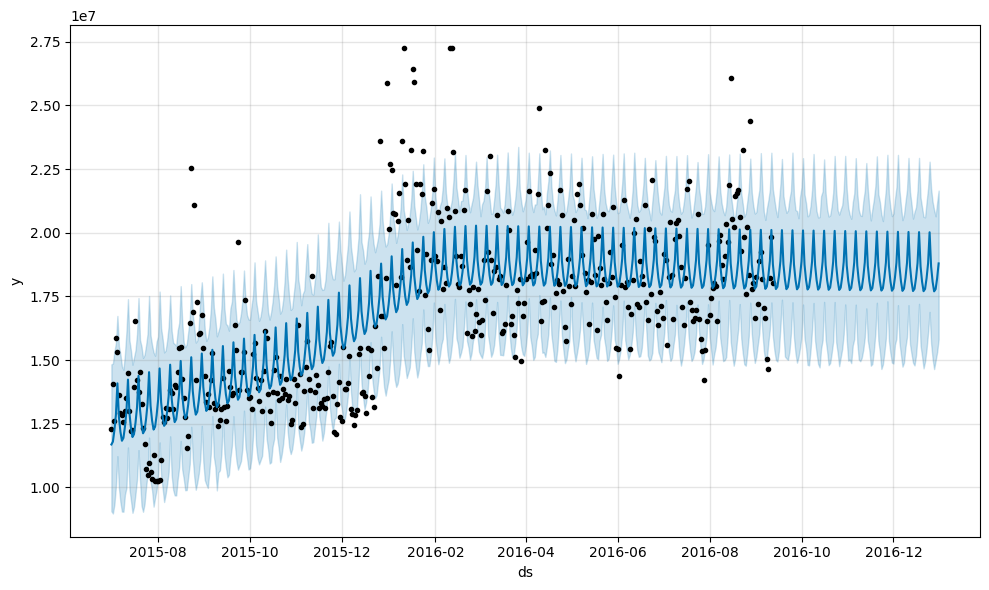

In [3296]:
m.plot(forecast)

In [3297]:
performance(df5_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 1655631.941
RMSE 2243333.426
MAPE 0.098


### **without Exog Variable**

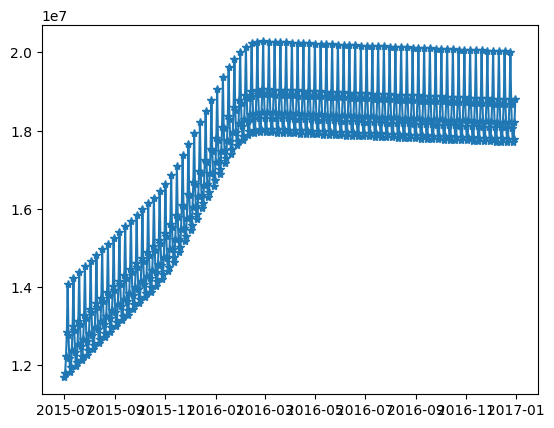

In [3298]:
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

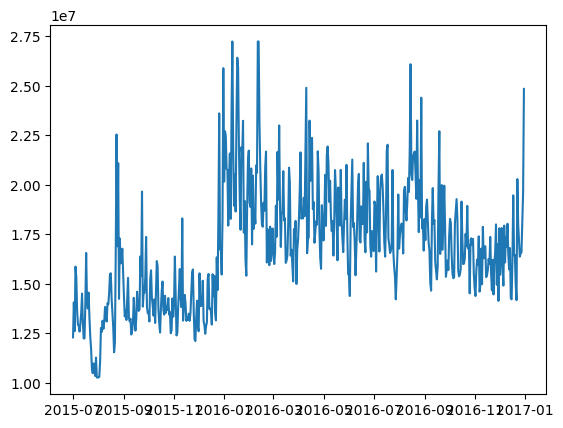

In [3299]:
plt.plot(df5_fb["ds"] , df5_fb["y"] , label = "actual")

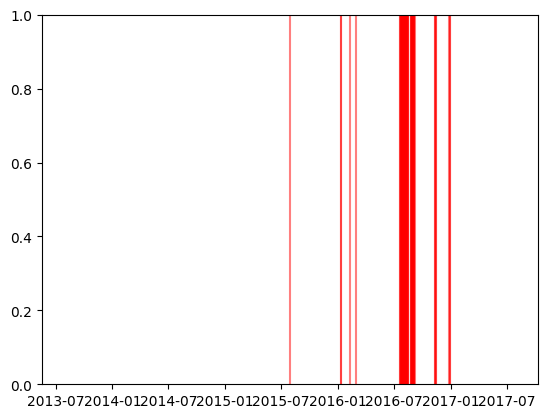

In [3300]:
for x in df5_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

### **with Exog Variable**

In [3301]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [3302]:
model2.add_regressor("Exog")

In [3303]:
model2.fit(df5_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3304]:
forecast2 = model2.predict(df5_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


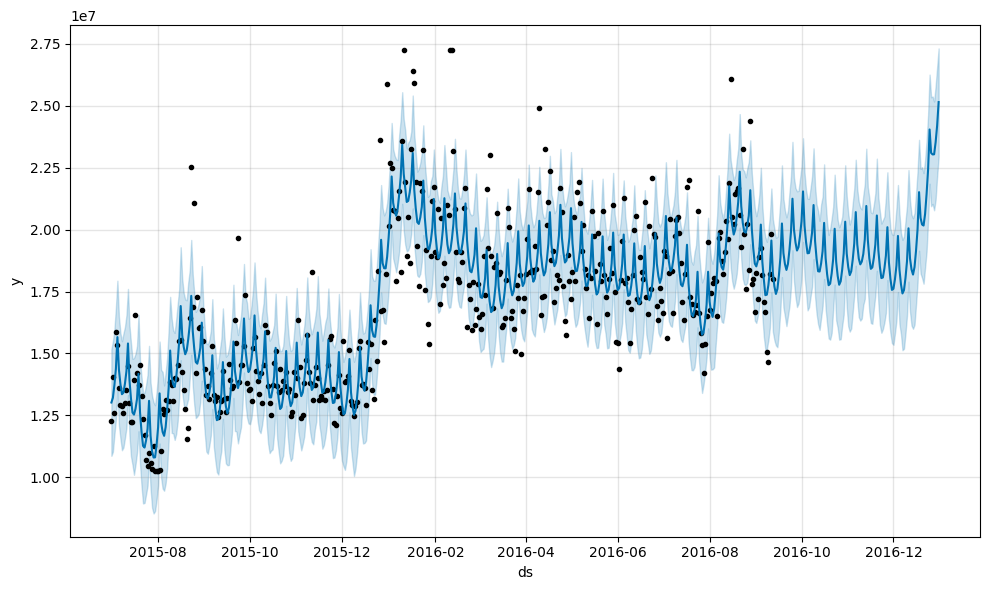

In [3305]:
fig = model2.plot(forecast2)

In [3306]:
performance(df5_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 1231971.422
RMSE 1734022.206
MAPE 0.071


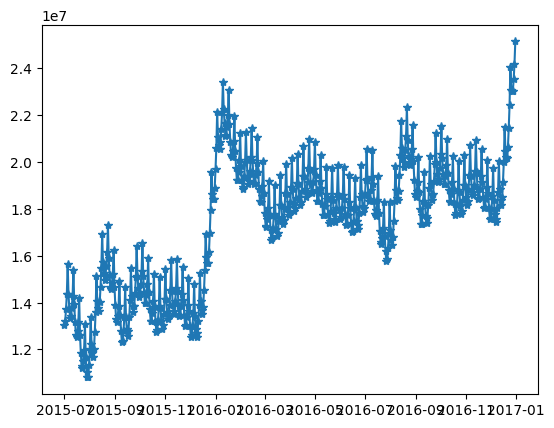

In [3307]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

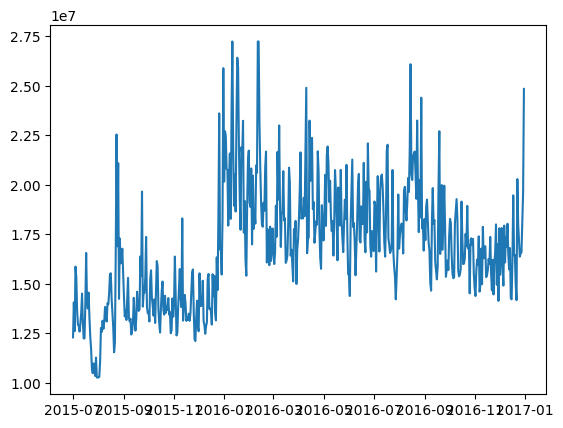

In [3308]:
plt.plot(df5_fb["ds"] , df5_fb["y"] , label = "actual")

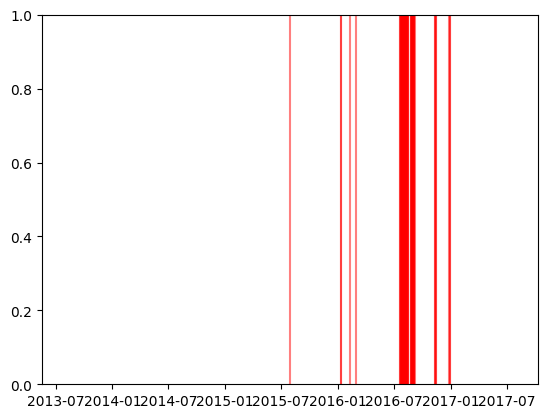

In [3309]:
for x in df5_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Sixth Language is "ru"**

## **Observation**

In [3310]:
df6 = df_new[["Date" , "ru"]]
df6.head()

,Date,ru
0,2015-07-01,9.786120e+06
1,2015-07-02,9.840218e+06
2,2015-07-03,9.153942e+06
3,2015-07-04,8.600905e+06
4,2015-07-05,9.446731e+06


In [3311]:
df6.columns

Index(['Date', 'ru'], dtype='object')

In [3312]:
df6.dtypes

Date    datetime64[ns]
ru             float64
dtype: object

In [3313]:
df6.shape

(550, 2)

In [3314]:
df6["ru"].describe()

count    5.500000e+02
mean     1.502586e+07
std      5.896514e+06
min      7.615411e+06
25%      1.249115e+07
50%      1.395283e+07
75%      1.522559e+07
max      4.463457e+07
Name: ru, dtype: float64

In [3315]:
df6["Date"].describe()

<ipython-input-3315-d1c8af18adf4>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df6["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

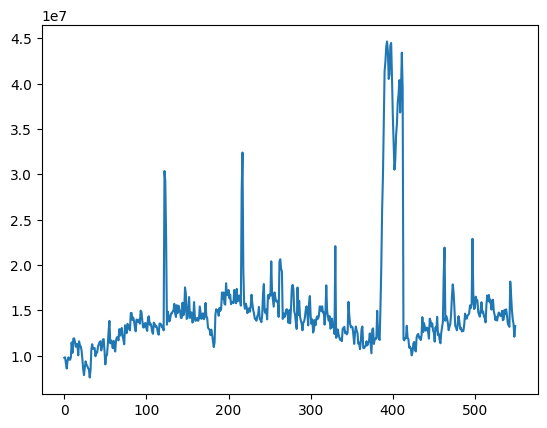

In [3316]:
df6["ru"].plot()

[]

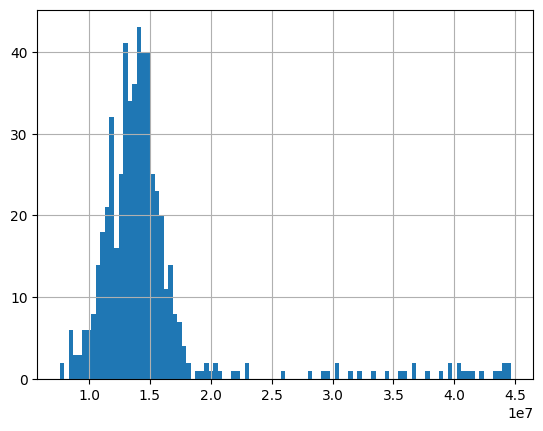

In [3317]:
df6["ru"].hist(bins = 100).plot()

In [3318]:
lower = df6["ru"].quantile(.005)
lower

8499960.93201802

In [3319]:
upper = df6["ru"].quantile(.995)
upper

44064124.63540707

In [3320]:
df6["ru"]

0      9.786120e+06
1      9.840218e+06
2      9.153942e+06
3      8.600905e+06
4      9.446731e+06
           ...     
545    1.507706e+07
546    1.404272e+07
547    1.352207e+07
548    1.210293e+07
549    1.327909e+07
Name: ru, Length: 550, dtype: float64

In [3321]:
df6[df6["ru"] > upper]

,Date,ru
393,2016-07-28,4.463457e+07
397,2016-08-01,4.417801e+07
398,2016-08-02,4.447387e+07


In [3322]:
df6[df6["ru"] < lower]

,Date,ru
24,2015-07-25,7.874514e+06
31,2015-08-01,7.615411e+06
32,2015-08-02,8.469992e+06


In [3323]:
df6["ru"] = df6["ru"].clip(upper , lower )

<ipython-input-3323-5d8137474f58>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df6["ru"] = df6["ru"].clip(upper , lower )


<Axes: >

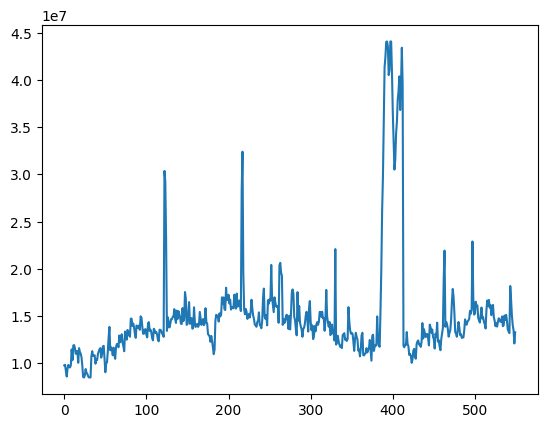

In [3324]:
df6["ru"].plot()

In [3325]:
df6_exog = pd.concat([df6, exog], axis=1)
df6_exog

,Date,ru,Exog
0,2015-07-01,9.786120e+06,0
1,2015-07-02,9.840218e+06,0
2,2015-07-03,9.153942e+06,0
3,2015-07-04,8.600905e+06,0
4,2015-07-05,9.446731e+06,0
...,...,...,...
545,2016-12-27,1.507706e+07,1
546,2016-12-28,1.404272e+07,1
547,2016-12-29,1.352207e+07,1
548,2016-12-30,1.210293e+07,0


## **Decomposition Time Series**

In [3326]:
df6.set_index("Date" , inplace = True)

In [3327]:
model = sm.tsa.seasonal_decompose(df6["ru"] , model = "additive")

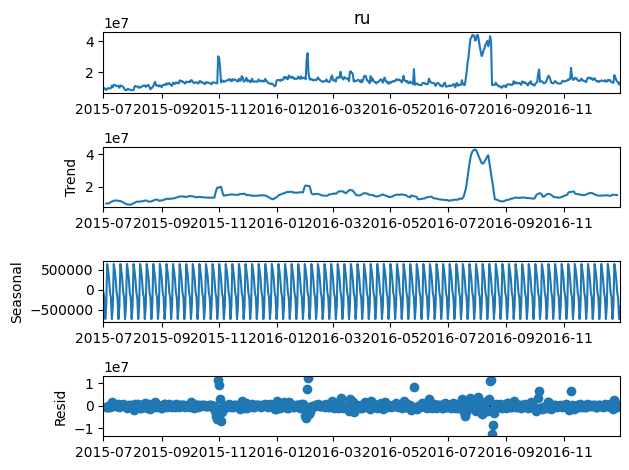

In [3328]:
model.plot()
plt.show()

In [3329]:
model = sm.tsa.seasonal_decompose(df6["ru"] , model = "multiplicative")

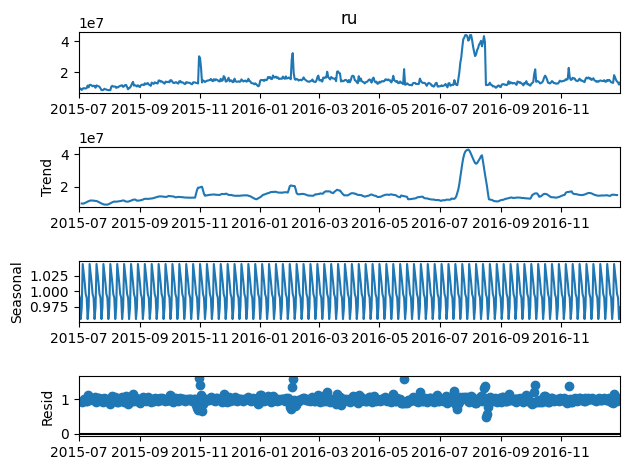

In [3330]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [3331]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [3332]:
model = sm.tsa.seasonal_decompose(df6["ru"] , model = "additive")

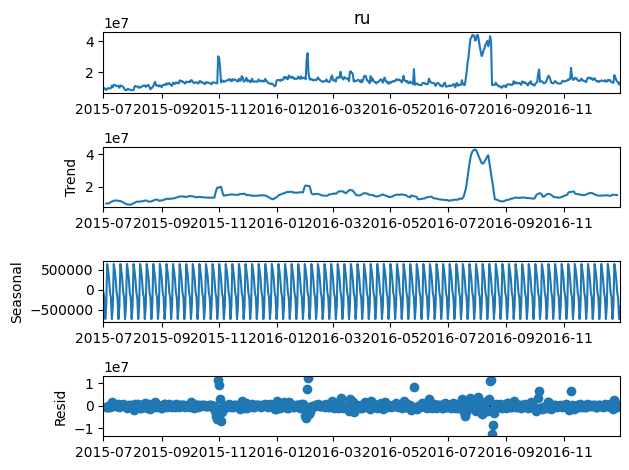

In [3333]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

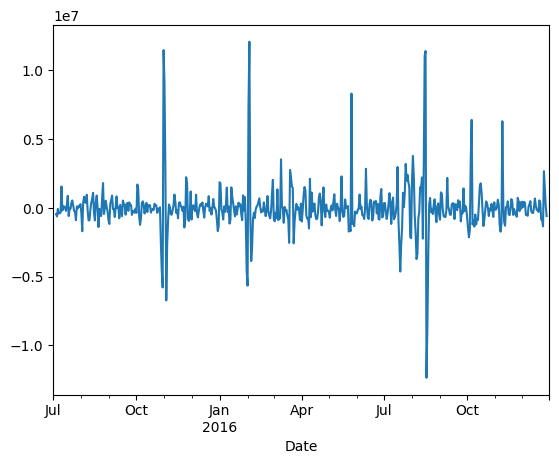

In [3334]:
model.resid.plot()

In [3335]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [3336]:
model = sm.tsa.seasonal_decompose(df6["ru"] , model = "additive")

<Axes: xlabel='Date'>

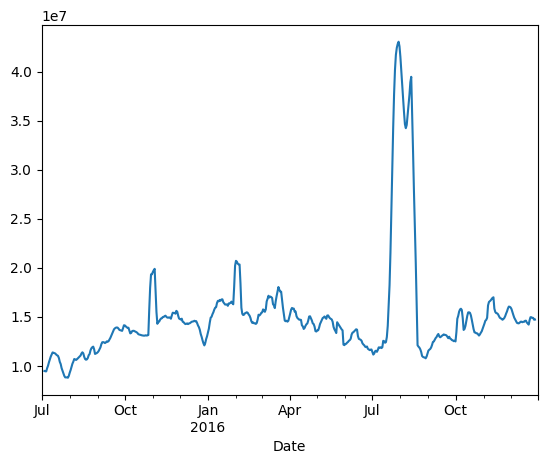

In [3337]:
model.trend.plot()

<Axes: xlabel='Date'>

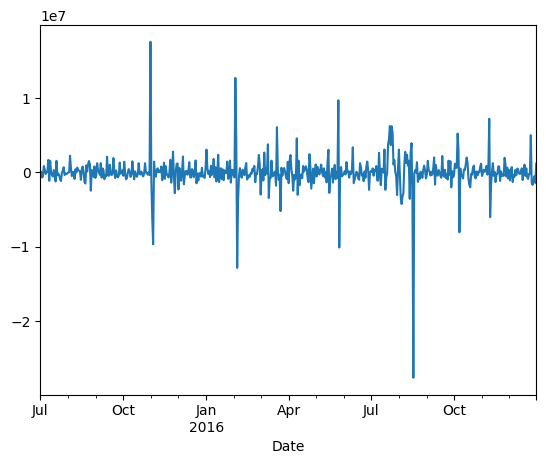

In [3338]:
df6["ru"].diff(1).plot()

In [3339]:
adf_test(df6["ru"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

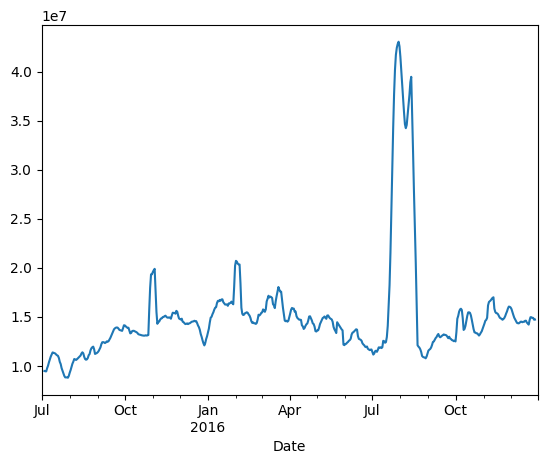

In [3340]:
model.trend.plot()

<Axes: xlabel='Date'>

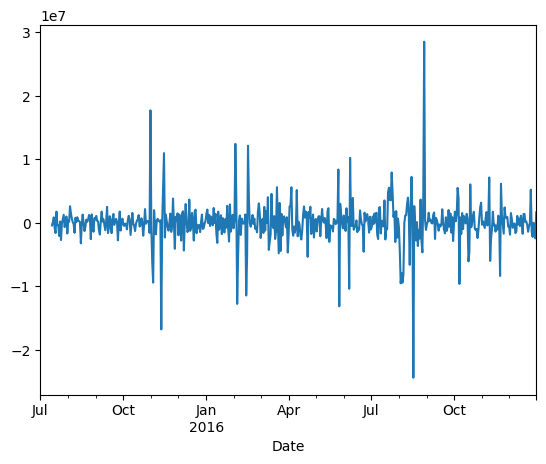

In [3341]:
df6["ru"].diff(1).diff(12).plot()

In [3342]:
adf_test(df6["ru"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [3343]:
df6.head()

,ru
Date,
2015-07-01,9.786120e+06
2015-07-02,9.840218e+06
2015-07-03,9.153942e+06
2015-07-04,8.600905e+06
2015-07-05,9.446731e+06


In [3344]:
df6.reset_index(inplace = True)

In [3345]:
df6.head()

,Date,ru
0,2015-07-01,9.786120e+06
1,2015-07-02,9.840218e+06
2,2015-07-03,9.153942e+06
3,2015-07-04,8.600905e+06
4,2015-07-05,9.446731e+06


In [3346]:
train_x = df6.loc[df6.index < df6.index[-110]].copy()

In [3347]:
test_x = df6.loc[df6.index >= df6.index[-110]].copy()

In [3348]:
train_x.head()

,Date,ru
0,2015-07-01,9.786120e+06
1,2015-07-02,9.840218e+06
2,2015-07-03,9.153942e+06
3,2015-07-04,8.600905e+06
4,2015-07-05,9.446731e+06


In [3349]:
test_x.head()

,Date,ru
440,2016-09-13,12776904.0
441,2016-09-14,13080611.0
442,2016-09-15,13105736.5
443,2016-09-16,12623783.0
444,2016-09-17,11898188.0


In [3350]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [3351]:
adf_test(train_x["ru"])

Sequence is Stationary


In [3352]:
model = SARIMAX(train_x["ru"] , order = (15,1,15))

In [3353]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3354]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

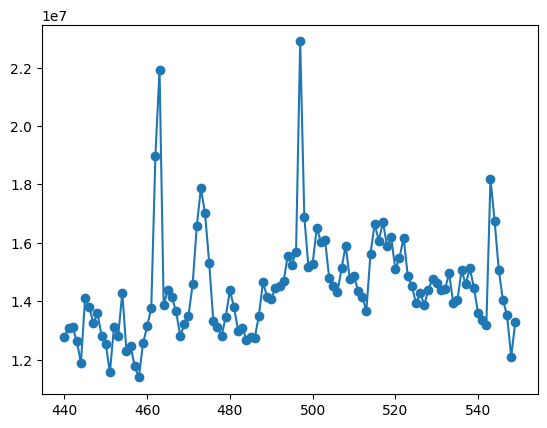

In [3355]:
test_x["ru"].plot(style = "-o")

In [3356]:
test_x["ru"].isnull().sum()

0

<Axes: >

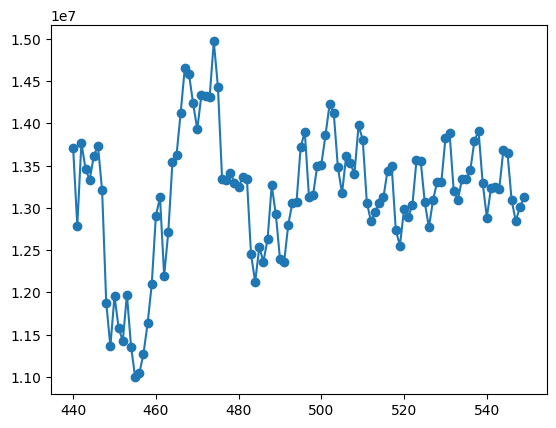

In [3357]:
test_x["pred"].plot(style = "-o")

In [3358]:
test_x["pred"].isnull().sum()

0

In [3359]:
performance(test_x["ru"] , test_x["pred"])

MAE 1493204.896
RMSE 2147638.023
MAPE 0.095


## **SARIMA**

In [3360]:
adf_test(train_x["ru"])

Sequence is Stationary


In [3361]:
model = SARIMAX(train_x["ru"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [3362]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3363]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

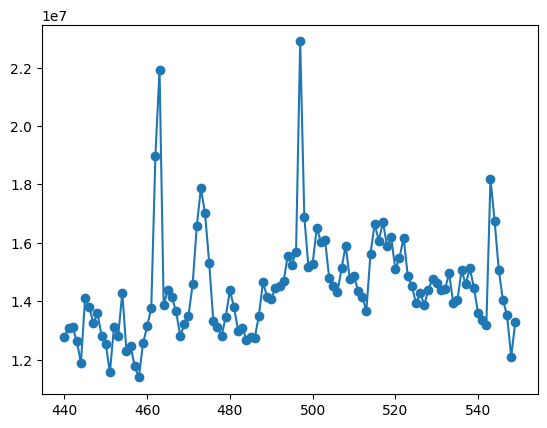

In [3364]:
test_x["ru"].plot(style = "-o")

In [3365]:
test_x["ru"].isnull().sum()

0

<Axes: >

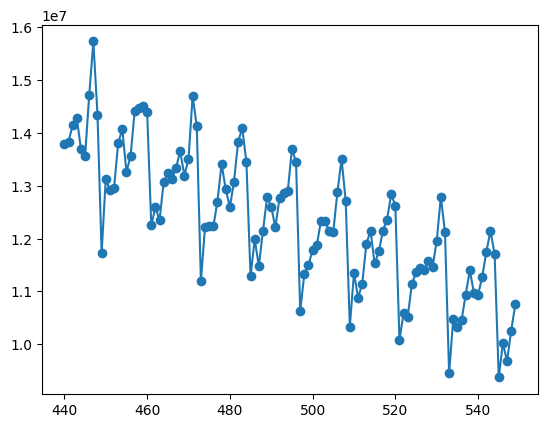

In [3366]:
test_x["pred"].plot(style = "-o")

In [3367]:
test_x["pred"].isnull().sum()

0

In [3368]:
performance(test_x["ru"] , test_x["pred"])

MAE 2625307.209
RMSE 3269892.471
MAPE 0.173


## **SARIMAX without EXOG**

In [3369]:
train = df6_exog.iloc[:440]
train.head()

,Date,ru,Exog
0,2015-07-01,9.786120e+06,0
1,2015-07-02,9.840218e+06,0
2,2015-07-03,9.153942e+06,0
3,2015-07-04,8.600905e+06,0
4,2015-07-05,9.446731e+06,0


In [3370]:
test = df6_exog.iloc[440:]
test.head()

,Date,ru,Exog
440,2016-09-13,12776904.0,0
441,2016-09-14,13080611.0,0
442,2016-09-15,13105736.5,0
443,2016-09-16,12623783.0,0
444,2016-09-17,11898188.0,0


In [3371]:
model = SARIMAX(train["ru"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3372]:
results = model.fit(disp=False)

In [3373]:
fc = results.forecast(110)

In [3374]:
start = len(train_x)

In [3375]:
end = len(train_x) + len(test_x) - 1

In [3376]:
predictions = results.predict(start = start , end = end)
predictions

440    1.307214e+07
441    1.223564e+07
442    1.230319e+07
443    1.207108e+07
444    1.218479e+07
           ...     
545    1.185671e+07
546    1.110531e+07
547    1.115472e+07
548    1.093922e+07
549    1.103028e+07
Name: predicted_mean, Length: 110, dtype: float64

In [3377]:
performance(test["ru"] , predictions)

MAE 2462025.503
RMSE 3056749.012
MAPE 0.16


***Plot predictions against known values***

In [3378]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

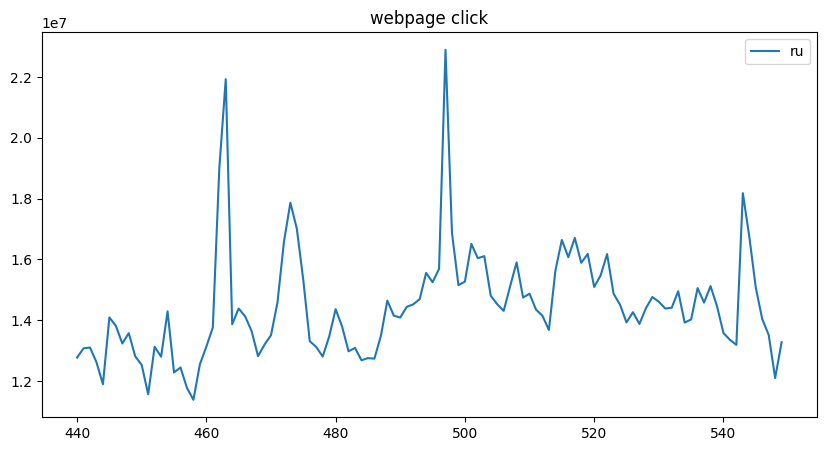

In [3379]:
ax = test["ru"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

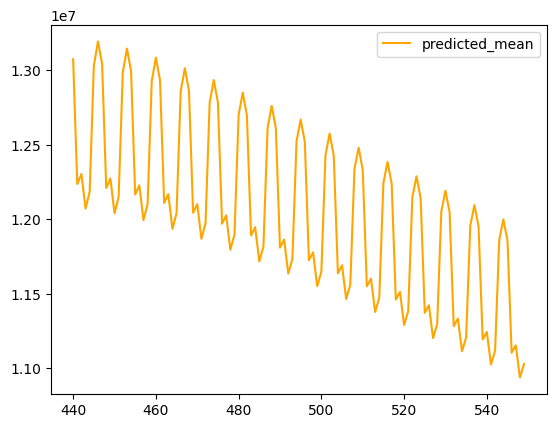

In [3380]:
predictions.plot(legend = True , color = "orange")

In [3381]:
ax.autoscale (axis = "x" , tight = True)

In [3382]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3383]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [3384]:
train = df6_exog.iloc[:440]
train.head()

,Date,ru,Exog
0,2015-07-01,9.786120e+06,0
1,2015-07-02,9.840218e+06,0
2,2015-07-03,9.153942e+06,0
3,2015-07-04,8.600905e+06,0
4,2015-07-05,9.446731e+06,0


In [3385]:
test = df6_exog.iloc[440:]
test.head()

,Date,ru,Exog
440,2016-09-13,12776904.0,0
441,2016-09-14,13080611.0,0
442,2016-09-15,13105736.5,0
443,2016-09-16,12623783.0,0
444,2016-09-17,11898188.0,0


In [3386]:
model = SARIMAX(train["ru"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3387]:
results = model.fit(disp=False)

In [3388]:
exog_forecast = test[["Exog"]]

In [3389]:
start = len(train_x)

In [3390]:
end = len(train_x) + len(test_x) - 1

In [3391]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    1.123108e+07
441    9.276732e+06
442    8.359601e+06
443    7.800514e+06
444    6.765622e+06
           ...     
545    3.148919e+07
546    3.094308e+07
547    3.095788e+07
548    4.183000e+06
549    3.810561e+06
Name: Predictions, Length: 110, dtype: float64

In [3392]:
performance(test["ru"] , predictions)

MAE 9528758.064
RMSE 9880378.928
MAPE 0.654


***Plot predictions against known values***

In [3393]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

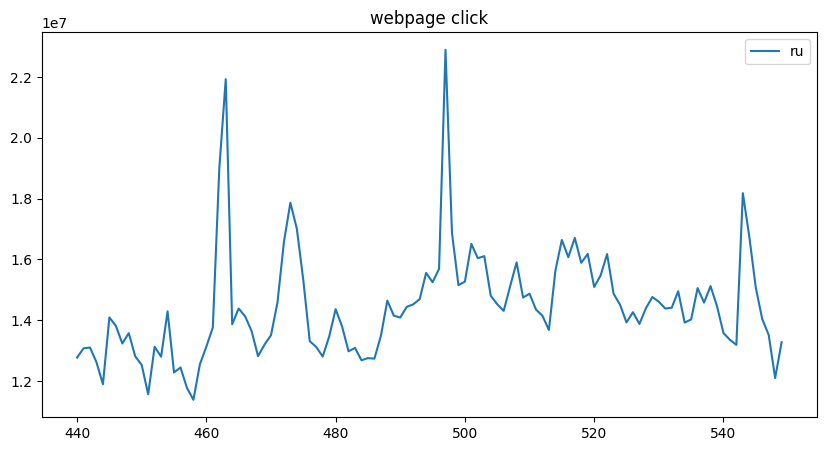

In [3394]:
ax = test["ru"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

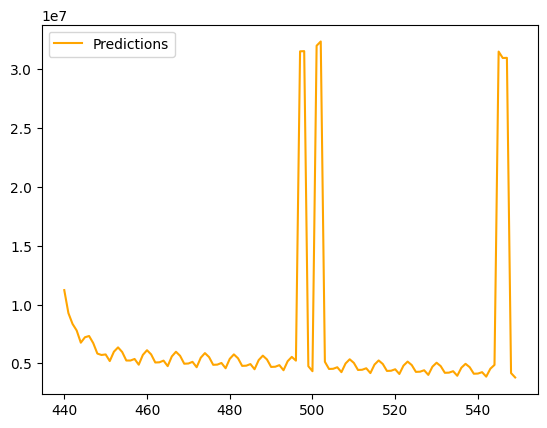

In [3395]:
predictions.plot(legend = True , color = "orange")

In [3396]:
ax.autoscale (axis = "x" , tight = True)

In [3397]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3398]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

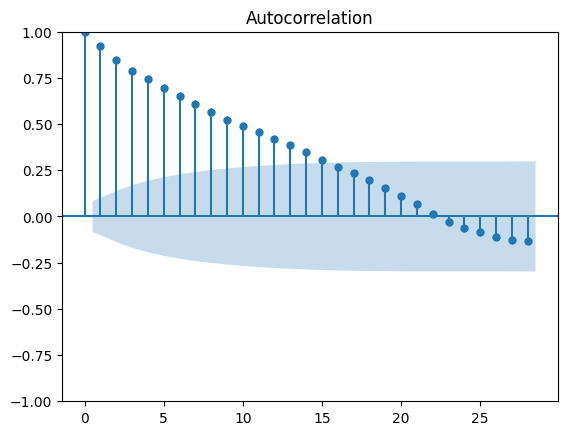

In [3399]:
plot_acf(df6["ru"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


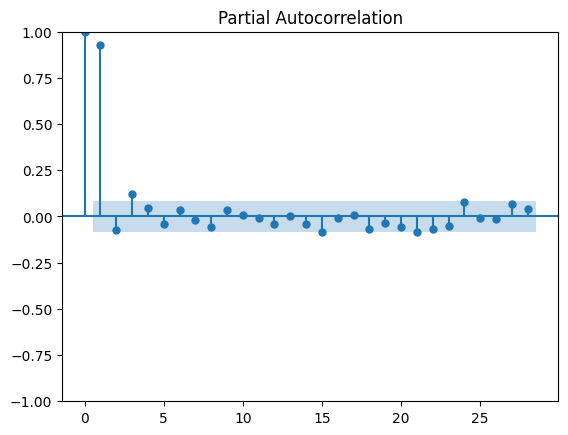

In [3400]:
plot_pacf(df6["ru"])
plt.show()

## **Facebook Prophet**

In [3401]:
df6_exog.head()

,Date,ru,Exog
0,2015-07-01,9.786120e+06,0
1,2015-07-02,9.840218e+06,0
2,2015-07-03,9.153942e+06,0
3,2015-07-04,8.600905e+06,0
4,2015-07-05,9.446731e+06,0


In [3402]:
df6_fb = df6_exog.copy()

In [3403]:
df6_fb.head()

,Date,ru,Exog
0,2015-07-01,9.786120e+06,0
1,2015-07-02,9.840218e+06,0
2,2015-07-03,9.153942e+06,0
3,2015-07-04,8.600905e+06,0
4,2015-07-05,9.446731e+06,0


In [3404]:
df6_fb["ds"] = pd.to_datetime(df6_fb["Date"])

In [3405]:
df6_fb["y"] = df6_fb["ru"]

In [3406]:
df6_fb = df6_fb[["ds" , "y" , "Exog"]]

In [3407]:
df6_fb.head()

,ds,y,Exog
0,2015-07-01,9.786120e+06,0
1,2015-07-02,9.840218e+06,0
2,2015-07-03,9.153942e+06,0
3,2015-07-04,8.600905e+06,0
4,2015-07-05,9.446731e+06,0


In [3408]:
from fbprophet import Prophet

In [3409]:
m = Prophet()

In [3410]:
m.fit(df6_fb[["ds" , "y"]][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3411]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [3412]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3413]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,1.113951e+07,3.035147e+06,1.859712e+07,1.113951e+07,1.113951e+07,-140340.797557,-140340.797557,-140340.797557,-140340.797557,-140340.797557,-140340.797557,0.0,0.0,0.0,1.099917e+07
1,2015-07-02,1.115751e+07,3.012625e+06,1.870372e+07,1.115751e+07,1.115751e+07,-253885.209544,-253885.209544,-253885.209544,-253885.209544,-253885.209544,-253885.209544,0.0,0.0,0.0,1.090363e+07
2,2015-07-03,1.117552e+07,3.356294e+06,1.883993e+07,1.117552e+07,1.117552e+07,-699074.413438,-699074.413438,-699074.413438,-699074.413438,-699074.413438,-699074.413438,0.0,0.0,0.0,1.047645e+07
3,2015-07-04,1.119353e+07,3.367283e+06,1.846436e+07,1.119353e+07,1.119353e+07,-393021.736322,-393021.736322,-393021.736322,-393021.736322,-393021.736322,-393021.736322,0.0,0.0,0.0,1.080051e+07
4,2015-07-05,1.121154e+07,4.326752e+06,1.961112e+07,1.121154e+07,1.121154e+07,598823.404228,598823.404228,598823.404228,598823.404228,598823.404228,598823.404228,0.0,0.0,0.0,1.181036e+07


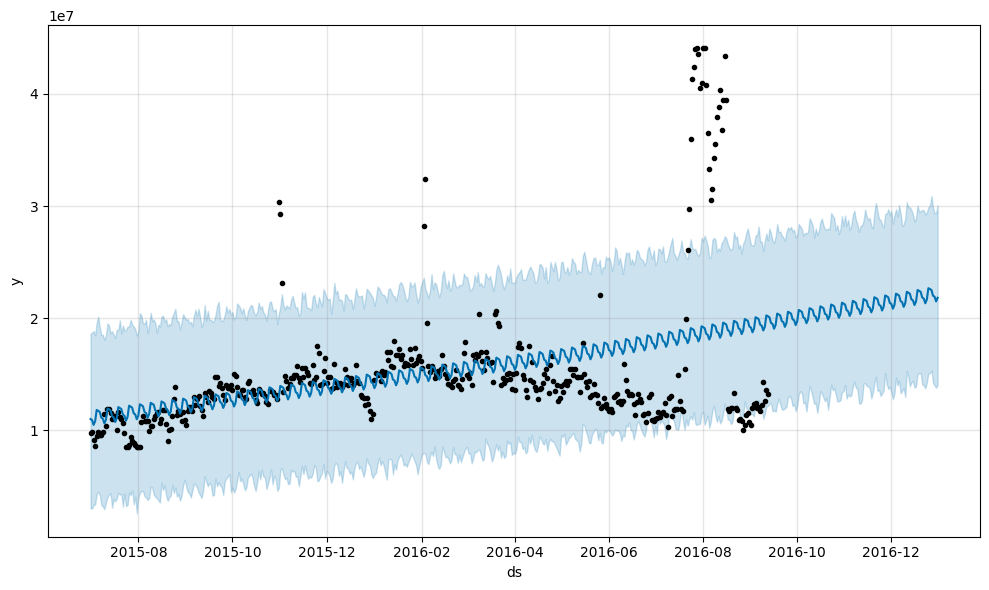

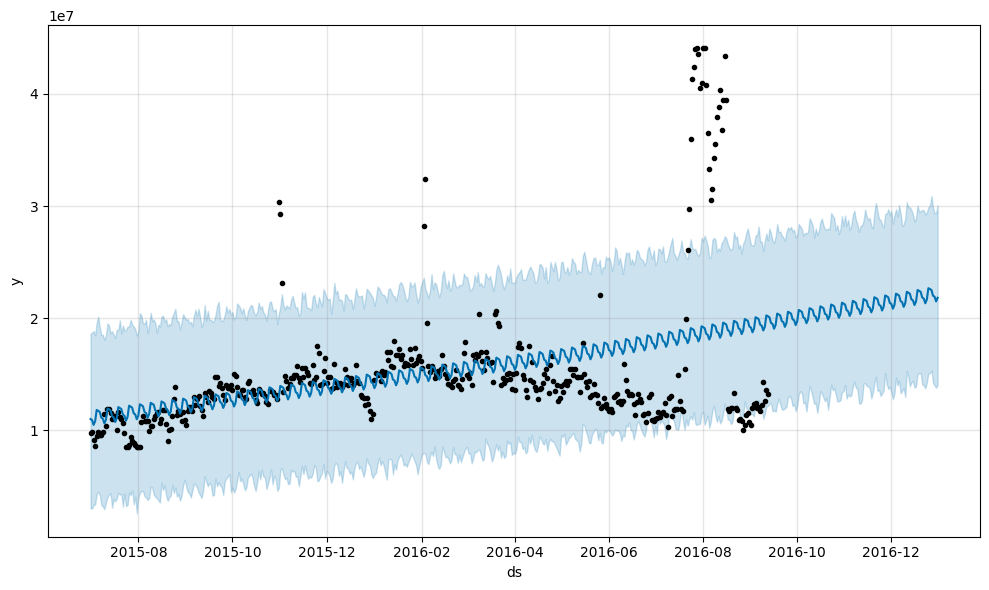

In [3414]:
m.plot(forecast)

In [3415]:
performance(df6_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 3430888.158
RMSE 5991278.023
MAPE 0.204


### **without Exog Variable**

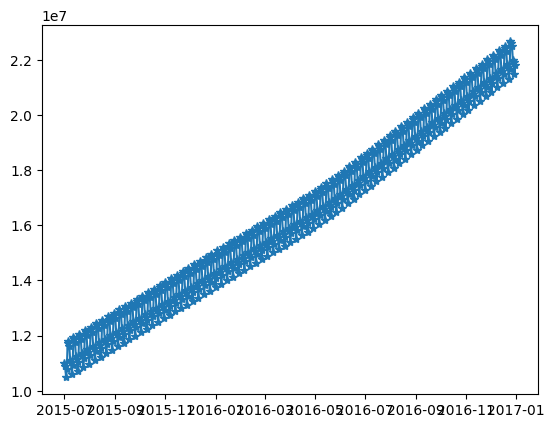

In [3416]:
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

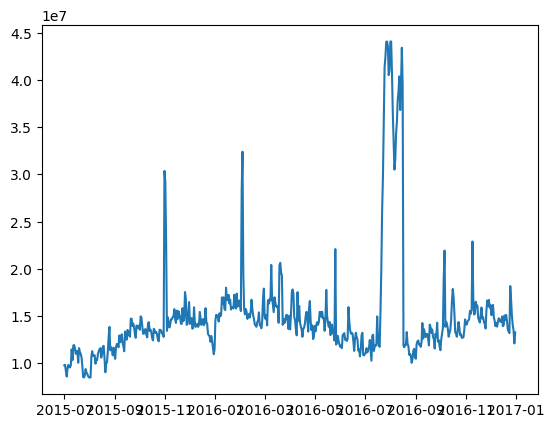

In [3417]:
plt.plot(df6_fb["ds"] , df6_fb["y"] , label = "actual")

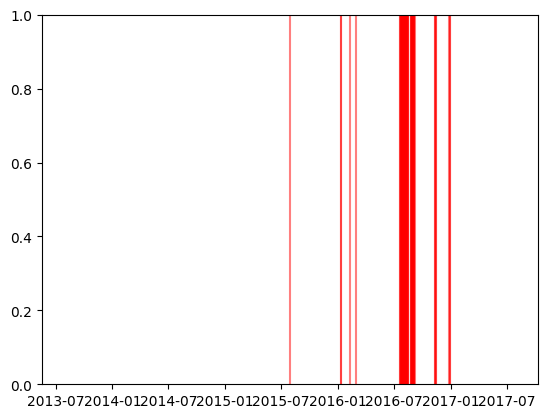

In [3418]:
for x in df6_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

### **with Exog Variable**

In [3419]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [3420]:
model2.add_regressor("Exog")

In [3421]:
model2.fit(df6_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3422]:
forecast2 = model2.predict(df6_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


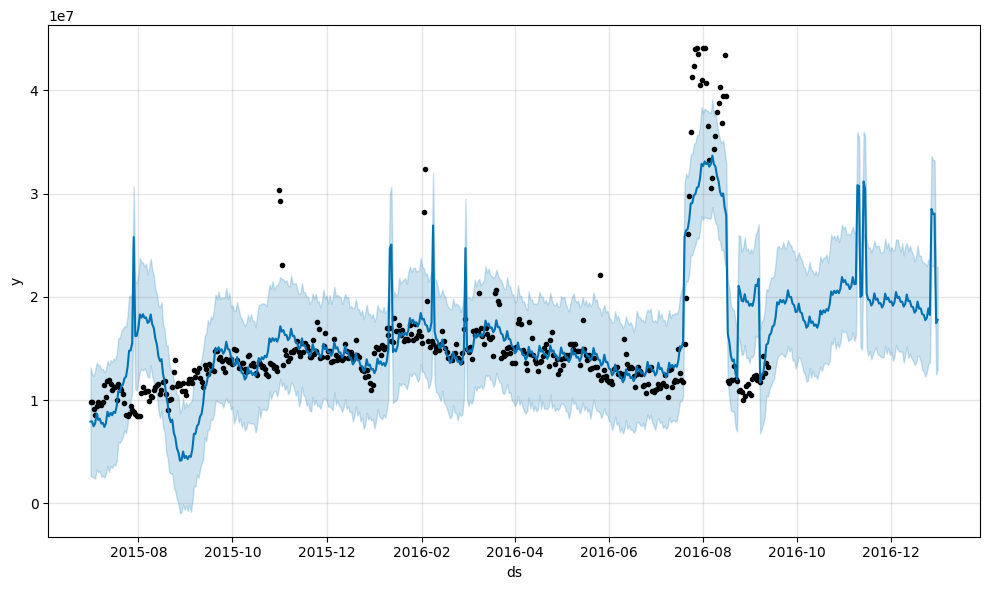

In [3423]:
fig = model2.plot(forecast2)

In [3424]:
performance(df6_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 2523965.101
RMSE 4034653.683
MAPE 0.175


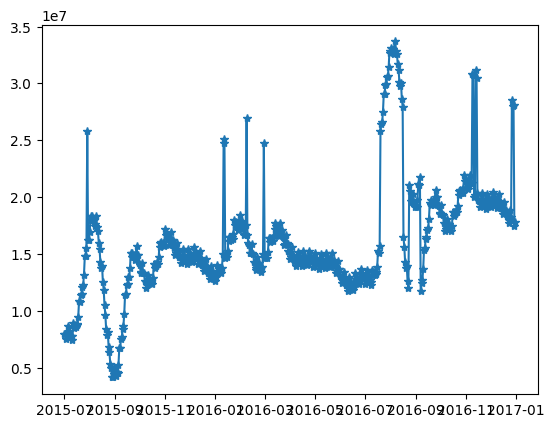

In [3425]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

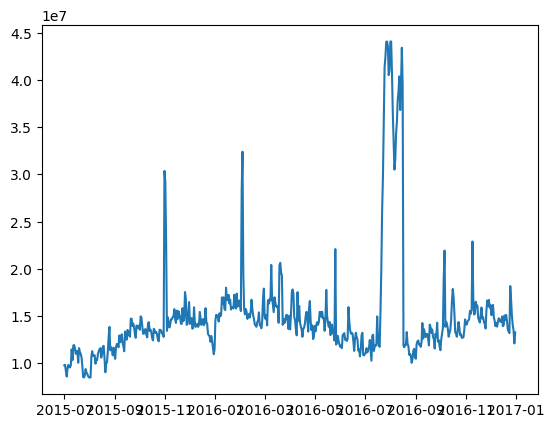

In [3426]:
plt.plot(df6_fb["ds"] , df6_fb["y"] , label = "actual")

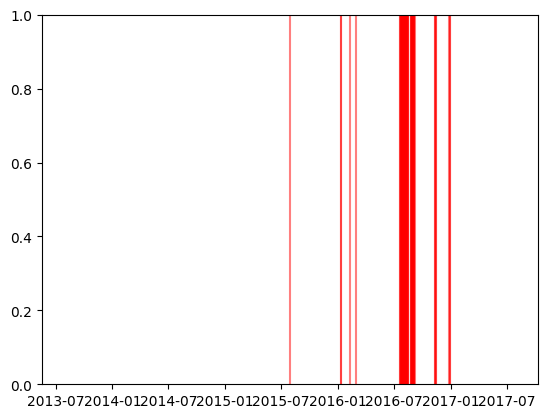

In [3427]:
for x in df6_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Seventh Language is "zh"**

## **Observation**

In [3428]:
df7 = df_new[["Date" , "zh"]]
df7.head()

,Date,zh
0,2015-07-01,5.209287e+06
1,2015-07-02,4.619392e+06
2,2015-07-03,4.600883e+06
3,2015-07-04,4.473034e+06
4,2015-07-05,4.780044e+06


In [3429]:
df7.columns

Index(['Date', 'zh'], dtype='object')

In [3430]:
df7.dtypes

Date    datetime64[ns]
zh             float64
dtype: object

In [3431]:
df7.shape

(550, 2)

In [3432]:
df7["zh"].describe()

count    5.500000e+02
mean     6.323135e+06
std      1.168683e+06
min      3.428565e+06
25%      5.695329e+06
50%      6.305799e+06
75%      6.824057e+06
max      1.740032e+07
Name: zh, dtype: float64

In [3433]:
df7["Date"].describe()

<ipython-input-3433-9d03db671853>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df7["Date"].describe()


count                     550
unique                    550
top       2015-07-01 00:00:00
freq                        1
first     2015-07-01 00:00:00
last      2016-12-31 00:00:00
Name: Date, dtype: object

<Axes: >

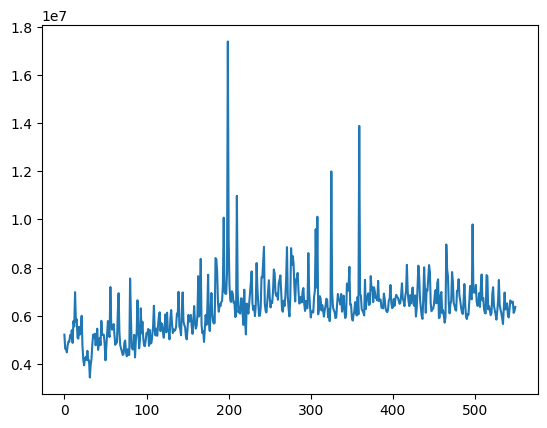

In [3434]:
df7["zh"].plot()

[]

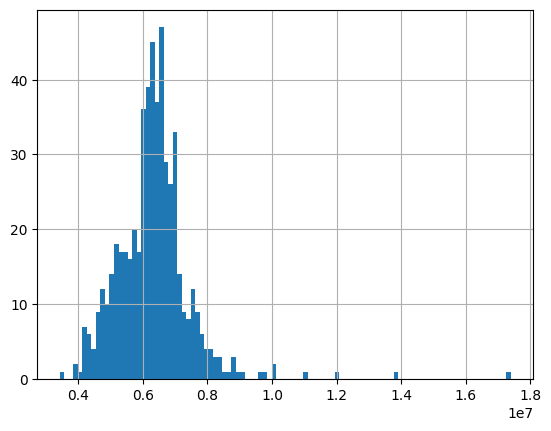

In [3435]:
df7["zh"].hist(bins = 100).plot()

In [3436]:
lower = df7["zh"].quantile(.005)
lower

4081195.982900033

In [3437]:
upper = df7["zh"].quantile(.995)
upper

11240517.267817877

In [3438]:
df7["zh"]

/usr/local/lib/python3.9/dist-packages/IPython/core/displayhook.py:275: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


0      5.209287e+06
1      4.619392e+06
2      4.600883e+06
3      4.473034e+06
4      4.780044e+06
           ...     
545    6.537046e+06
546    6.582466e+06
547    6.114926e+06
548    6.195747e+06
549    6.360672e+06
Name: zh, Length: 550, dtype: float64

In [3439]:
df7[df7["zh"] > upper]

,Date,zh
199,2016-01-16,1.740032e+07
325,2016-05-21,1.199585e+07
359,2016-06-24,1.389022e+07


In [3440]:
df7[df7["zh"] < lower]

,Date,zh
24,2015-07-25,3.933950e+06
31,2015-08-01,3.428565e+06
32,2015-08-02,3.950779e+06


In [3441]:
df7["zh"] = df7["zh"].clip(upper , lower )

<ipython-input-3441-4f149eeb9d66>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df7["zh"] = df7["zh"].clip(upper , lower )


<Axes: >

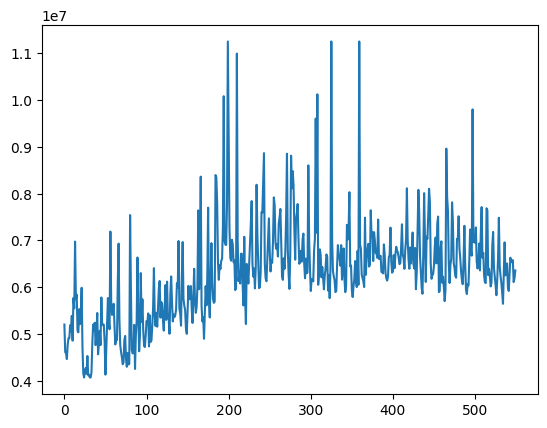

In [3442]:
df7["zh"].plot()

In [3443]:
df7_exog = pd.concat([df7, exog], axis=1)
df7_exog

,Date,zh,Exog
0,2015-07-01,5.209287e+06,0
1,2015-07-02,4.619392e+06,0
2,2015-07-03,4.600883e+06,0
3,2015-07-04,4.473034e+06,0
4,2015-07-05,4.780044e+06,0
...,...,...,...
545,2016-12-27,6.537046e+06,1
546,2016-12-28,6.582466e+06,1
547,2016-12-29,6.114926e+06,1
548,2016-12-30,6.195747e+06,0


## **Decomposition Time Series**

In [3444]:
df7.set_index("Date" , inplace = True)

In [3445]:
model = sm.tsa.seasonal_decompose(df7["zh"] , model = "additive")

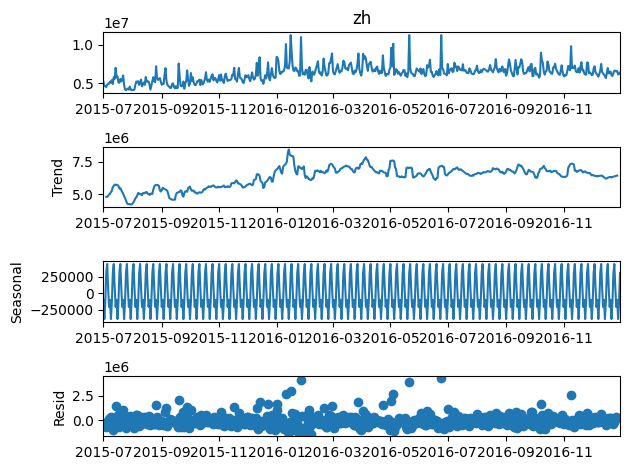

In [3446]:
model.plot()
plt.show()

In [3447]:
model = sm.tsa.seasonal_decompose(df7["zh"] , model = "multiplicative")

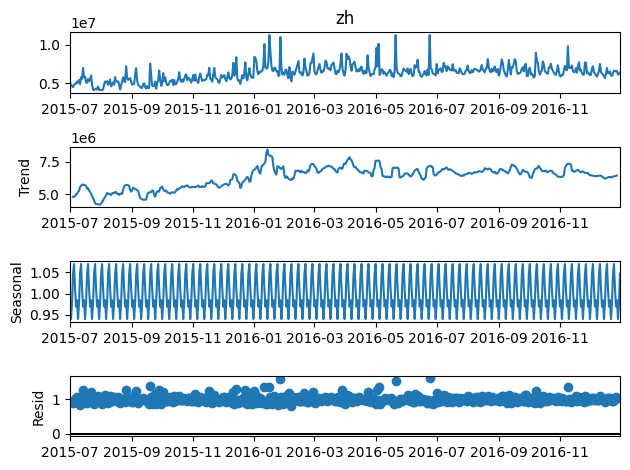

In [3448]:
model.plot()
plt.show()

## **Dickey-Fuller test**

In [3449]:
def adf_test (data , significance_level = 0.05):

  p_value = sm.tsa.stattools.adfuller(data)[1]

  if p_value <= significance_level :
    print("Sequence is Stationary")
  else:
    print("Sequence is not Stationary")

### **Decomposition**

In [3450]:
model = sm.tsa.seasonal_decompose(df7["zh"] , model = "additive")

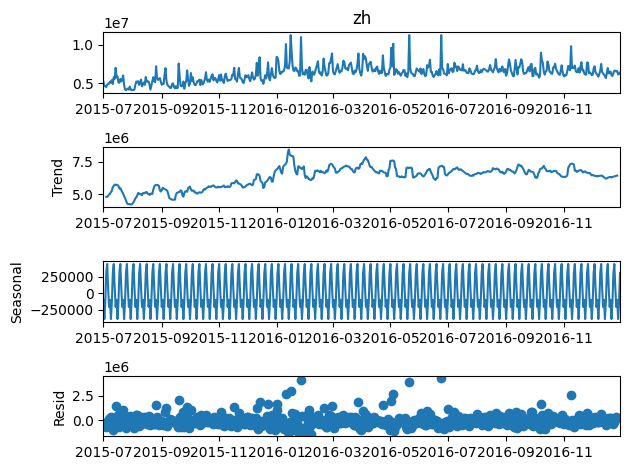

In [3451]:
model.plot()
plt.show()

<Axes: xlabel='Date'>

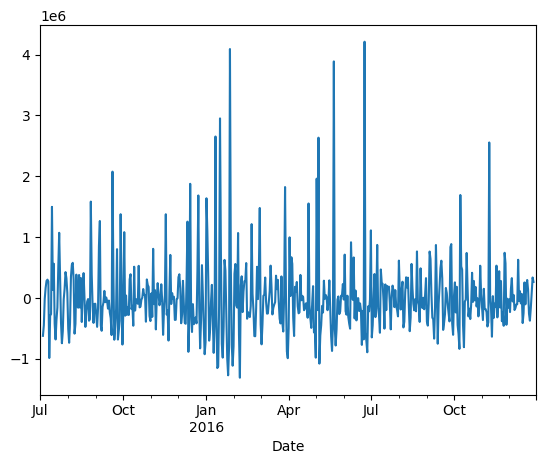

In [3452]:
model.resid.plot()

In [3453]:
adf_test(model.resid.dropna())

Sequence is Stationary


### **Differencing (De-Trending)**

In [3454]:
model = sm.tsa.seasonal_decompose(df7["zh"] , model = "additive")

<Axes: xlabel='Date'>

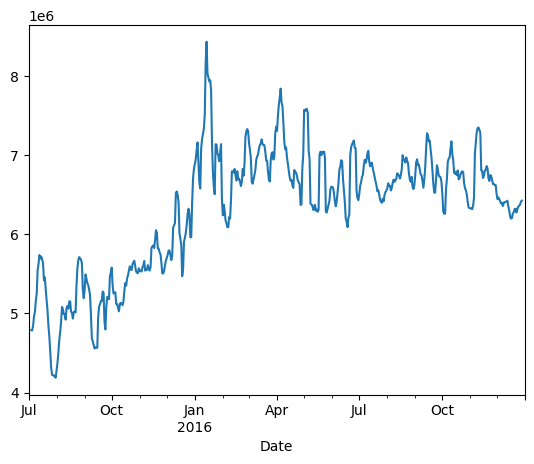

In [3455]:
model.trend.plot()

<Axes: xlabel='Date'>

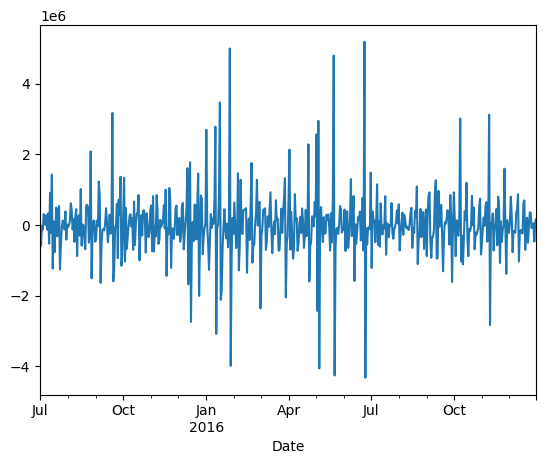

In [3456]:
df7["zh"].diff(1).plot()

In [3457]:
adf_test(df7["zh"].diff(1).dropna())

Sequence is Stationary


### **m-Differencing (De-Seasonality)**

<Axes: xlabel='Date'>

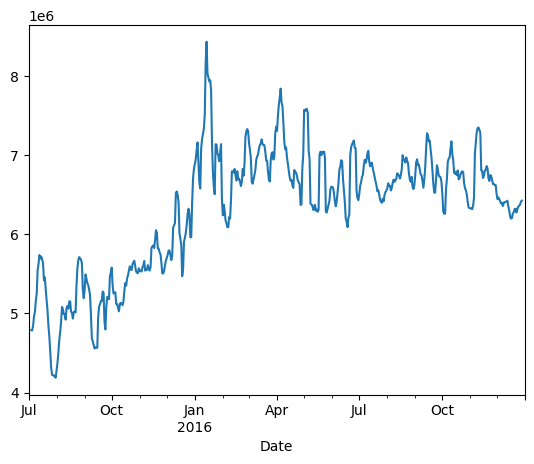

In [3458]:
model.trend.plot()

<Axes: xlabel='Date'>

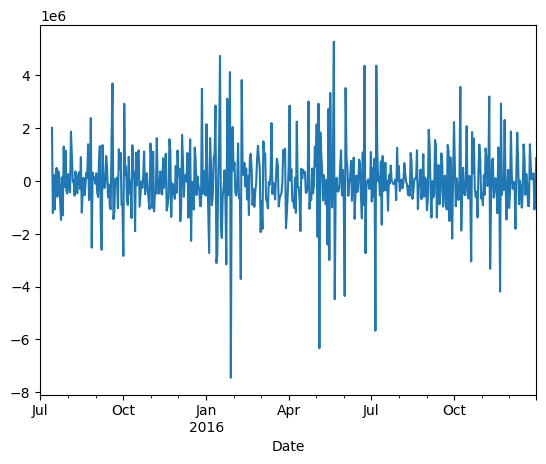

In [3459]:
df7["zh"].diff(1).diff(12).plot()

In [3460]:
adf_test(df7["zh"].diff(1).diff(12).dropna())

Sequence is Stationary


## **Training the model**

In [3461]:
df7.head()

,zh
Date,
2015-07-01,5.209287e+06
2015-07-02,4.619392e+06
2015-07-03,4.600883e+06
2015-07-04,4.473034e+06
2015-07-05,4.780044e+06


In [3462]:
df7.reset_index(inplace = True)

In [3463]:
df7.head()

,Date,zh
0,2015-07-01,5.209287e+06
1,2015-07-02,4.619392e+06
2,2015-07-03,4.600883e+06
3,2015-07-04,4.473034e+06
4,2015-07-05,4.780044e+06


In [3464]:
train_x = df7.loc[df7.index < df7.index[-110]].copy()

In [3465]:
test_x = df7.loc[df7.index >= df7.index[-110]].copy()

In [3466]:
train_x.head()

,Date,zh
0,2015-07-01,5.209287e+06
1,2015-07-02,4.619392e+06
2,2015-07-03,4.600883e+06
3,2015-07-04,4.473034e+06
4,2015-07-05,4.780044e+06


In [3467]:
test_x.head()

,Date,zh
440,2016-09-13,6.116271e+06
441,2016-09-14,7.080941e+06
442,2016-09-15,7.032672e+06
443,2016-09-16,7.531444e+06
444,2016-09-17,8.102312e+06


In [3468]:
def performance(actual , predicted):

  print("MAE" , round(mae(actual , predicted) ,3))
  print("RMSE" , round(mse(actual , predicted)**.5 ,3))
  print("MAPE" , round(mape(actual , predicted) ,3))

## **ARIMA**

In [3469]:
adf_test(train_x["zh"])

Sequence is not Stationary


In [3470]:
model = SARIMAX(train_x["zh"] , order = (15,1,15))

In [3471]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3472]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

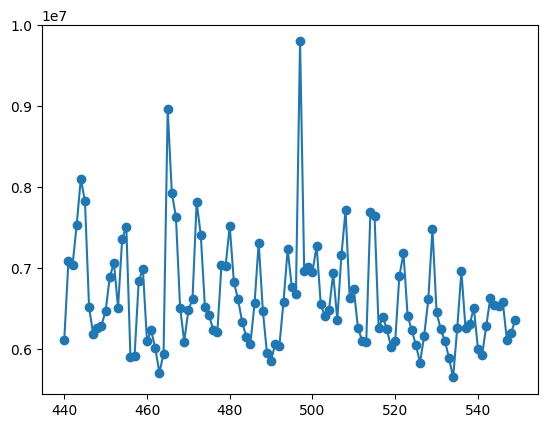

In [3473]:
test_x["zh"].plot(style = "-o")

In [3474]:
test_x["zh"].isnull().sum()

0

<Axes: >

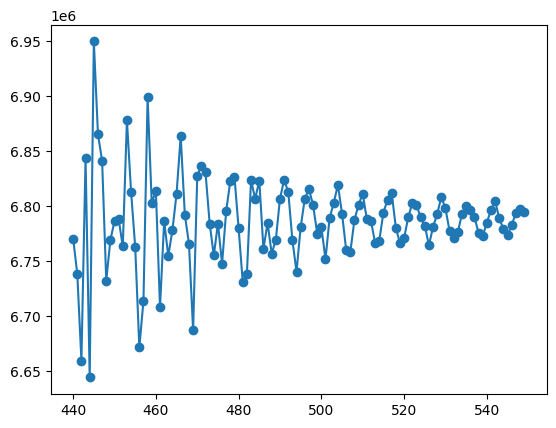

In [3475]:
test_x["pred"].plot(style = "-o")

In [3476]:
test_x["pred"].isnull().sum()

0

In [3477]:
performance(test_x["zh"] , test_x["pred"])

MAE 545548.463
RMSE 673817.773
MAPE 0.082


## **SARIMA**

In [3478]:
adf_test(train_x["zh"])

Sequence is not Stationary


In [3479]:
model = SARIMAX(train_x["zh"] , order = (10,1,10) , seasonal_order = (1,1,1,12))

In [3480]:
model = model.fit(disp= False)

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [3481]:
test_x["pred"] = model.forecast(steps = 110)

<Axes: >

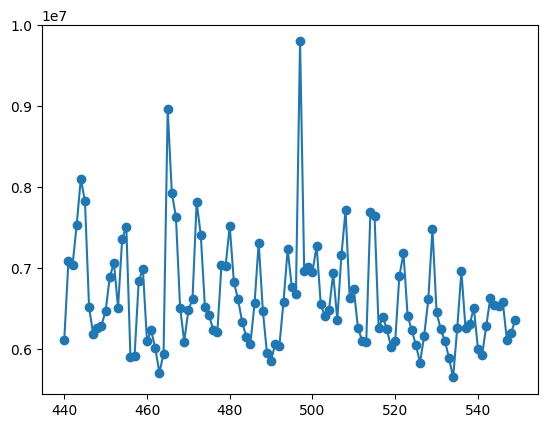

In [3482]:
test_x["zh"].plot(style = "-o")

In [3483]:
test_x["zh"].isnull().sum()

0

<Axes: >

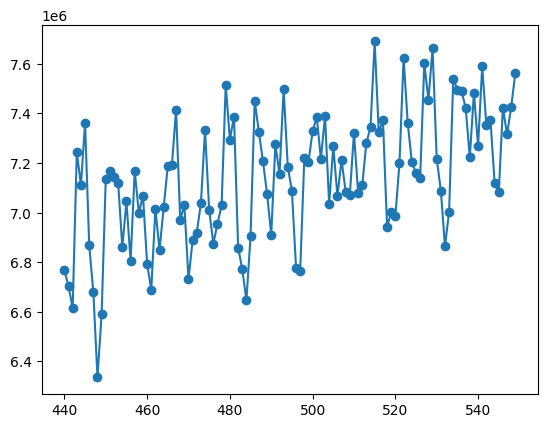

In [3484]:
test_x["pred"].plot(style = "-o")

In [3485]:
test_x["pred"].isnull().sum()

0

In [3486]:
performance(test_x["zh"] , test_x["pred"])

MAE 710520.657
RMSE 846296.714
MAPE 0.11


## **SARIMAX without EXOG**

In [3487]:
train = df7_exog.iloc[:440]
train.head()

,Date,zh,Exog
0,2015-07-01,5.209287e+06,0
1,2015-07-02,4.619392e+06,0
2,2015-07-03,4.600883e+06,0
3,2015-07-04,4.473034e+06,0
4,2015-07-05,4.780044e+06,0


In [3488]:
test = df7_exog.iloc[440:]
test.head()

,Date,zh,Exog
440,2016-09-13,6.116271e+06,0
441,2016-09-14,7.080941e+06,0
442,2016-09-15,7.032672e+06,0
443,2016-09-16,7.531444e+06,0
444,2016-09-17,8.102312e+06,0


In [3489]:
model = SARIMAX(train["zh"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3490]:
results = model.fit(disp=False)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


In [3491]:
fc = results.forecast(110)

In [3492]:
start = len(train_x)

In [3493]:
end = len(train_x) + len(test_x) - 1

In [3494]:
predictions = results.predict(start = start , end = end)
predictions

440    6.596888e+06
441    6.508484e+06
442    6.277575e+06
443    6.499276e+06
444    6.771396e+06
           ...     
545    6.439940e+06
546    6.381037e+06
547    6.165398e+06
548    6.388077e+06
549    6.657577e+06
Name: predicted_mean, Length: 110, dtype: float64

In [3495]:
performance(test["zh"] , predictions)

MAE 385115.603
RMSE 572911.117
MAPE 0.056


***Plot predictions against known values***

In [3496]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

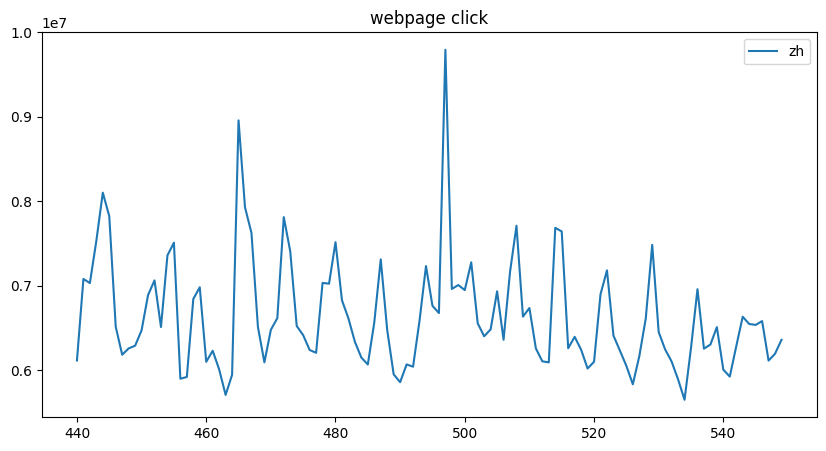

In [3497]:
ax = test["zh"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

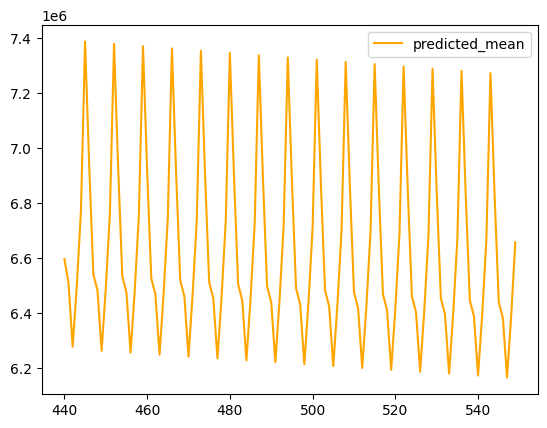

In [3498]:
predictions.plot(legend = True , color = "orange")

In [3499]:
ax.autoscale (axis = "x" , tight = True)

In [3500]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3501]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **SARIMAX with EXOG**

In [3502]:
train = df7_exog.iloc[:440]
train.head()

,Date,zh,Exog
0,2015-07-01,5.209287e+06,0
1,2015-07-02,4.619392e+06,0
2,2015-07-03,4.600883e+06,0
3,2015-07-04,4.473034e+06,0
4,2015-07-05,4.780044e+06,0


In [3503]:
test = df7_exog.iloc[440:]
test.head()

,Date,zh,Exog
440,2016-09-13,6.116271e+06,0
441,2016-09-14,7.080941e+06,0
442,2016-09-15,7.032672e+06,0
443,2016-09-16,7.531444e+06,0
444,2016-09-17,8.102312e+06,0


In [3504]:
model = SARIMAX(train["zh"] , exog = train["Exog"] , order = (1,0,0) , seasonal_order = (1,0,1,7))

In [3505]:
results = model.fit(disp=False)

In [3506]:
exog_forecast = test[["Exog"]]

In [3507]:
start = len(train_x)

In [3508]:
end = len(train_x) + len(test_x) - 1

In [3509]:
predictions = results.predict(start = start , end = end , exog = exog_forecast).rename("Predictions")
predictions

440    6.271469e+06
441    6.030910e+06
442    5.450594e+06
443    5.486925e+06
444    5.467828e+06
           ...     
545    1.041879e+07
546    1.057684e+07
547    1.035317e+07
548    3.899072e+06
549    4.090565e+06
Name: Predictions, Length: 110, dtype: float64

In [3510]:
performance(test["zh"] , predictions)

MAE 2481307.716
RMSE 2566281.134
MAPE 0.373


***Plot predictions against known values***

In [3511]:
title = "webpage click"
xlabel = "days"
ylabel = "click per day"

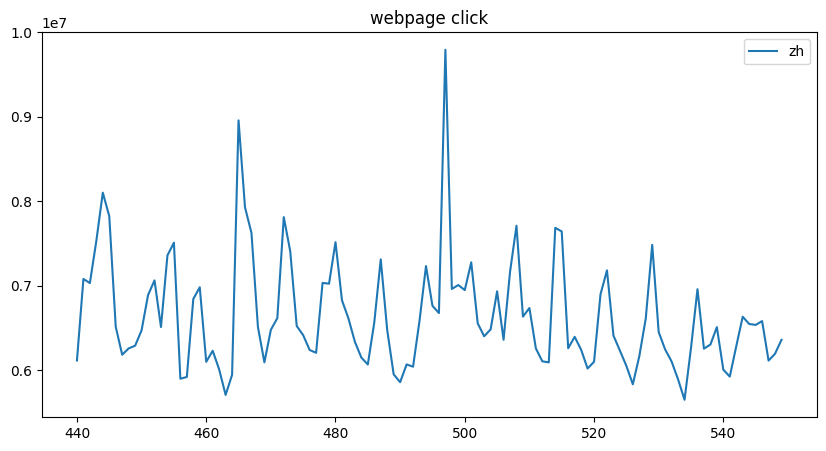

In [3512]:
ax = test["zh"].plot(legend = True , title = title , figsize = (10,5))

<Axes: >

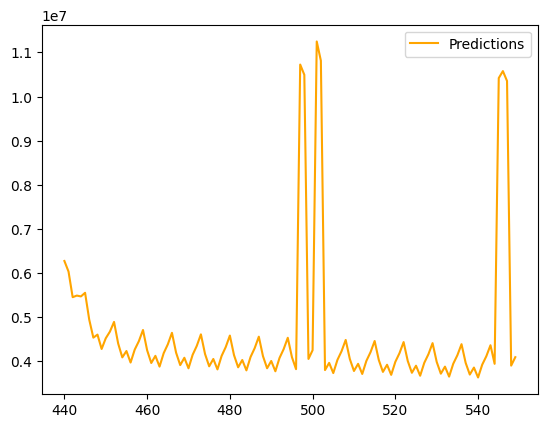

In [3513]:
predictions.plot(legend = True , color = "orange")

In [3514]:
ax.autoscale (axis = "x" , tight = True)

In [3515]:
ax.set(xlabel = xlabel , ylabel = ylabel)

[Text(0.5, 4.444444444444445, 'days'),
 Text(4.444444444444452, 0.5, 'click per day')]

In [3516]:
for x in test.query ("Exog == 1").index:
  ax.axvline(x=x , color="red" , alpha=0.5)

## **ACF and PACF plot**

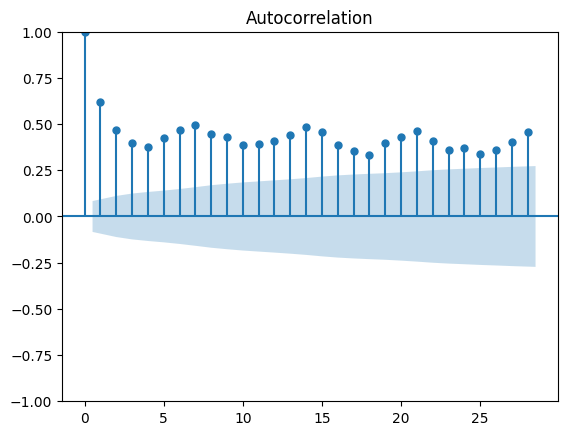

In [3517]:
plot_acf(df7["zh"])
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


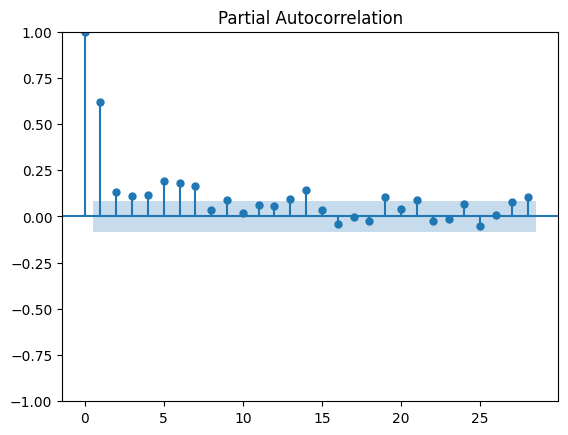

In [3518]:
plot_pacf(df7["zh"])
plt.show()

## **Facebook Prophet**

In [3519]:
df7_exog.head()

,Date,zh,Exog
0,2015-07-01,5.209287e+06,0
1,2015-07-02,4.619392e+06,0
2,2015-07-03,4.600883e+06,0
3,2015-07-04,4.473034e+06,0
4,2015-07-05,4.780044e+06,0


In [3520]:
df7_fb = df7_exog.copy()

In [3521]:
df7_fb.head()

,Date,zh,Exog
0,2015-07-01,5.209287e+06,0
1,2015-07-02,4.619392e+06,0
2,2015-07-03,4.600883e+06,0
3,2015-07-04,4.473034e+06,0
4,2015-07-05,4.780044e+06,0


In [3522]:
df7_fb["ds"] = pd.to_datetime(df7_fb["Date"])

In [3523]:
df7_fb["y"] = df7_fb["zh"]

In [3524]:
df7_fb = df7_fb[["ds" , "y" , "Exog"]]

In [3525]:
df7_fb.head()

,ds,y,Exog
0,2015-07-01,5.209287e+06,0
1,2015-07-02,4.619392e+06,0
2,2015-07-03,4.600883e+06,0
3,2015-07-04,4.473034e+06,0
4,2015-07-05,4.780044e+06,0


In [3526]:
from fbprophet import Prophet

In [3527]:
m = Prophet()

In [3528]:
m.fit(df7_fb[["ds" , "y"]][:-110])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3529]:
future = m.make_future_dataframe(freq = "D" , periods = 110)

In [3530]:
forecast = m.predict(future)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3531]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,4.719268e+06,3.644928e+06,5.623089e+06,4.719268e+06,4.719268e+06,-106069.063931,-106069.063931,-106069.063931,-106069.063931,-106069.063931,-106069.063931,0.0,0.0,0.0,4.613199e+06
1,2015-07-02,4.726573e+06,3.326803e+06,5.360016e+06,4.726573e+06,4.726573e+06,-386601.387010,-386601.387010,-386601.387010,-386601.387010,-386601.387010,-386601.387010,0.0,0.0,0.0,4.339972e+06
2,2015-07-03,4.733879e+06,3.566673e+06,5.666735e+06,4.733879e+06,4.733879e+06,-83191.418530,-83191.418530,-83191.418530,-83191.418530,-83191.418530,-83191.418530,0.0,0.0,0.0,4.650687e+06
3,2015-07-04,4.741184e+06,4.059593e+06,5.983979e+06,4.741184e+06,4.741184e+06,276853.261133,276853.261133,276853.261133,276853.261133,276853.261133,276853.261133,0.0,0.0,0.0,5.018037e+06
4,2015-07-05,4.748489e+06,4.014519e+06,6.185715e+06,4.748489e+06,4.748489e+06,385792.272044,385792.272044,385792.272044,385792.272044,385792.272044,385792.272044,0.0,0.0,0.0,5.134281e+06


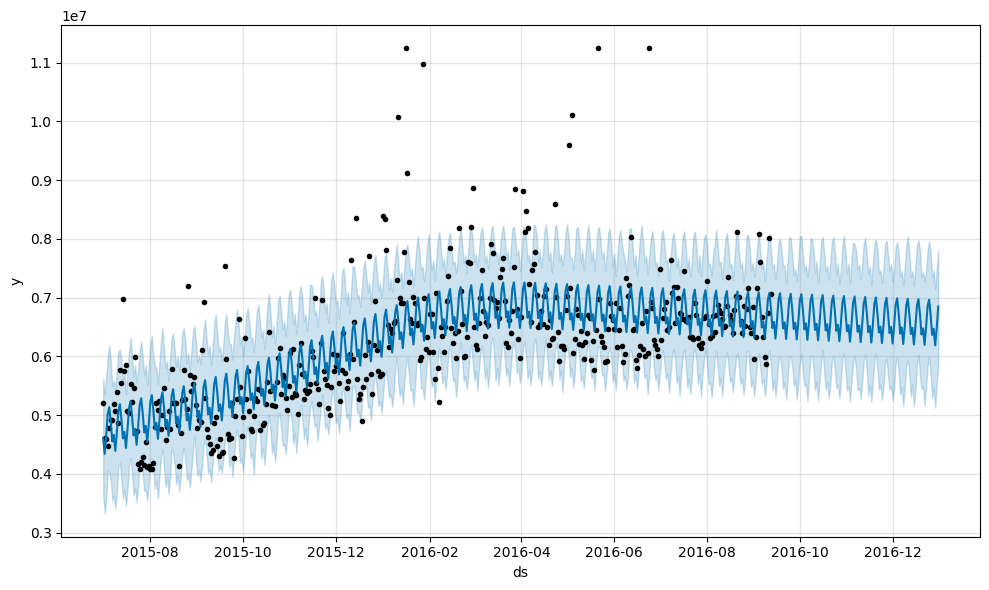

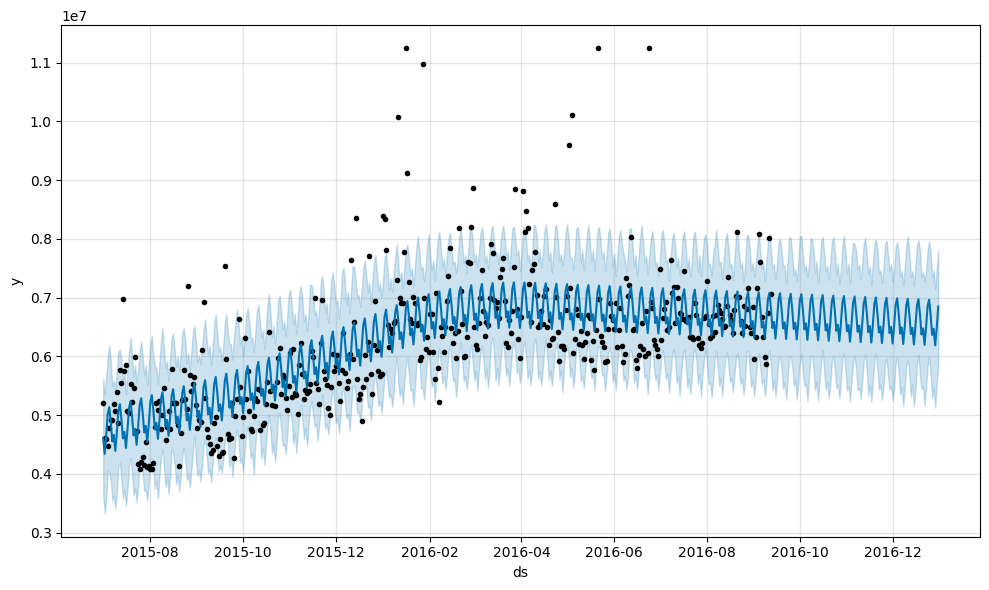

In [3532]:
m.plot(forecast)

In [3533]:
performance(df7_fb["y"][:-110] , forecast["yhat"][:-110])

MAE 524271.608
RMSE 783870.608
MAPE 0.082


### **without Exog Variable**

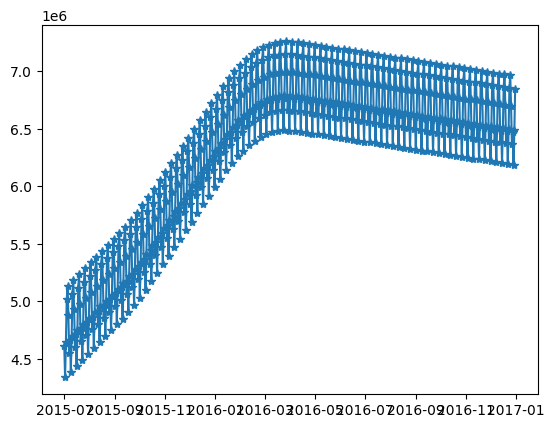

In [3534]:
plt.plot(forecast["ds"] , forecast["yhat"] , "-*" , label = "predictions")

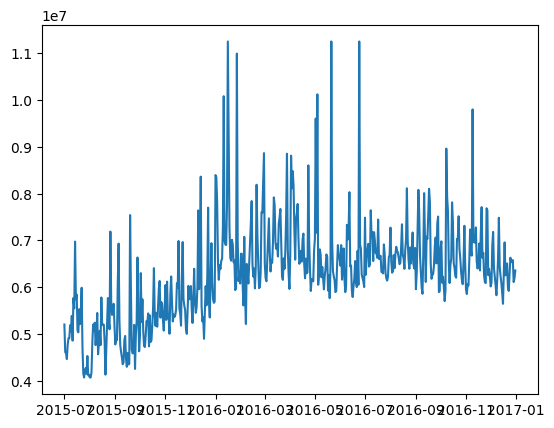

In [3535]:
plt.plot(df7_fb["ds"] , df7_fb["y"] , label = "actual")

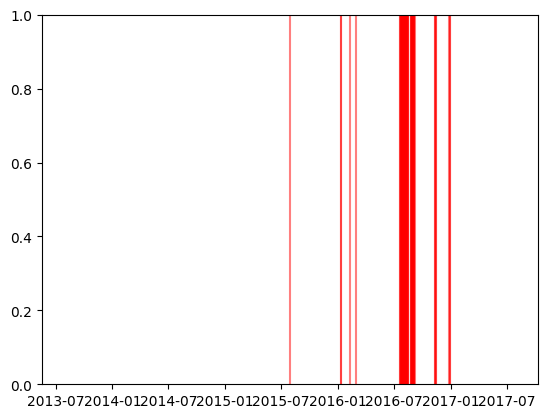

In [3536]:
for x in df7_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

### **with Exog Variable**

In [3537]:
model2 = Prophet(yearly_seasonality = True , weekly_seasonality = True )

In [3538]:
model2.add_regressor("Exog")

In [3539]:
model2.fit(df7_fb[:-110])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [3540]:
forecast2 = model2.predict(df7_fb)

/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/usr/local/lib/python3.9/dist-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


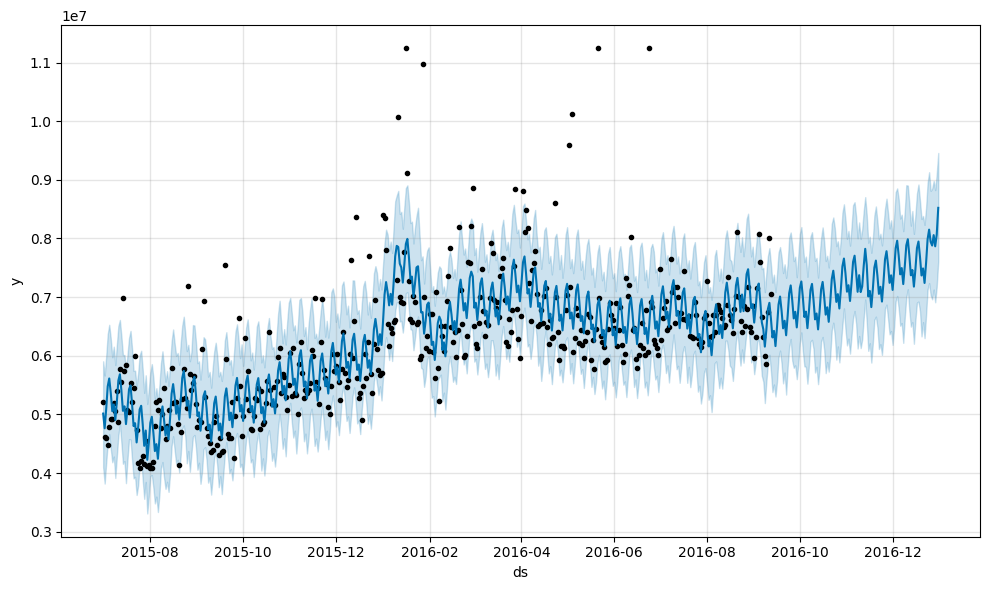

In [3541]:
fig = model2.plot(forecast2)

In [3542]:
performance(df7_fb["y"][:-110] , forecast2["yhat"][:-110])

MAE 472841.72
RMSE 721771.406
MAPE 0.073


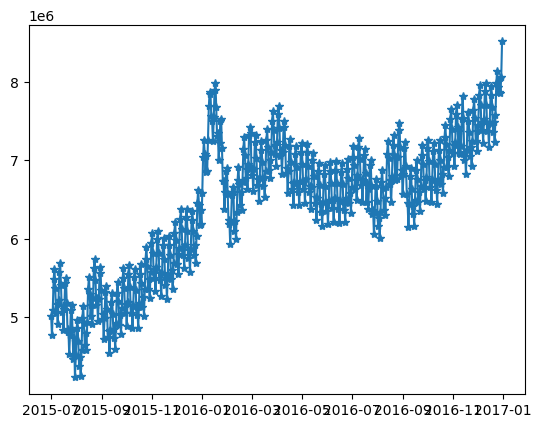

In [3543]:
plt.plot(forecast2["ds"] , forecast2["yhat"] , "-*" , label = "predictions")

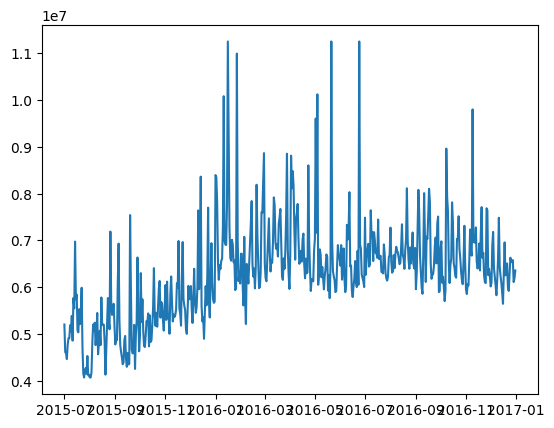

In [3544]:
plt.plot(df7_fb["ds"] , df7_fb["y"] , label = "actual")

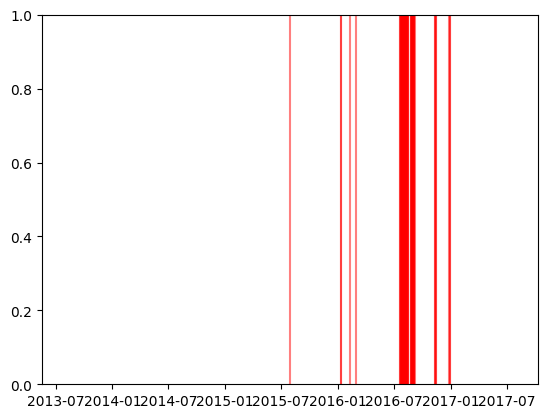

In [3545]:
for x in df7_fb.query ("Exog == 1")["ds"]:
  plt.axvline (x=x , color = "red" , alpha=0.5)

# **Questionnare**

**1.** **Defining the problem statements and where can this and modifications of this be used?**

***Answer -***

**2.** **Write 3 inferences you made from the data visualizations.**

***Answer -*** The 3 inferences made from the data visualizations such as-

a. There are 550 Dates from "2015-07-01" to "2016-12-31".

b. There are 7 languages in wikipedia.org has 'de', 'en', 'es', 'fr', 'ja', 'ru',  'zh'.

c. There are 2 types of web-page such as - "wikipedia.org" , "wikimedia.org" and "mediawiki.org".

**3.** **What does the decomposition of series do?**

***Answer -*** It breaks the original plot of data into 3 types such as -

a. Trend

b. Seasonality  

c. Error

**4.** **What level of differencing gave you a stationary series?**

***Answer -*** 3 level of differencing gave you a stationary series such as-

a. Decomposition

b. Differencing

c. m-Differencing

**5.** **Difference between arima, sarima & sarimax.**

***Answer -*** The difference between ARIMA and SARIMA (SARIMAX) is about the seasonality of the dataset. if your data is seasonal, like it happen after a certain period of time. then we will use SARIMA. here we will have to add one more term that is seasonal_order (p,d,q,period) p,q,d values will remains the same

**6.** **Compare the number of views in different languages.**

***Answer -*** The number of views in 7 different languages are - 

en    24108

ja    20431

de    18547

fr    17802

zh    17229

ru    15022

es    14069

**7.** **What other methods other than grid search would be suitable to get the model for all languages?**

***Answer -*** SARIMAX methods other than grid search would be suitable to get the model for all languages